<a href="https://colab.research.google.com/github/AhmadProjects-git/Autonomous-SelfHealing-Infrastructure/blob/main/Ahmed_Hassan_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ============================================================
# COMPLETE End-to-End Multi-Class TCN IDS Pipeline
# (Google Drive dataset download + FIXED datetime handling)
# Generates MAX graphs + tables in OUTDIR
# ============================================================

import os, json, random, warnings
from collections import Counter

import numpy as np
import pandas as pd
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import (
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_auc_score, average_precision_score,
    precision_recall_curve, roc_curve
)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, optimizers

# ============================================================
# 0) Reproducibility + Output helpers
# ============================================================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

OUTDIR = "/content/iot_tcn_outputs" if os.path.exists("/content") else "./iot_tcn_outputs"
os.makedirs(OUTDIR, exist_ok=True)

def savefig(name, dpi=250):
    path = os.path.join(OUTDIR, name)
    plt.savefig(path, dpi=dpi, bbox_inches="tight")
    plt.close()
    return path

def save_table_csv(df, name):
    path = os.path.join(OUTDIR, name)
    df.to_csv(path, index=False)
    return path

def plot_dataframe_table(df, title, filename, max_rows=25, max_cols=12):
    d = df.copy()
    if len(d) > max_rows:
        d = d.head(max_rows)
    if d.shape[1] > max_cols:
        d = d.iloc[:, :max_cols]
    fig, ax = plt.subplots(figsize=(min(18, 1.4*d.shape[1]), min(10, 0.5*len(d)+2)))
    ax.axis("off")
    ax.set_title(title, fontsize=12, pad=10)
    tbl = ax.table(cellText=d.values, colLabels=d.columns, loc="center")
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(8)
    tbl.scale(1, 1.2)
    savefig(filename)

print("Output folder:", OUTDIR)

# ============================================================
# 1) Download dataset from Google Drive
# ============================================================
FILE_ID = "1kY7IFYaAimCesJs2qKGCtglm6iIJsv0K"
CSV_PATH = os.path.join(OUTDIR, "iot_dataset.csv")

def download_from_gdrive(file_id, out_path):
    try:
        import gdown
    except ImportError:
        import sys
        !{sys.executable} -m pip -q install gdown
        import gdown
    url = f"https://drive.google.com/uc?id={file_id}"
    gdown.download(url, out_path, quiet=False)
    return out_path

if not os.path.exists(CSV_PATH):
    print("Downloading dataset from Google Drive...")
    download_from_gdrive(FILE_ID, CSV_PATH)

print("Dataset saved at:", CSV_PATH)

# ============================================================
# 2) Load Data
# ============================================================
df = pd.read_csv(CSV_PATH)
print("Raw shape:", df.shape)

required = ["Timestamp", "Protocol", "Src_IP", "Dst_IP", "Src_Port", "Dst_Port", "Sub_Cat"]
missing = [c for c in required if c not in df.columns]
if missing:
    raise ValueError(f"Missing required columns: {missing}")

# ============================================================
# 3) Parse Timestamp + Cleanup
# ============================================================
df["Timestamp"] = pd.to_datetime(df["Timestamp"], errors="coerce", dayfirst=True)
df = df.dropna(subset=["Timestamp", "Sub_Cat"]).reset_index(drop=True)
df = df.replace([np.inf, -np.inf], np.nan)

# ============================================================
# 4) Sampling (optional)
# ============================================================
SAMPLE_ROWS = 250_000
if len(df) > SAMPLE_ROWS:
    df = df.groupby("Sub_Cat", group_keys=False).apply(
        lambda x: x.sample(
            n=min(len(x), max(2000, int(SAMPLE_ROWS / df["Sub_Cat"].nunique()))),
            random_state=SEED
        )
    ).sample(frac=1.0, random_state=SEED).reset_index(drop=True)

print("Working shape:", df.shape)

# ============================================================
# 5) Basic EDA (tables + plots)
# ============================================================
# Class distribution
class_counts = df["Sub_Cat"].value_counts().reset_index()
class_counts.columns = ["class", "count"]
class_counts["percent"] = 100 * class_counts["count"] / class_counts["count"].sum()
save_table_csv(class_counts, "table_class_distribution.csv")
plot_dataframe_table(class_counts, "Class Distribution", "table_class_distribution.png", max_rows=20, max_cols=3)

plt.figure(figsize=(10,5))
plt.bar(class_counts["class"], class_counts["count"])
plt.xticks(rotation=40, ha="right")
plt.title("Class Distribution (Sub_Cat)")
savefig("plot_class_distribution_bar.png")

# Protocol distribution
df["Protocol"] = pd.to_numeric(df["Protocol"], errors="coerce")
prot_counts = df["Protocol"].value_counts().reset_index()
prot_counts.columns = ["protocol", "count"]
save_table_csv(prot_counts, "table_protocol_distribution.csv")

plt.figure(figsize=(7,4))
plt.bar(prot_counts["protocol"].astype(str), prot_counts["count"])
plt.title("Protocol Distribution")
savefig("plot_protocol_distribution.png")

# Hourly volume (plot only; do NOT use hour as feature)
df["hour_bucket"] = df["Timestamp"].dt.floor("H")
hourly = df.groupby("hour_bucket").size().reset_index(name="flows")
save_table_csv(hourly, "table_hourly_flows.csv")

plt.figure(figsize=(12,4))
plt.plot(hourly["hour_bucket"], hourly["flows"])
plt.xticks(rotation=30, ha="right")
plt.title("Flows over Time (Hourly)")
savefig("plot_hourly_flows.png")

# ============================================================
# 6) Feature Engineering (temporal + context)
# ============================================================
GROUP_KEY = "Src_IP"
df = df.sort_values([GROUP_KEY, "Timestamp"]).reset_index(drop=True)

# Inter-arrival time
df["iat_src"] = df.groupby(GROUP_KEY)["Timestamp"].diff().dt.total_seconds()
df["iat_src"] = df["iat_src"].fillna(0).clip(lower=0)

# Rolling stats
for w in [5, 10, 20]:
    df[f"iat_roll_mean_{w}"] = df.groupby(GROUP_KEY)["iat_src"].transform(lambda x: x.rolling(w, min_periods=1).mean())
    df[f"iat_roll_std_{w}"]  = df.groupby(GROUP_KEY)["iat_src"].transform(lambda x: x.rolling(w, min_periods=1).std().fillna(0))

# Rolling counts
for w in [10, 20, 50]:
    df[f"msgcount_roll_{w}"] = df.groupby(GROUP_KEY)["Timestamp"].transform(lambda x: x.rolling(w, min_periods=1).count())

# Frequency + delta
df["freq_hz_src"] = 1.0 / (df["iat_src"] + 1e-6)
df["freq_hz_src"] = df["freq_hz_src"].clip(upper=np.nanpercentile(df["freq_hz_src"], 99.5))
df["freq_delta"] = df.groupby(GROUP_KEY)["freq_hz_src"].diff().fillna(0)

# Convert timestamp -> numeric time features
df["hour_of_day"] = df["Timestamp"].dt.hour.astype(int)
df["day_of_week"] = df["Timestamp"].dt.dayofweek.astype(int)

# Encode ports + IPs
df["Src_Port"] = pd.to_numeric(df["Src_Port"], errors="coerce").fillna(0).astype(int)
df["Dst_Port"] = pd.to_numeric(df["Dst_Port"], errors="coerce").fillna(0).astype(int)
df["Protocol"] = pd.to_numeric(df["Protocol"], errors="coerce").fillna(0).astype(int)

df["src_ip_enc"] = pd.factorize(df["Src_IP"])[0].astype(np.int32)
df["dst_ip_enc"] = pd.factorize(df["Dst_IP"])[0].astype(np.int32)

# Missing report
missing_report = (df.isna().mean().sort_values(ascending=False) * 100).reset_index()
missing_report.columns = ["column", "missing_%"]
save_table_csv(missing_report, "table_missing_report.csv")
plot_dataframe_table(missing_report, "Missing Values (%)", "table_missing_report.png", max_rows=30, max_cols=2)

# Fill numeric NaNs
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
for c in num_cols:
    if df[c].isna().any():
        df[c] = df[c].fillna(df[c].median())

# ============================================================
# 7) Labels
# ============================================================
le = LabelEncoder()
df["y"] = le.fit_transform(df["Sub_Cat"].astype(str))
class_names = list(le.classes_)
n_classes = len(class_names)
print("Classes:", class_names)

# ============================================================
# 8) Build Feature Matrix (FIXED: numeric-only)
# ============================================================
drop_cols = [c for c in ["Flow_ID","Src_IP","Dst_IP","Timestamp","Label","Cat","Sub_Cat","hour_bucket"] if c in df.columns]

X_df = df.drop(columns=drop_cols + ["y"], errors="ignore").copy()

# Drop any datetime that sneaks in
dt_cols = X_df.select_dtypes(include=["datetime64[ns]", "datetime64[ns, UTC]"]).columns.tolist()
if dt_cols:
    print("Dropping datetime feature columns:", dt_cols)
    X_df = X_df.drop(columns=dt_cols, errors="ignore")

# Coerce non-numeric to numeric -> NaN -> filled
for c in X_df.columns:
    if not pd.api.types.is_numeric_dtype(X_df[c]):
        X_df[c] = pd.to_numeric(X_df[c], errors="coerce")

X_df = X_df.select_dtypes(include=[np.number]).copy()
for c in X_df.columns:
    if X_df[c].isna().any():
        X_df[c] = X_df[c].fillna(X_df[c].median())

y = df["y"].values

# Summary stats
summary_stats = X_df.describe().T.reset_index().rename(columns={"index":"feature"})
save_table_csv(summary_stats, "table_feature_summary_stats.csv")
plot_dataframe_table(summary_stats[["feature","mean","std","min","max"]],
                     "Feature Summary (subset)", "table_feature_summary_stats.png",
                     max_rows=25, max_cols=5)

# Correlation heatmap (top-25 variance) FIXED
variances = X_df.var(numeric_only=True).sort_values(ascending=False)
top_feat = variances.head(25).index.tolist()
corr = X_df[top_feat].corr()

plt.figure(figsize=(10,8))
plt.imshow(corr, aspect="auto")
plt.xticks(range(len(top_feat)), top_feat, rotation=90, fontsize=7)
plt.yticks(range(len(top_feat)), top_feat, fontsize=7)
plt.title("Correlation Heatmap (Top-Variance Features)")
plt.colorbar()
savefig("plot_correlation_heatmap_top25.png")

# ============================================================
# 9) Train/Val/Test split (time-aware with strat fallback)
# ============================================================
df_tmp = df.sort_values("Timestamp").reset_index(drop=True)
X_tmp = X_df.loc[df_tmp.index].values
y_tmp = df_tmp["y"].values

n = len(df_tmp)
train_end = int(0.70 * n)
val_end   = int(0.85 * n)

X_train_raw, y_train = X_tmp[:train_end], y_tmp[:train_end]
X_val_raw,   y_val   = X_tmp[train_end:val_end], y_tmp[train_end:val_end]
X_test_raw,  y_test  = X_tmp[val_end:], y_tmp[val_end:]

def has_all_classes(arr):
    return len(np.unique(arr)) == n_classes

if not (has_all_classes(y_train) and has_all_classes(y_val) and has_all_classes(y_test)):
    print("Time split missed some classes -> switching to stratified split.")
    X_all, y_all = X_df.values, y
    X_train_raw, X_temp, y_train, y_temp = train_test_split(
        X_all, y_all, test_size=0.30, random_state=SEED, stratify=y_all
    )
    X_val_raw, X_test_raw, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.50, random_state=SEED, stratify=y_temp
    )

# Scale
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train_raw)
X_val   = scaler.transform(X_val_raw)
X_test  = scaler.transform(X_test_raw)

# ============================================================
# 10) Sequence windows for TCN (grouped by Src_IP)
# ============================================================
WINDOW = 32
STRIDE = 8
MAX_WINDOWS_TOTAL = 120_000

df_seq = df.loc[X_df.index, ["Src_IP", "Timestamp", "y"]].copy()
df_seq["idx"] = np.arange(len(df_seq))
df_seq = df_seq.sort_values(["Src_IP","Timestamp"]).reset_index(drop=True)

X_scaled_all = scaler.transform(X_df.values)

def make_windows(df_seq, X_scaled_all, window=32, stride=8, max_windows=120000):
    X_list, y_list = [], []
    for _, g in df_seq.groupby("Src_IP"):
        idxs = g["idx"].values
        ys = g["y"].values
        if len(idxs) < window:
            continue
        for start in range(0, len(idxs) - window + 1, stride):
            w_idx = idxs[start:start+window]
            X_list.append(X_scaled_all[w_idx])
            y_list.append(ys[start+window-1])  # label of last element
            if len(X_list) >= max_windows:
                return np.stack(X_list), np.array(y_list)
    return np.stack(X_list), np.array(y_list)

print("Creating sequence windows...")
Xw, yw = make_windows(df_seq, X_scaled_all, WINDOW, STRIDE, MAX_WINDOWS_TOTAL)
print("Windowed shape:", Xw.shape, yw.shape)

Xw_train, Xw_temp, yw_train, yw_temp = train_test_split(Xw, yw, test_size=0.30, random_state=SEED, stratify=yw)
Xw_val, Xw_test,  yw_val,  yw_test  = train_test_split(Xw_temp, yw_temp, test_size=0.50, random_state=SEED, stratify=yw_temp)

counts = Counter(yw_train.tolist())
class_weight = {c: (len(yw_train) / (n_classes * counts[c])) for c in range(n_classes)}
print("Class weights:", class_weight)

# ============================================================
# 11) TCN + Attention model
# ============================================================
def tcn_residual_block(x, filters, dilation_rate, kernel_size=3, dropout=0.15):
    prev = x
    x = layers.Conv1D(filters, kernel_size, padding="causal", dilation_rate=dilation_rate)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Dropout(dropout)(x)

    x = layers.Conv1D(filters, kernel_size, padding="causal", dilation_rate=dilation_rate)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Dropout(dropout)(x)

    if prev.shape[-1] != filters:
        prev = layers.Conv1D(filters, 1, padding="same")(prev)

    x = layers.Add()([x, prev])
    x = layers.Activation("relu")(x)
    return x

def build_tcn_attention(input_shape, n_classes):
    inp = layers.Input(shape=input_shape)
    x = layers.Dense(64)(inp)

    for d in [1,2,4,8,16]:
        x = tcn_residual_block(x, filters=64, dilation_rate=d, kernel_size=3, dropout=0.15)

    attn = layers.MultiHeadAttention(num_heads=4, key_dim=32, dropout=0.1)(x, x)
    x = layers.Add()([x, attn])
    x = layers.LayerNormalization()(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.2)(x)
    out = layers.Dense(n_classes, activation="softmax")(x)
    return models.Model(inp, out)

model = build_tcn_attention((WINDOW, Xw.shape[-1]), n_classes)
model.compile(optimizer=optimizers.Adam(2e-3),
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])
model.summary()

ckpt_path = os.path.join(OUTDIR, "best_tcn_model.keras")
cbs = [
    callbacks.ModelCheckpoint(ckpt_path, monitor="val_accuracy", save_best_only=True, verbose=1),
    callbacks.EarlyStopping(monitor="val_accuracy", patience=6, restore_best_weights=True),
    callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-5, verbose=1),
]

history = model.fit(
    Xw_train, yw_train,
    validation_data=(Xw_val, yw_val),
    epochs=30,
    batch_size=256,
    class_weight=class_weight,
    callbacks=cbs,
    verbose=1
)

plt.figure(figsize=(7,4))
plt.plot(history.history["accuracy"], label="train_acc")
plt.plot(history.history["val_accuracy"], label="val_acc")
plt.title("TCN Training Accuracy")
plt.legend()
savefig("plot_tcn_training_accuracy.png")

plt.figure(figsize=(7,4))
plt.plot(history.history["loss"], label="train_loss")
plt.plot(history.history["val_loss"], label="val_loss")
plt.title("TCN Training Loss")
plt.legend()
savefig("plot_tcn_training_loss.png")

# ============================================================
# 12) Calibration + confidence thresholds + stabilization
# ============================================================
val_probs = model.predict(Xw_val, batch_size=512, verbose=0)
val_probs = np.clip(val_probs, 1e-9, 1.0)

def nll_for_T(T):
    p = np.power(val_probs, 1.0/T)
    p = p / p.sum(axis=1, keepdims=True)
    return -np.mean(np.log(p[np.arange(len(yw_val)), yw_val] + 1e-9))

Ts = np.linspace(0.7, 3.0, 24)
nlls = [nll_for_T(T) for T in Ts]
best_T = float(Ts[int(np.argmin(nlls))])

plt.figure(figsize=(7,4))
plt.plot(Ts, nlls, marker="o")
plt.title("Temperature Scaling (Val NLL vs T)")
plt.xlabel("T"); plt.ylabel("NLL")
savefig("plot_temperature_scaling.png")

def calibrate_probs(probs, T):
    p = np.power(np.clip(probs, 1e-9, 1.0), 1.0/T)
    return p / p.sum(axis=1, keepdims=True)

val_probs_cal = calibrate_probs(val_probs, best_T)
val_pred = val_probs_cal.argmax(axis=1)
val_conf = val_probs_cal.max(axis=1)

class_thresholds = {}
for c in range(n_classes):
    mask = (yw_val == c) & (val_pred == c)
    class_thresholds[c] = float(np.percentile(val_conf[mask], 10)) if mask.sum() >= 50 else 0.35

thr_table = pd.DataFrame({
    "class_id": list(class_thresholds.keys()),
    "class_name": [class_names[c] for c in class_thresholds.keys()],
    "threshold": list(class_thresholds.values())
})
save_table_csv(thr_table, "table_class_thresholds.csv")
plot_dataframe_table(thr_table, "Class-specific Confidence Thresholds", "table_class_thresholds.png",
                     max_rows=30, max_cols=3)

def stabilize_predictions(probs_cal, K=5):
    preds = probs_cal.argmax(axis=1)
    out = []
    for i in range(len(preds)):
        s = max(0, i-K+1)
        window = preds[s:i+1]
        vals, counts = np.unique(window, return_counts=True)
        out.append(vals[np.argmax(counts)])
    return np.array(out)

test_probs = model.predict(Xw_test, batch_size=512, verbose=0)
test_probs_cal = calibrate_probs(test_probs, best_T)

raw_pred = test_probs_cal.argmax(axis=1)
raw_conf = test_probs_cal.max(axis=1)

normal_id = int(np.where(le.classes_ == "Normal")[0][0]) if "Normal" in le.classes_ else 0
conf_pred = np.array([
    (normal_id if conf < class_thresholds.get(int(p), 0.35) else int(p))
    for p, conf in zip(raw_pred, raw_conf)
])

stab_pred = stabilize_predictions(test_probs_cal, K=5)

# ============================================================
# 13) Evaluation exports (reports + CM + ROC/PR per class)
# ============================================================
def eval_and_export(y_true, y_pred, probs_cal, tag):
    report = classification_report(y_true, y_pred, target_names=class_names,
                                   output_dict=True, zero_division=0)
    rep_df = pd.DataFrame(report).T.reset_index().rename(columns={"index":"class"})
    save_table_csv(rep_df, f"table_classification_report_{tag}.csv")
    plot_dataframe_table(rep_df[["class","precision","recall","f1-score","support"]],
                         f"Classification Report ({tag})",
                         f"table_classification_report_{tag}.png",
                         max_rows=25, max_cols=5)

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10,8))
    disp.plot(ax=ax, xticks_rotation=45, values_format="d")
    ax.set_title(f"Confusion Matrix ({tag})")
    savefig(f"plot_confusion_matrix_{tag}.png")

    y_onehot = np.eye(n_classes)[y_true]
    try:
        roc_macro = roc_auc_score(y_onehot, probs_cal, average="macro", multi_class="ovr")
    except Exception:
        roc_macro = np.nan
    pr_macro = average_precision_score(y_onehot, probs_cal, average="macro")

    summary = pd.DataFrame([{"tag": tag, "roc_auc_macro_ovr": roc_macro, "pr_auc_macro": pr_macro}])
    save_table_csv(summary, f"table_auc_summary_{tag}.csv")
    plot_dataframe_table(summary, f"AUC Summary ({tag})",
                         f"table_auc_summary_{tag}.png",
                         max_rows=5, max_cols=3)

    for c in range(n_classes):
        fpr, tpr, _ = roc_curve(y_onehot[:, c], probs_cal[:, c])
        plt.figure(figsize=(6,4))
        plt.plot(fpr, tpr)
        plt.plot([0,1],[0,1], linestyle="--")
        plt.title(f"ROC - {class_names[c]} ({tag})")
        plt.xlabel("FPR"); plt.ylabel("TPR")
        savefig(f"plot_roc_{tag}_{c}_{class_names[c].replace(' ','_')}.png", dpi=200)

        prec, rec, _ = precision_recall_curve(y_onehot[:, c], probs_cal[:, c])
        plt.figure(figsize=(6,4))
        plt.plot(rec, prec)
        plt.title(f"PR - {class_names[c]} ({tag})")
        plt.xlabel("Recall"); plt.ylabel("Precision")
        savefig(f"plot_pr_{tag}_{c}_{class_names[c].replace(' ','_')}.png", dpi=200)

eval_and_export(yw_test, raw_pred, test_probs_cal, "raw")
eval_and_export(yw_test, conf_pred, test_probs_cal, "confidence_thresholded")
eval_and_export(yw_test, stab_pred, test_probs_cal, "stabilized_voteK5")

# ============================================================
# 14) Baselines (tabular)
# ============================================================
def train_baseline(model_b, name):
    model_b.fit(X_train, y_train)
    pred = model_b.predict(X_test)
    probs = model_b.predict_proba(X_test) if hasattr(model_b, "predict_proba") else None

    rep = classification_report(y_test, pred, target_names=class_names, output_dict=True, zero_division=0)
    rep_df = pd.DataFrame(rep).T.reset_index().rename(columns={"index":"class"})
    save_table_csv(rep_df, f"table_baseline_report_{name}.csv")
    plot_dataframe_table(rep_df[["class","precision","recall","f1-score","support"]],
                         f"Baseline Report ({name})",
                         f"table_baseline_report_{name}.png",
                         max_rows=25, max_cols=5)

    cm = confusion_matrix(y_test, pred)
    disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10,8))
    disp.plot(ax=ax, xticks_rotation=45, values_format="d")
    ax.set_title(f"Baseline Confusion Matrix ({name})")
    savefig(f"plot_baseline_confusion_matrix_{name}.png")

    if probs is not None:
        y_onehot = np.eye(n_classes)[y_test]
        try:
            roc_macro = roc_auc_score(y_onehot, probs, average="macro", multi_class="ovr")
        except Exception:
            roc_macro = np.nan
        pr_macro = average_precision_score(y_onehot, probs, average="macro")

        auc_df = pd.DataFrame([{"model": name, "roc_auc_macro_ovr": roc_macro, "pr_auc_macro": pr_macro}])
        save_table_csv(auc_df, f"table_baseline_auc_{name}.csv")
        plot_dataframe_table(auc_df, f"Baseline AUC Summary ({name})",
                             f"table_baseline_auc_{name}.png",
                             max_rows=5, max_cols=3)

    return model_b

baseline_lr = LogisticRegression(max_iter=2000, n_jobs=-1, multi_class="auto")
baseline_rf = RandomForestClassifier(n_estimators=250, n_jobs=-1, random_state=SEED,
                                    class_weight="balanced_subsample")

print("Training baselines...")
train_baseline(baseline_lr, "logreg")
rf_model = train_baseline(baseline_rf, "randomforest")

# Feature importance
if hasattr(rf_model, "feature_importances_"):
    fi = pd.DataFrame({"feature": X_df.columns, "importance": rf_model.feature_importances_})
    fi = fi.sort_values("importance", ascending=False).head(30)
    save_table_csv(fi, "table_rf_feature_importance_top30.csv")
    plot_dataframe_table(fi, "RF Feature Importance (Top 30)",
                         "table_rf_feature_importance_top30.png",
                         max_rows=30, max_cols=2)

    plt.figure(figsize=(10,5))
    plt.bar(fi["feature"], fi["importance"])
    plt.xticks(rotation=60, ha="right")
    plt.title("RandomForest Feature Importance (Top 30)")
    savefig("plot_rf_feature_importance_top30.png")

# ============================================================
# 15) PCA + t-SNE plots
# ============================================================
pca = PCA(n_components=2, random_state=SEED)
X_pca = pca.fit_transform(X_train[:10000])
y_pca = y_train[:10000]
plt.figure(figsize=(7,6))
plt.scatter(X_pca[:,0], X_pca[:,1], s=8, c=y_pca)
plt.title("PCA (2D) - First 10k Train Samples")
plt.xlabel("PC1"); plt.ylabel("PC2")
savefig("plot_pca_2d_train10k.png")

tsne_n = min(5000, len(X_train))
tsne = TSNE(n_components=2, perplexity=30, learning_rate="auto", init="pca", random_state=SEED)
X_tsne = tsne.fit_transform(X_train[:tsne_n])
y_tsne = y_train[:tsne_n]
plt.figure(figsize=(7,6))
plt.scatter(X_tsne[:,0], X_tsne[:,1], s=8, c=y_tsne)
plt.title(f"t-SNE (2D) - First {tsne_n} Train Samples")
savefig("plot_tsne_2d_train_subset.png")

# ============================================================
# 16) Save artifacts
# ============================================================
with open(os.path.join(OUTDIR, "label_mapping.json"), "w") as f:
    json.dump({int(i): name for i, name in enumerate(class_names)}, f, indent=2)

scaler_df = pd.DataFrame({"feature": X_df.columns, "mean": scaler.mean_, "scale": scaler.scale_})
save_table_csv(scaler_df, "table_scaler_params.csv")

model.save(os.path.join(OUTDIR, "final_tcn_model.keras"))

print("\n✅ DONE.")
print("All outputs saved to:", OUTDIR)
print("Main files: final_tcn_model.keras, best_tcn_model.keras, label_mapping.json")

Output folder: /content/iot_tcn_outputs
Dataset saved at: /content/iot_tcn_outputs/iot_dataset.csv
Raw shape: (625783, 86)
Working shape: (244408, 86)
Classes: ['DoS-Synflooding', 'MITM ARP Spoofing', 'Mirai-Ackflooding', 'Mirai-HTTP Flooding', 'Mirai-Hostbruteforceg', 'Mirai-UDP Flooding', 'Normal', 'Scan Hostport', 'Scan Port OS']
Time split missed some classes -> switching to stratified split.
Creating sequence windows...
Windowed shape: (26952, 32, 95) (26952,)
Class weights: {0: 37.432539682539684, 1: 0.8712478064099012, 2: 0.8848553069743446, 3: 0.8591074681238615, 4: 0.8759808701304731, 5: 0.8545545137473388, 6: 0.87306215003008, 7: 1.0895125895125894, 8: 0.8647781444811148}


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 32, 95)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 32, 64)    │      6,144 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 32, 64)    │     12,352 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 32, 64)    │        256 │ conv1d[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 32, 64)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 32, 64)    │          0 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 32, 64)    │     12,352 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 64)    │        256 │ conv1d_1[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 32, 64)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 64)    │          0 │ activation_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 32, 64)    │          0 │ dropout_1[0][0],  │
│                     │                   │            │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 32, 64)    │          0 │ add[0][0]         │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 32, 64)    │     12,352 │ activation_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 64)    │        256 │ conv1d_2[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 32, 64)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 32, 64)    │          0 │ activation_3[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 32, 64)    │     12,352 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 64)    │        256 │ conv1d_3[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 32, 64)    │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 175,049 (683.79 KB)

 Trainable params: 173,769 (678.79 KB)

 Non-trainable params: 1,280 (5.00 KB)

Epoch 1/30
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - accuracy: 0.5451 - loss: 1.0638
Epoch 1: val_accuracy improved from -inf to 0.66535, saving model to /content/iot_tcn_outputs/best_tcn_model.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 38s 229ms/step - accuracy: 0.5464 - loss: 1.0596 - val_accuracy: 0.6653 - val_loss: 0.8023 - learning_rate: 0.0020
Epoch 2/30
73/74 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7072 - loss: 0.5222
Epoch 2: val_accuracy improved from 0.66535 to 0.69107, saving model to /content/iot_tcn_outputs/best_tcn_model.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.7072 - loss: 0.5221 - val_accuracy: 0.6911 - val_loss: 0.6165 - learning_rate: 0.0020
Epoch 3/30
73/74 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7229 - loss: 0.4797
Epoch 3: val_accuracy improved from 0.69107 to 0.71704, saving model to /content/iot_tcn_outputs/best_tcn_model.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.7228 - loss: 0.4802 - val_accuracy: 0.7170 - val_loss: 0.

In [ ]:
# ============================================================
# EXTRA (FIXED): Generate MAXIMUM Graphs (safe filenames)
# Run this AFTER training/evaluation has completed
# ============================================================

import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    classification_report
)

# --- ensure output folder exists
os.makedirs(OUTDIR, exist_ok=True)

def safe_name(s: str, max_len: int = 120) -> str:
    """
    Make a string safe for filenames:
    replaces / \ : * ? " < > | and whitespace with underscores
    """
    s = str(s)
    s = s.strip()
    s = re.sub(r'[\\/:*?"<>|]+', "_", s)   # replace forbidden path chars
    s = re.sub(r"\s+", "_", s)            # whitespace -> _
    s = re.sub(r"_+", "_", s)             # collapse multiple _
    return s[:max_len]

def savefig(name, dpi=300):
    name = safe_name(name)
    path = os.path.join(OUTDIR, name)
    plt.savefig(path, dpi=dpi, bbox_inches="tight")
    plt.close()
    return path

print("Saving extra plots to:", OUTDIR)

# -----------------------------
# Safety checks
# -----------------------------
_needed = ["df", "X_df", "class_names", "OUTDIR"]
for v in _needed:
    if v not in globals():
        raise RuntimeError(f"Missing variable: {v}. Please run the main pipeline first.")

# locate predictions/probabilities
have_probs = "test_probs_cal" in globals() and isinstance(test_probs_cal, np.ndarray)
have_raw   = "raw_pred" in globals()
have_conf  = "conf_pred" in globals()
have_stab  = "stab_pred" in globals()
have_yw    = "yw_test" in globals()

# ============================================================
# 1) Class-wise feature distribution plots (TOP numeric features)
# ============================================================
topk = 12
variances = X_df.var(numeric_only=True).sort_values(ascending=False)
top_features = variances.head(topk).index.tolist()

# ensure label column exists
if "y" not in df.columns:
    raise RuntimeError("df['y'] not found. Ensure label encoding ran in main pipeline.")

# --- Histograms (one plot per feature)
for f in top_features:
    plt.figure(figsize=(9,5))

    tmp = df[[f, "y"]].dropna()
    if len(tmp) > 80000:
        tmp = tmp.sample(80000, random_state=42)

    for c in range(len(class_names)):
        vals = tmp.loc[tmp["y"] == c, f].values
        if len(vals) == 0:
            continue
        plt.hist(vals, bins=50, alpha=0.30, density=True, label=class_names[c])

    plt.title(f"Feature Distribution by Class: {f}")
    plt.xlabel(str(f)); plt.ylabel("Density")
    plt.legend(fontsize=7, ncol=2)
    savefig(f"extra_hist_by_class_{f}.png", dpi=250)

# --- Boxplots (one plot per feature)
for f in top_features:
    plt.figure(figsize=(10,5))

    tmp = df[[f, "y"]].dropna()
    if len(tmp) > 60000:
        tmp = tmp.sample(60000, random_state=42)

    data = [tmp.loc[tmp["y"] == c, f].values for c in range(len(class_names))]
    plt.boxplot(data, showfliers=False)
    plt.xticks(range(1, len(class_names)+1), class_names, rotation=40, ha="right")
    plt.title(f"Boxplot by Class: {f}")
    plt.ylabel(str(f))
    savefig(f"extra_boxplot_by_class_{f}.png", dpi=250)

# ============================================================
# 2) Time behavior plots (if present)
# ============================================================
if "iat_src" in df.columns:
    plt.figure(figsize=(8,4))
    vals = df["iat_src"].dropna().values
    vals = vals[vals >= 0]
    if len(vals) > 200000:
        vals = np.random.RandomState(42).choice(vals, 200000, replace=False)
    plt.hist(vals, bins=80)
    plt.title("Inter-Arrival Time (iat_src) Distribution")
    plt.xlabel("seconds"); plt.ylabel("count")
    savefig("extra_iat_src_distribution.png", dpi=250)

    stats = []
    for c in range(len(class_names)):
        v = df.loc[df["y"]==c, "iat_src"].dropna().values
        if len(v)==0:
            stats.append((np.nan,np.nan,np.nan))
            continue
        stats.append((np.median(v), np.percentile(v,25), np.percentile(v,75)))
    med = np.array([s[0] for s in stats])
    q1  = np.array([s[1] for s in stats])
    q3  = np.array([s[2] for s in stats])

    plt.figure(figsize=(10,5))
    x = np.arange(len(class_names))
    plt.errorbar(x, med, yerr=[med-q1, q3-med], fmt="o")
    plt.xticks(x, class_names, rotation=40, ha="right")
    plt.title("iat_src per Class (Median with IQR)")
    plt.ylabel("seconds")
    savefig("extra_iat_src_median_iqr_by_class.png", dpi=250)

if "freq_hz_src" in df.columns:
    plt.figure(figsize=(8,4))
    v = df["freq_hz_src"].dropna().values
    if len(v) > 200000:
        v = np.random.RandomState(42).choice(v, 200000, replace=False)
    plt.hist(v, bins=80)
    plt.title("Source Frequency (freq_hz_src) Distribution")
    plt.xlabel("Hz"); plt.ylabel("count")
    savefig("extra_freq_hz_src_distribution.png", dpi=250)

# ============================================================
# 3) Correlation extras (top-40)
# ============================================================
top40 = variances.head(40).index.tolist()
corr40 = X_df[top40].corr()

plt.figure(figsize=(12,10))
plt.imshow(corr40, aspect="auto")
plt.xticks(range(len(top40)), [safe_name(x, 25) for x in top40], rotation=90, fontsize=7)
plt.yticks(range(len(top40)), [safe_name(x, 25) for x in top40], fontsize=7)
plt.title("Correlation Heatmap (Top-40 Variance Features)")
plt.colorbar()
savefig("extra_correlation_heatmap_top40.png", dpi=250)

eigvals = np.linalg.eigvalsh(corr40.values)
eigvals = np.sort(eigvals)[::-1]
plt.figure(figsize=(7,4))
plt.plot(np.arange(1, len(eigvals)+1), eigvals, marker="o")
plt.title("Eigen Spectrum of Feature Correlation (Top-40)")
plt.xlabel("Component"); plt.ylabel("Eigenvalue")
savefig("extra_correlation_eigen_spectrum.png", dpi=250)

# ============================================================
# 4) Prediction diagnostics (confidence/entropy/top-2 margin)
# ============================================================
if have_probs and have_yw:
    probs = test_probs_cal
    true  = yw_test

    conf = probs.max(axis=1)
    plt.figure(figsize=(7,4))
    plt.hist(conf, bins=60)
    plt.title("Prediction Confidence Histogram (Test)")
    plt.xlabel("max softmax probability"); plt.ylabel("count")
    savefig("extra_confidence_histogram_test.png", dpi=250)

    eps = 1e-9
    ent = -(probs * np.log(probs + eps)).sum(axis=1)
    plt.figure(figsize=(7,4))
    plt.hist(ent, bins=60)
    plt.title("Prediction Entropy Histogram (Test)")
    plt.xlabel("entropy"); plt.ylabel("count")
    savefig("extra_entropy_histogram_test.png", dpi=250)

    sorted_probs = np.sort(probs, axis=1)
    margin = sorted_probs[:, -1] - sorted_probs[:, -2]
    plt.figure(figsize=(7,4))
    plt.hist(margin, bins=60)
    plt.title("Top-2 Probability Margin (Test)")
    plt.xlabel("p1 - p2"); plt.ylabel("count")
    savefig("extra_top2_margin_histogram_test.png", dpi=250)

    pred = probs.argmax(axis=1)
    correct = (pred == true).astype(int)
    bins = np.linspace(0, 1, 21)
    bin_ids = np.digitize(conf, bins) - 1

    bin_acc, bin_conf = [], []
    for b in range(len(bins)-1):
        m = (bin_ids == b)
        if m.sum() == 0:
            bin_acc.append(np.nan); bin_conf.append(np.nan)
        else:
            bin_acc.append(correct[m].mean())
            bin_conf.append(conf[m].mean())

    plt.figure(figsize=(7,5))
    plt.plot([0,1],[0,1], linestyle="--")
    plt.plot(bin_conf, bin_acc, marker="o")
    plt.title("Calibration (Binned): Mean Confidence vs Accuracy")
    plt.xlabel("Mean Confidence (bin)")
    plt.ylabel("Accuracy (bin)")
    savefig("extra_calibration_binned.png", dpi=250)

# ============================================================
# 5) Confusion matrices extras (raw/conf/stab + normalized)
# ============================================================
def plot_cm(y_true, y_pred, tag, normalize=None):
    cm = confusion_matrix(y_true, y_pred, normalize=normalize)
    fig, ax = plt.subplots(figsize=(10,8))
    disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
    fmt = ".2f" if normalize else "d"
    disp.plot(ax=ax, xticks_rotation=45, values_format=fmt)
    title = f"Confusion Matrix ({tag})" + (" [Normalized]" if normalize else "")
    ax.set_title(title)
    savefig(f"extra_cm_{tag}" + ("_norm" if normalize else "") + ".png", dpi=250)

if have_yw and have_raw:
    plot_cm(yw_test, raw_pred, "raw", normalize=None)
    plot_cm(yw_test, raw_pred, "raw", normalize="true")

if have_yw and have_conf:
    plot_cm(yw_test, conf_pred, "confidence_thresholded", normalize=None)
    plot_cm(yw_test, conf_pred, "confidence_thresholded", normalize="true")

if have_yw and have_stab:
    plot_cm(yw_test, stab_pred, "stabilized_voteK5", normalize=None)
    plot_cm(yw_test, stab_pred, "stabilized_voteK5", normalize="true")

# ============================================================
# 6) Per-class metrics bars
# ============================================================
def per_class_metric_bars(y_true, y_pred, tag):
    rep = classification_report(y_true, y_pred, target_names=class_names, output_dict=True, zero_division=0)
    rows = []
    for cname in class_names:
        rows.append([cname, rep[cname]["precision"], rep[cname]["recall"], rep[cname]["f1-score"]])
    mdf = pd.DataFrame(rows, columns=["class","precision","recall","f1"])

    for met in ["precision","recall","f1"]:
        plt.figure(figsize=(10,4))
        plt.bar(mdf["class"], mdf[met].values)
        plt.xticks(rotation=40, ha="right")
        plt.ylim(0, 1.05)
        plt.title(f"{met.upper()} by Class ({tag})")
        savefig(f"extra_{met}_by_class_{tag}.png", dpi=250)

if have_yw and have_raw:
    per_class_metric_bars(yw_test, raw_pred, "raw")
if have_yw and have_conf:
    per_class_metric_bars(yw_test, conf_pred, "confidence_thresholded")
if have_yw and have_stab:
    per_class_metric_bars(yw_test, stab_pred, "stabilized_voteK5")

# ============================================================
# 7) Error analysis: top confused pairs
# ============================================================
if have_yw and have_raw:
    cm = confusion_matrix(yw_test, raw_pred)
    cm_off = cm.copy()
    np.fill_diagonal(cm_off, 0)

    pairs = []
    for i in range(cm_off.shape[0]):
        for j in range(cm_off.shape[1]):
            if cm_off[i, j] > 0:
                pairs.append((int(cm_off[i, j]), class_names[i], class_names[j]))

    pairs = sorted(pairs, reverse=True)[:20]
    pairs_df = pd.DataFrame(pairs, columns=["count","true_class","pred_class"])
    pairs_df.to_csv(os.path.join(OUTDIR, "extra_top_confused_pairs_raw.csv"), index=False)

    plt.figure(figsize=(10,5))
    labels = [f"{t} → {p}" for _, t, p in pairs]
    counts = [c for c, _, _ in pairs]
    plt.bar(labels, counts)
    plt.xticks(rotation=60, ha="right")
    plt.title("Top Confused Class Pairs (Raw)")
    savefig("extra_top_confused_pairs_raw.png", dpi=250)

print("✅ Extra graphs generated successfully!")
print("Folder:", OUTDIR)

Saving extra plots to: /content/iot_tcn_outputs
✅ Extra graphs generated successfully!
Folder: /content/iot_tcn_outputs


## ✅ Showing 133 graphs from: `/content/iot_tcn_outputs`

### Graphs 1–20

**extra_boxplot_by_class_Bwd_Pkts_s.png**

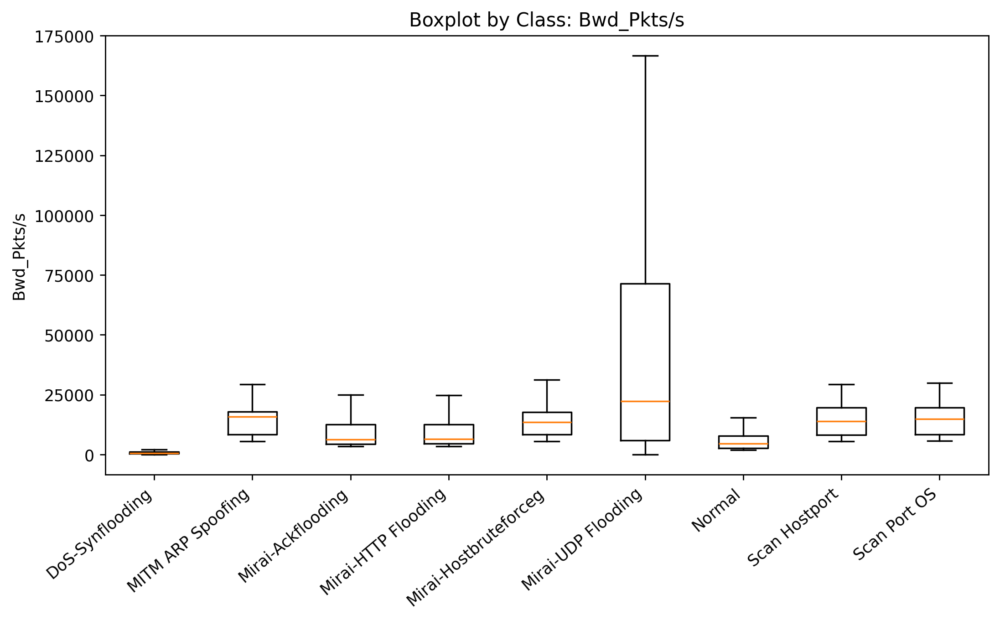

**extra_boxplot_by_class_Flow_Byts_s.png**

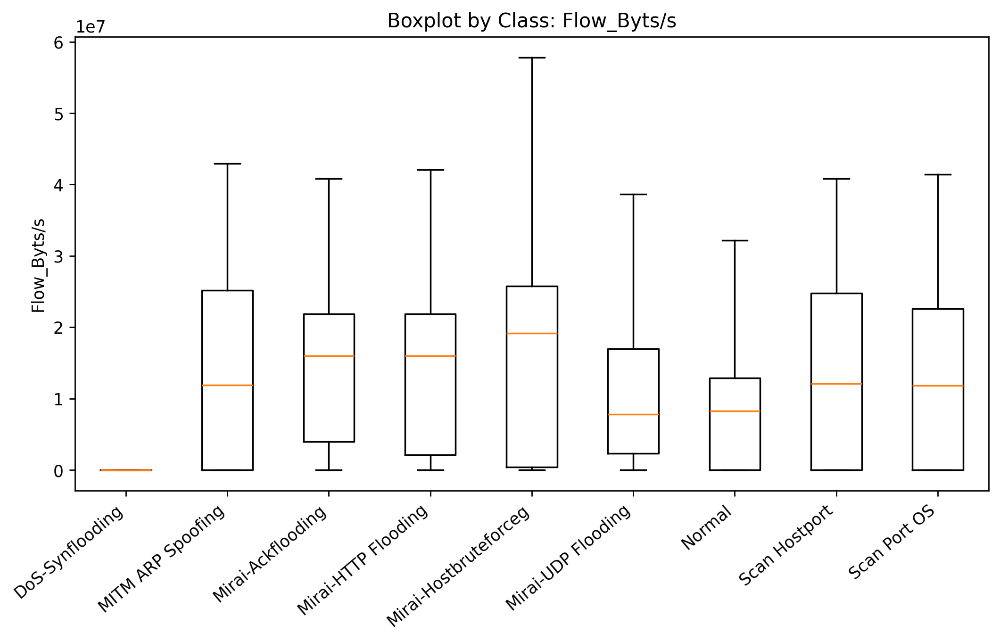

**extra_boxplot_by_class_Flow_Pkts_s.png**

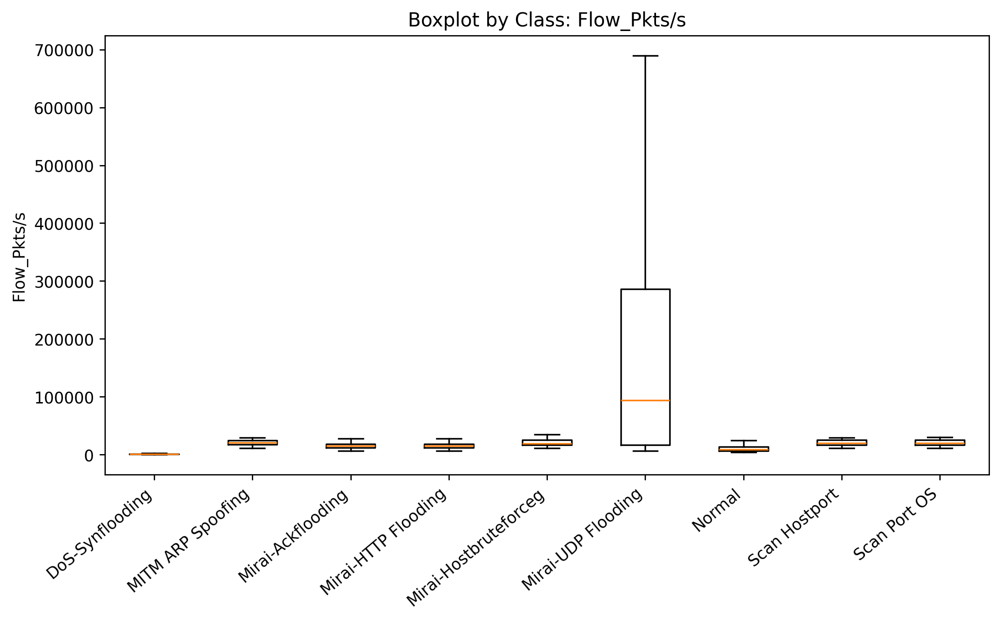

**extra_boxplot_by_class_Fwd_Pkts_s.png**

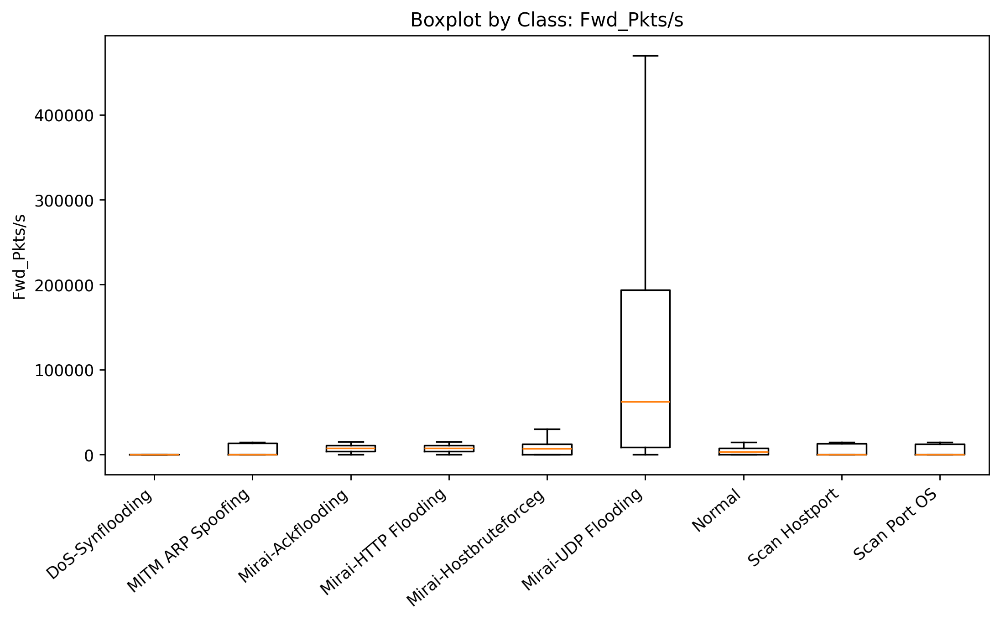

**extra_boxplot_by_class_Pkt_Len_Var.png**

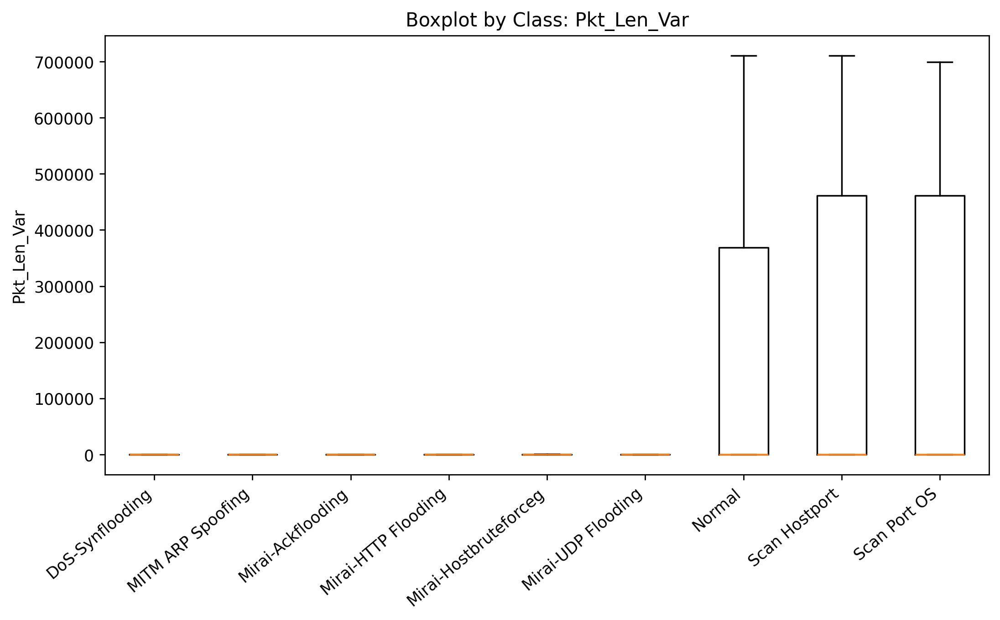

**extra_boxplot_by_class_freq_delta.png**

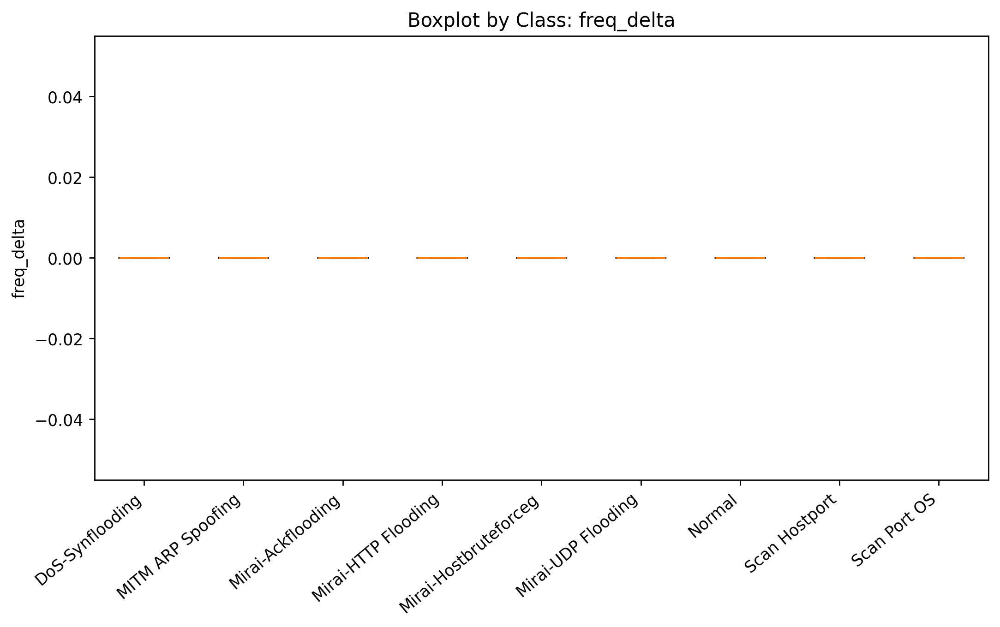

**extra_boxplot_by_class_freq_hz_src.png**

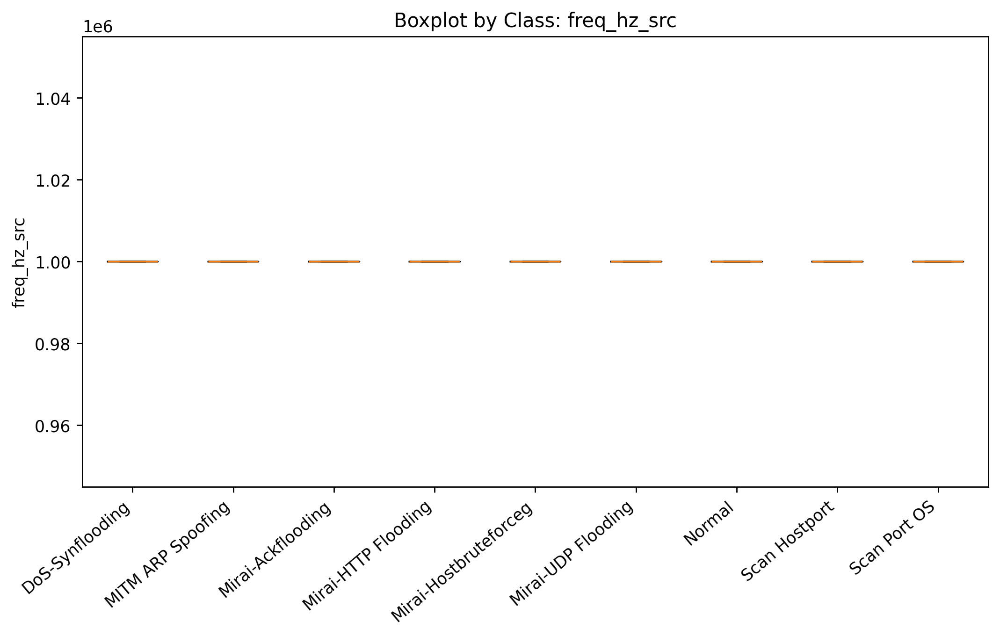

**extra_boxplot_by_class_iat_roll_mean_5.png**

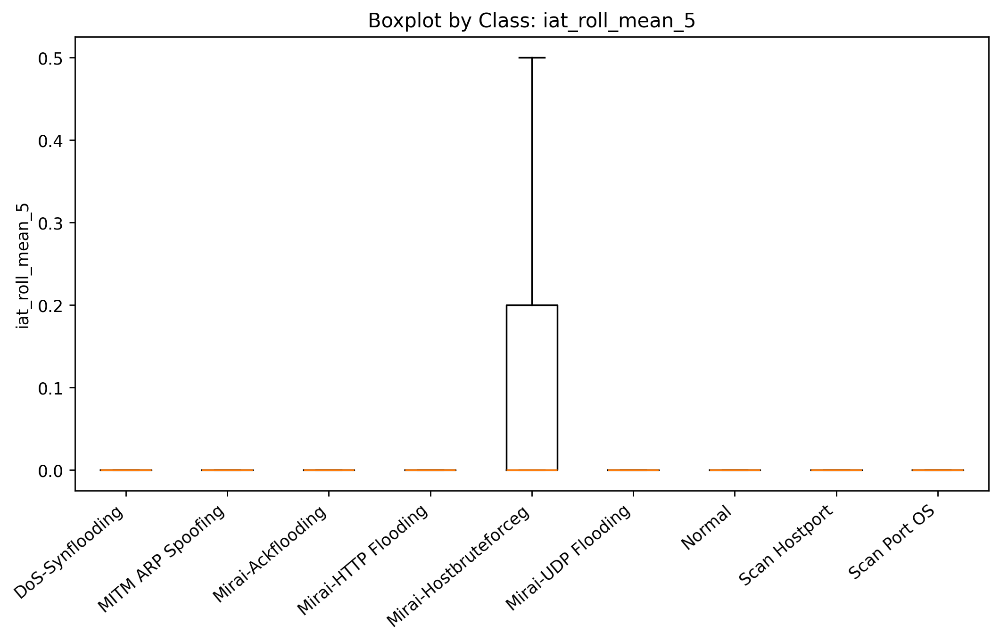

**extra_boxplot_by_class_iat_roll_std_10.png**

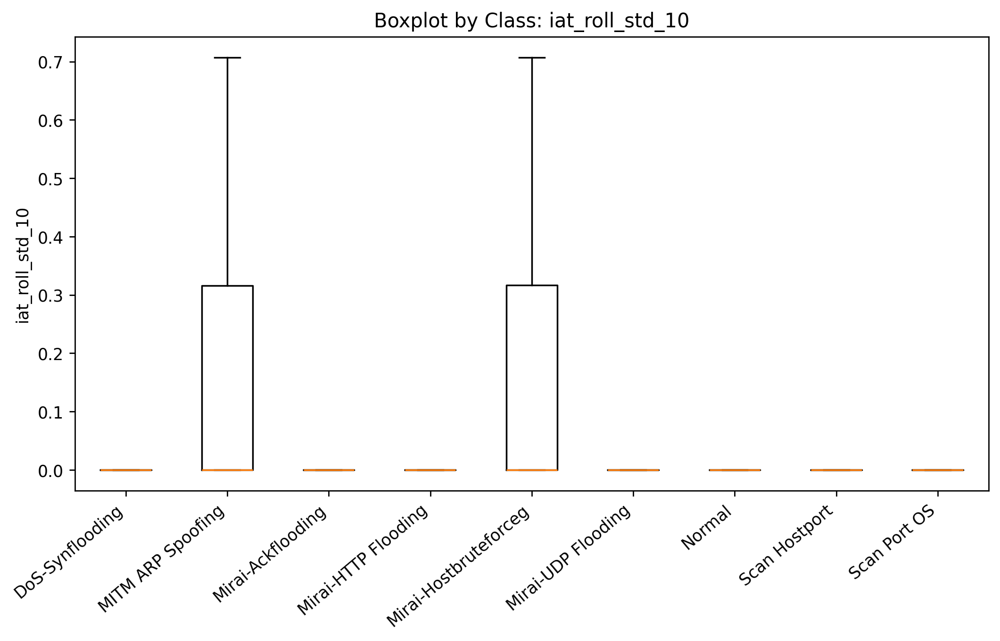

**extra_boxplot_by_class_iat_roll_std_20.png**

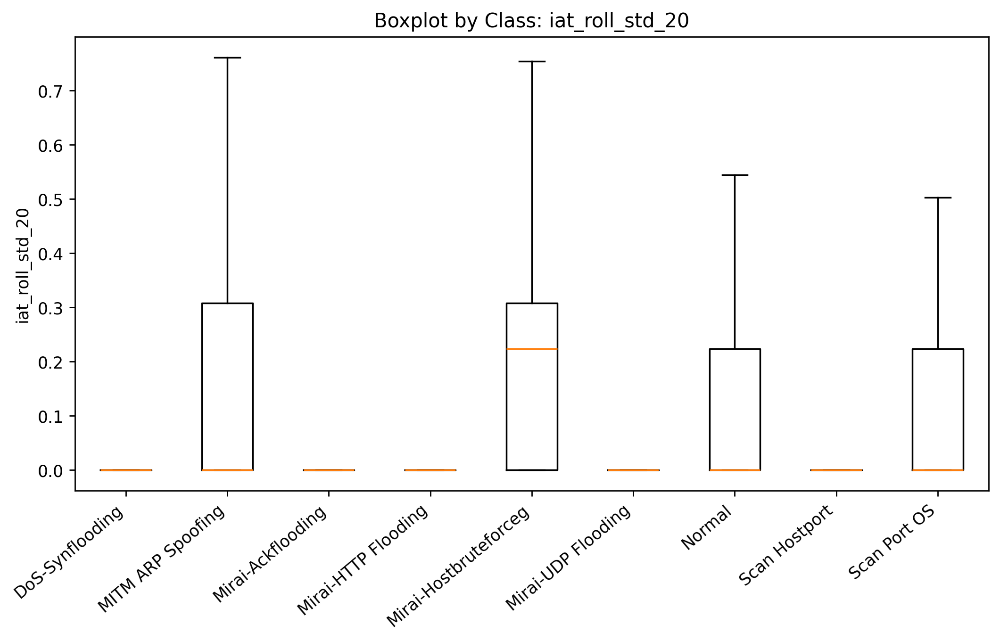

**extra_boxplot_by_class_iat_roll_std_5.png**

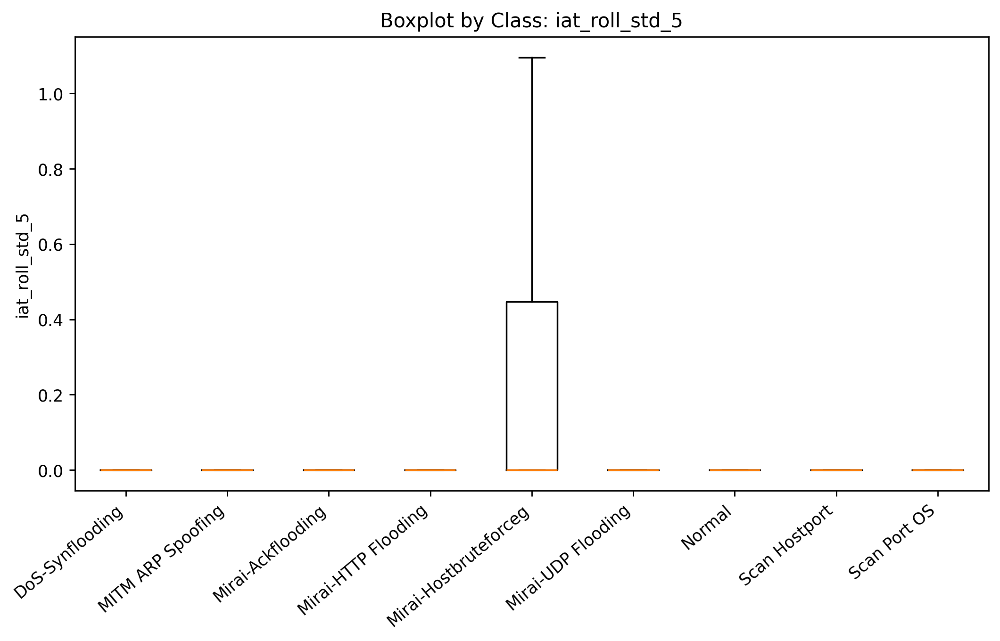

**extra_boxplot_by_class_iat_src.png**

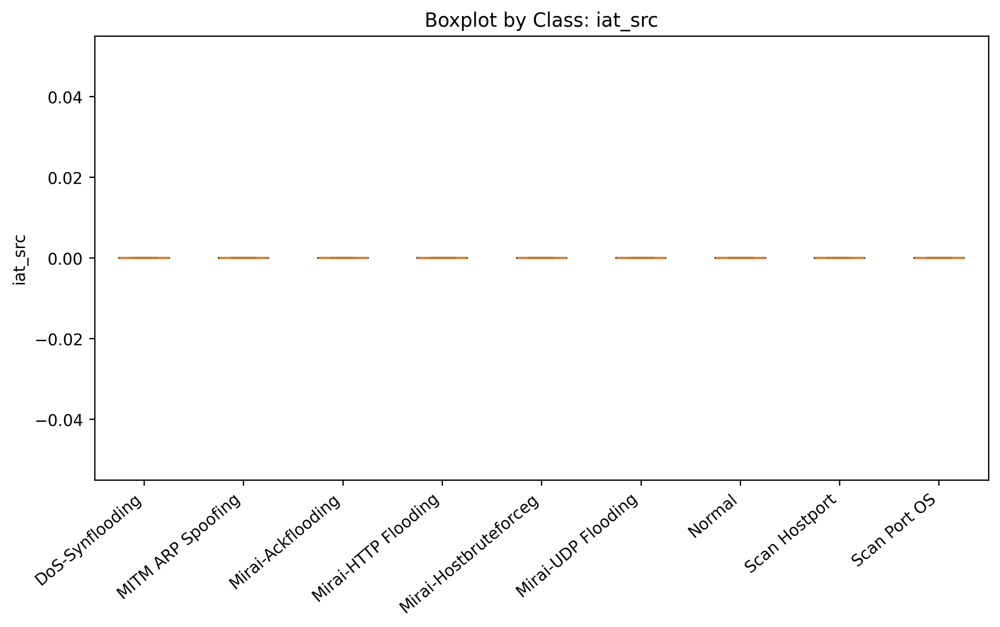

**extra_calibration_binned.png**

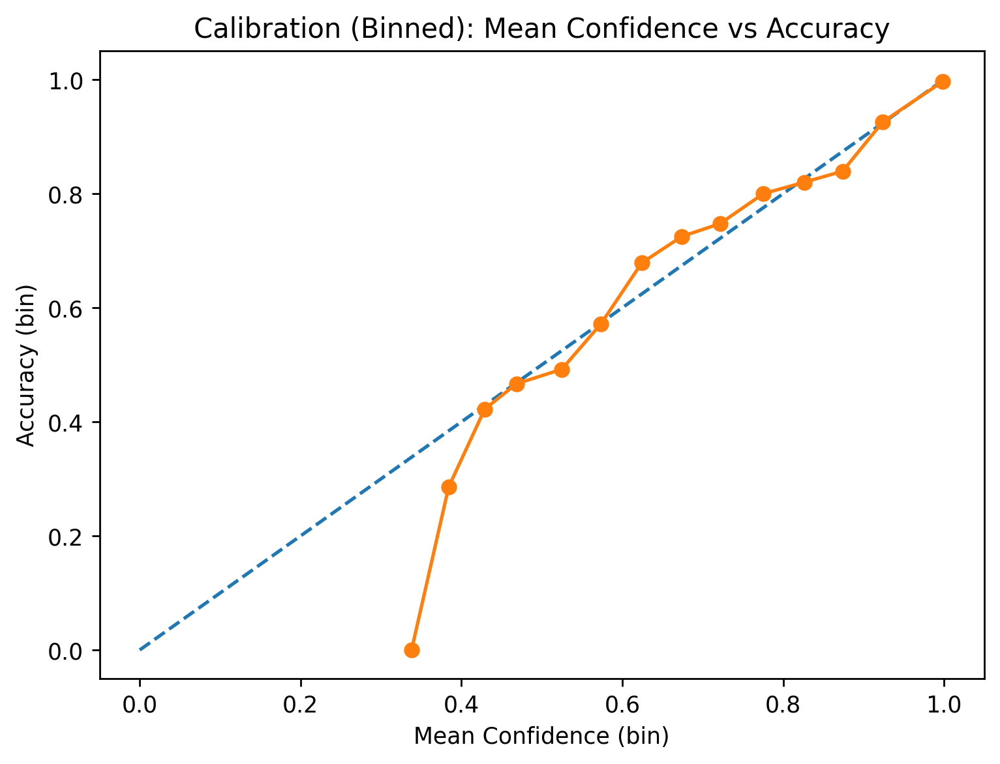

**extra_cm_confidence_thresholded.png**

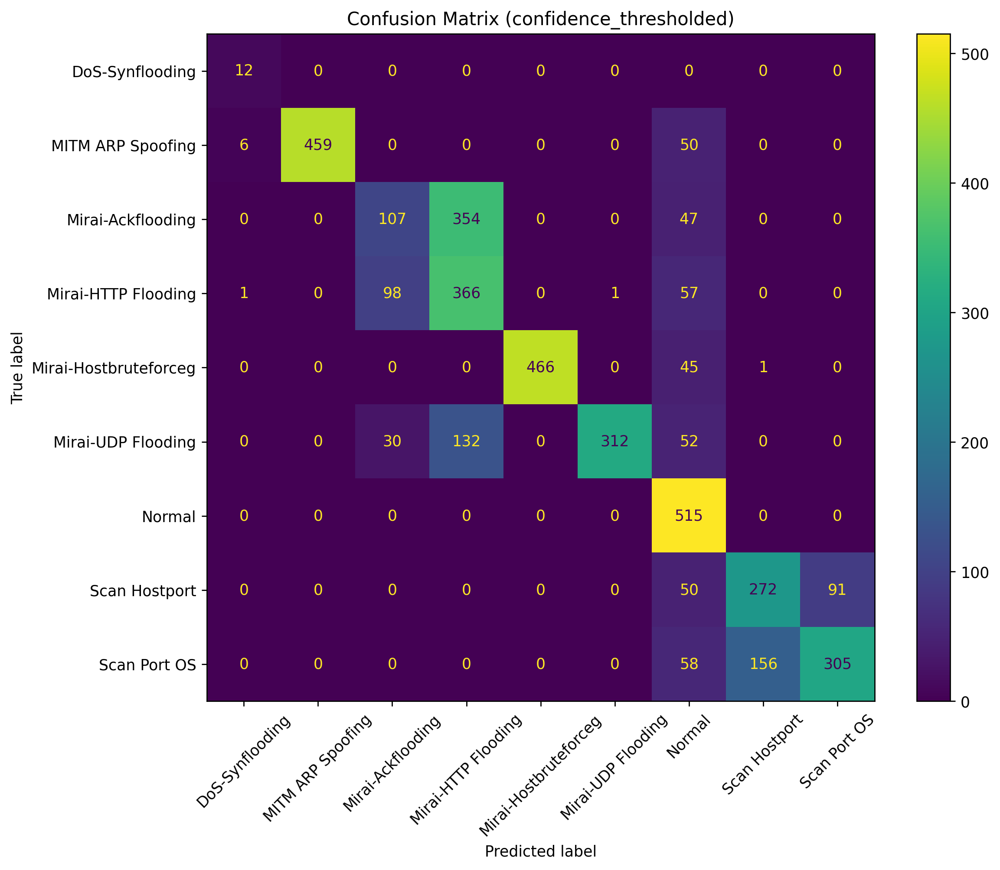

**extra_cm_confidence_thresholded_norm.png**

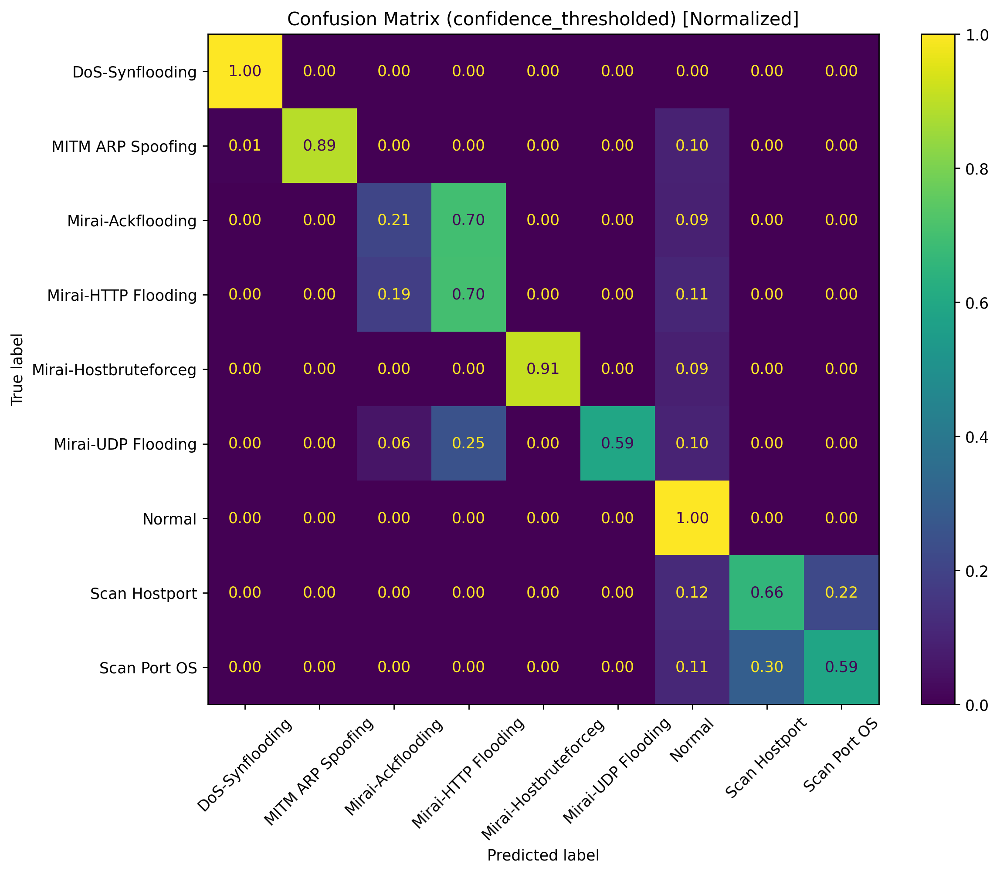

**extra_cm_raw.png**

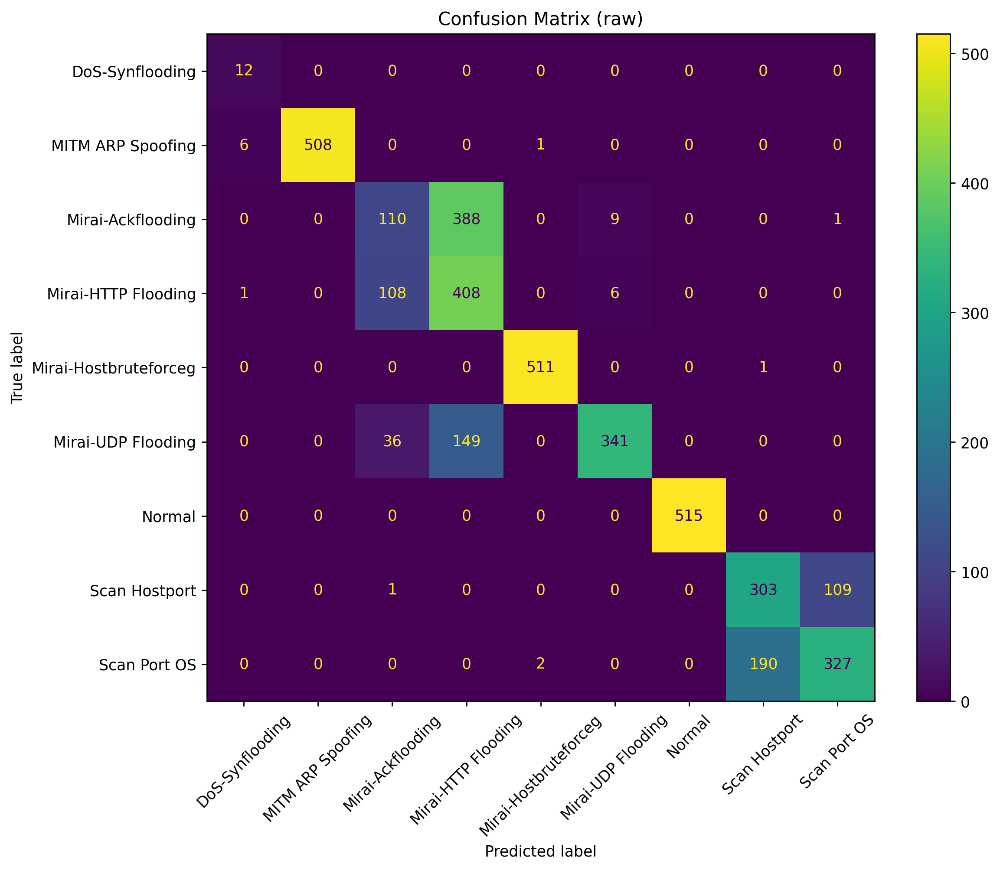

**extra_cm_raw_norm.png**

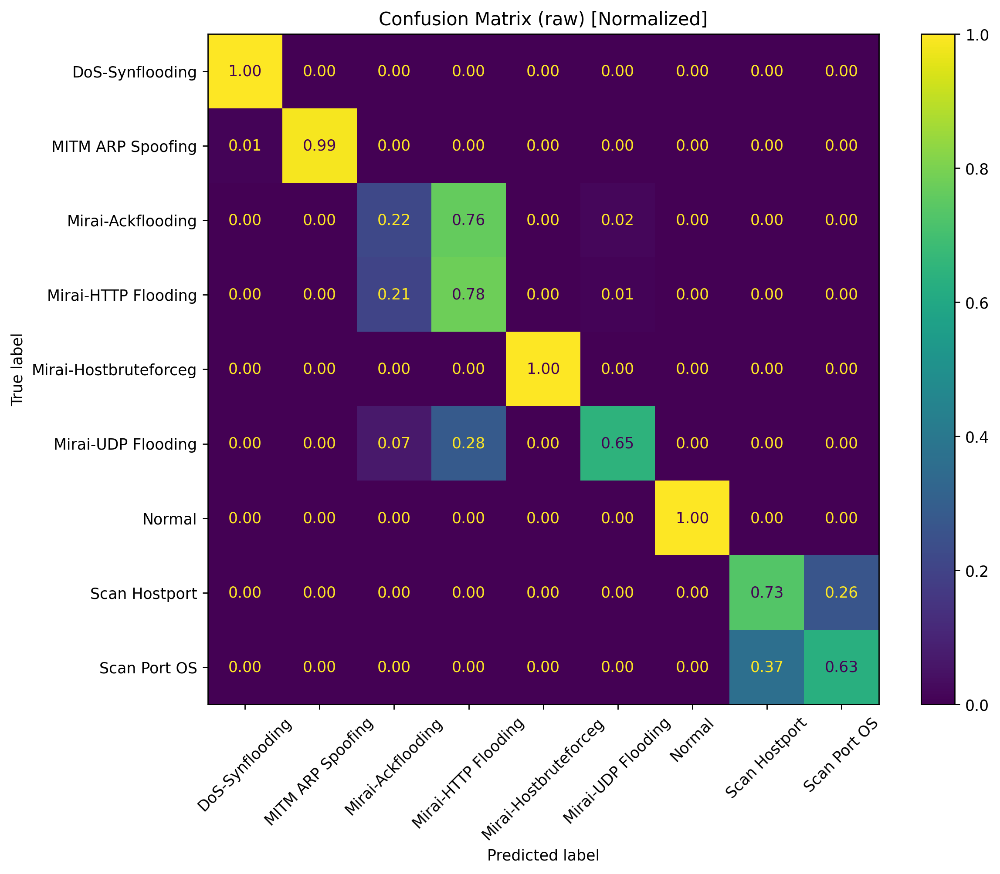

**extra_cm_stabilized_voteK5.png**

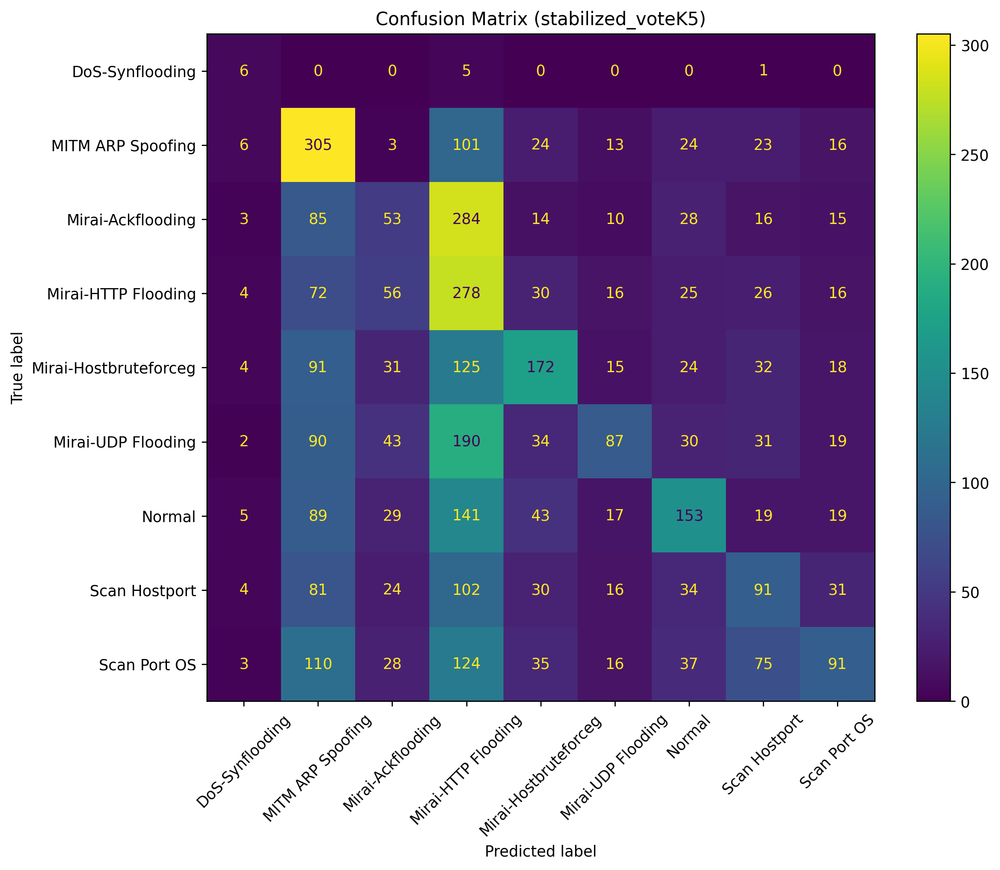

**extra_cm_stabilized_voteK5_norm.png**

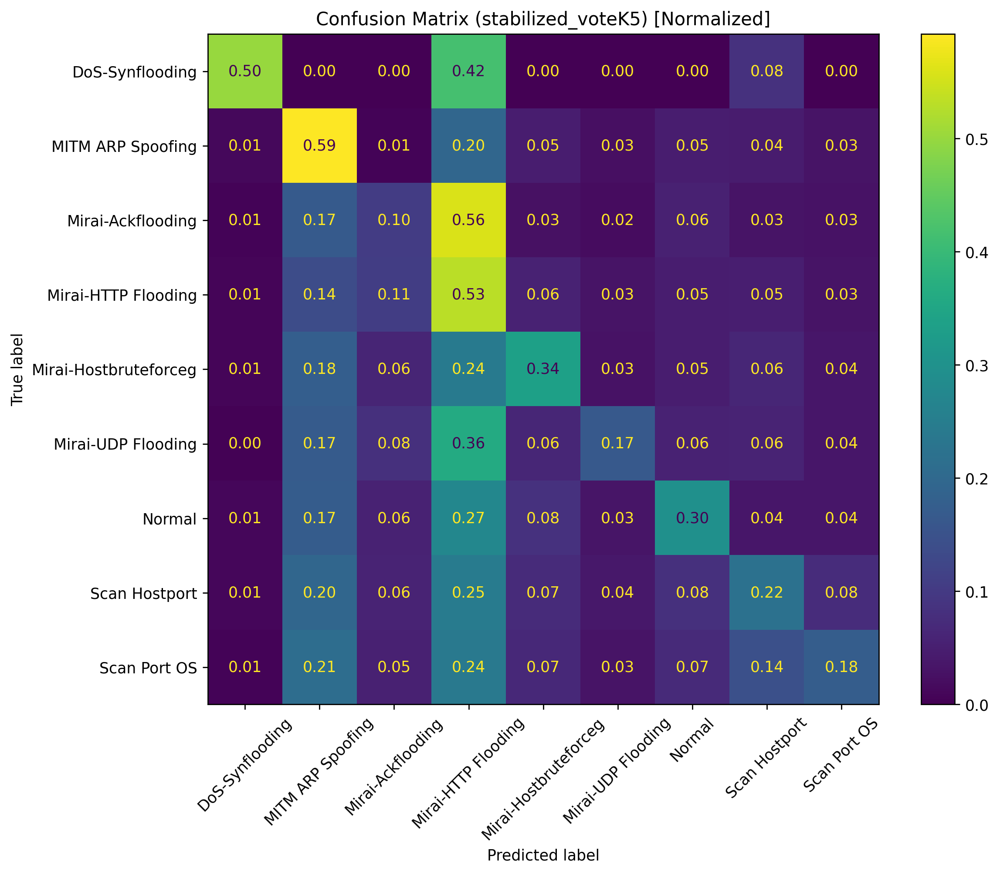

**extra_confidence_histogram_test.png**

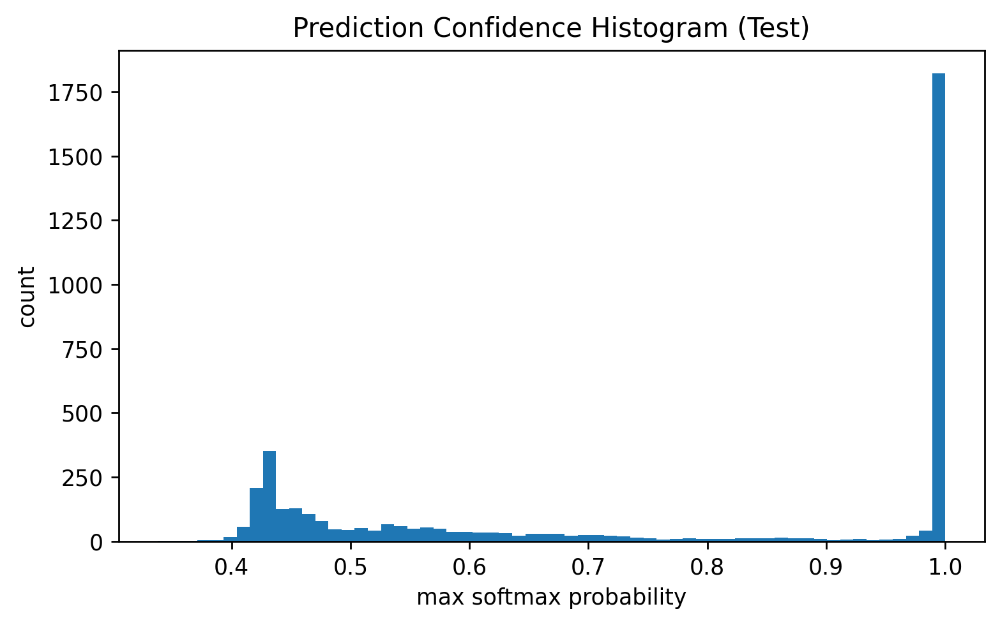

### Graphs 21–40

**extra_correlation_eigen_spectrum.png**

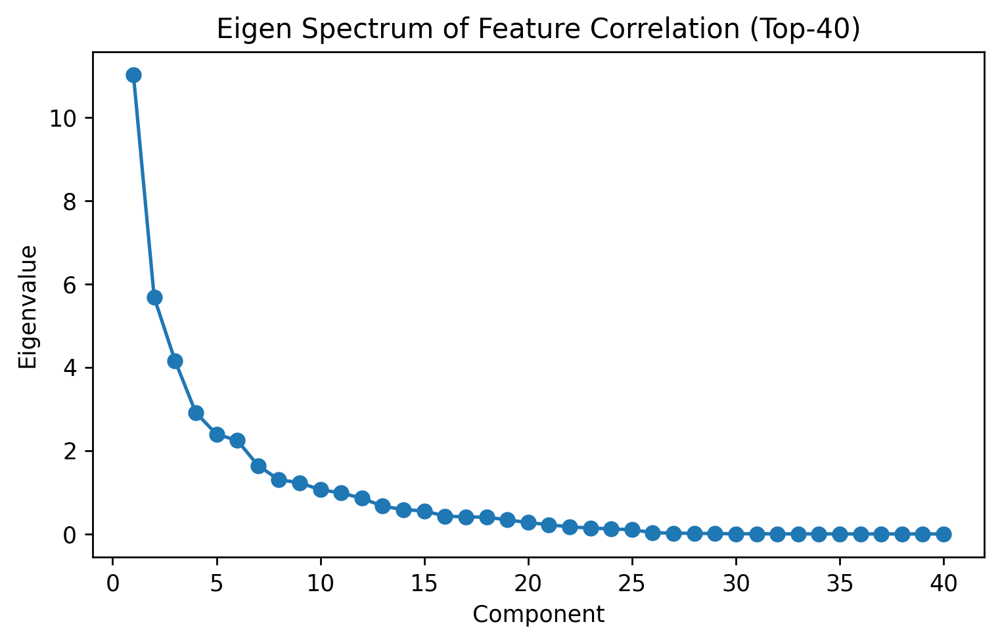

**extra_correlation_heatmap_top40.png**

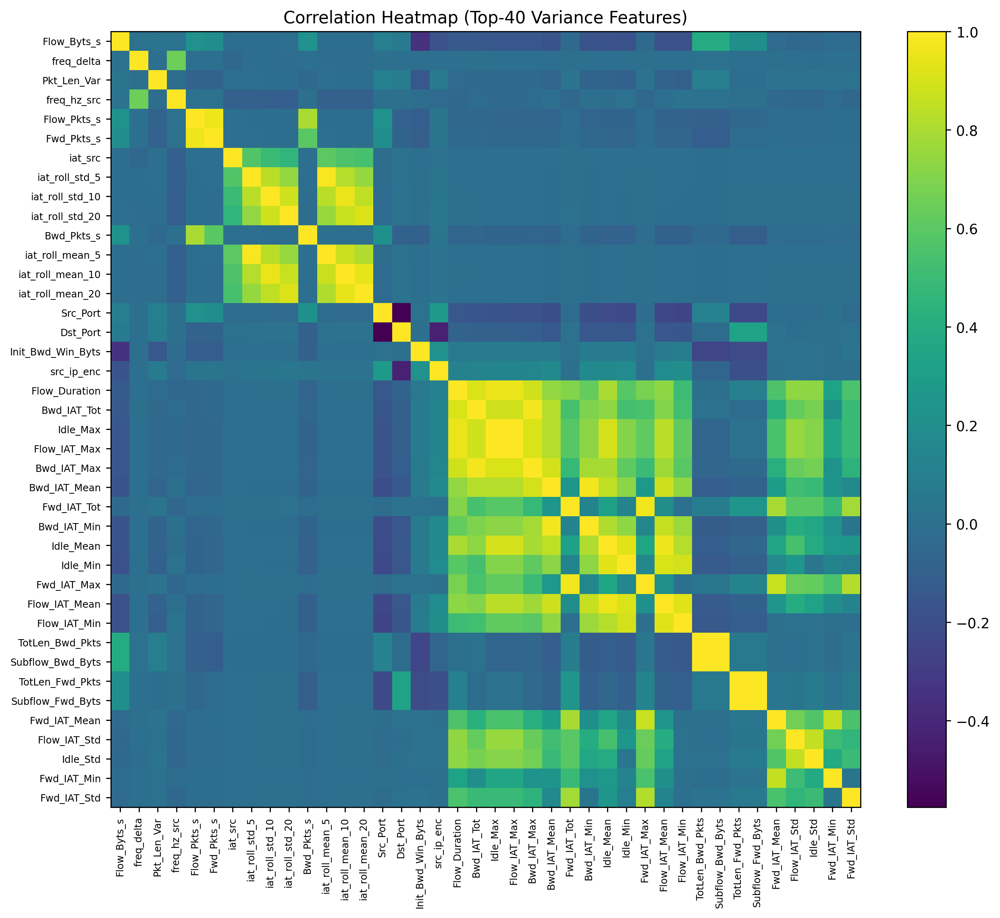

**extra_entropy_histogram_test.png**

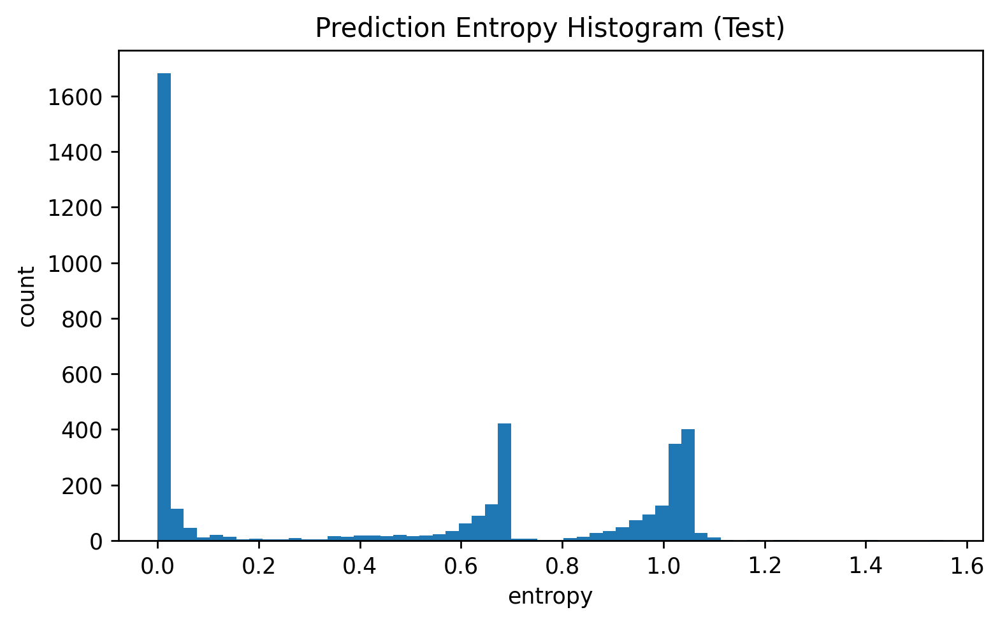

**extra_f1_by_class_confidence_thresholded.png**

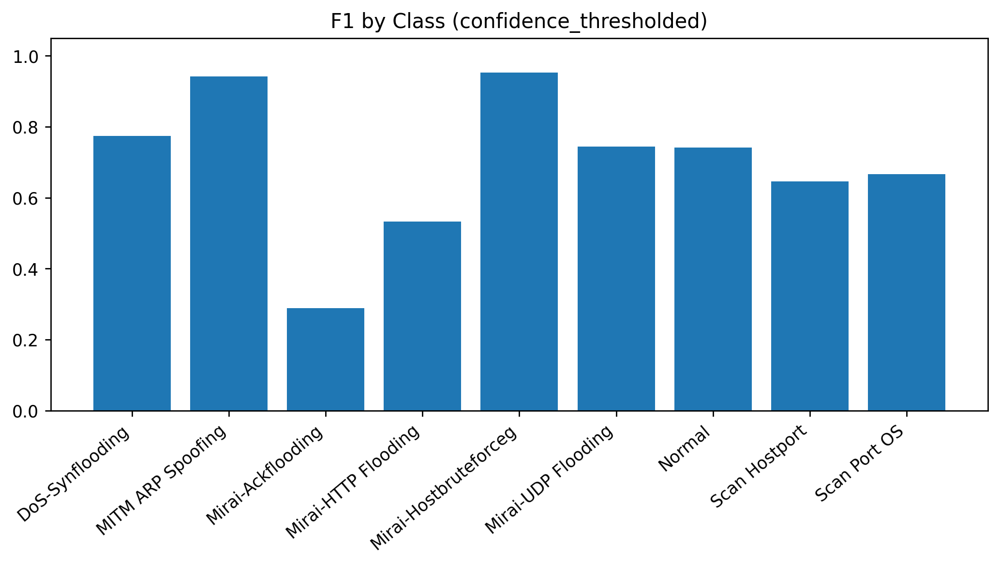

**extra_f1_by_class_raw.png**

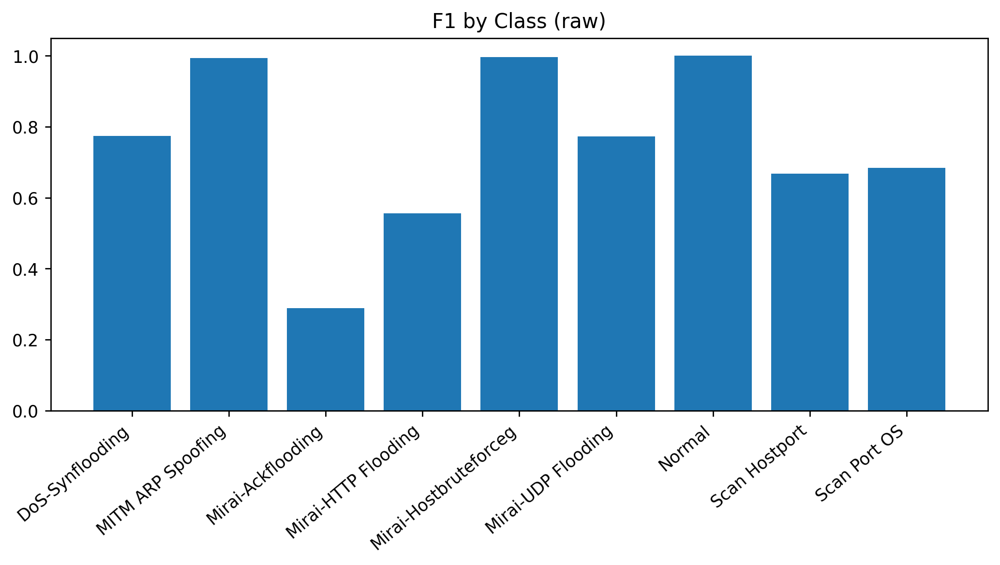

**extra_f1_by_class_stabilized_voteK5.png**

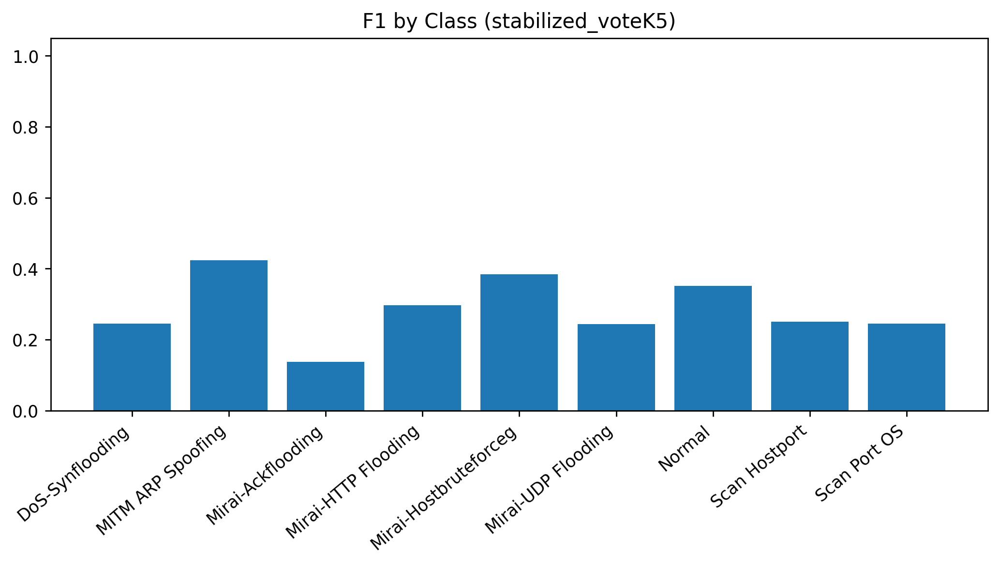

**extra_freq_hz_src_distribution.png**

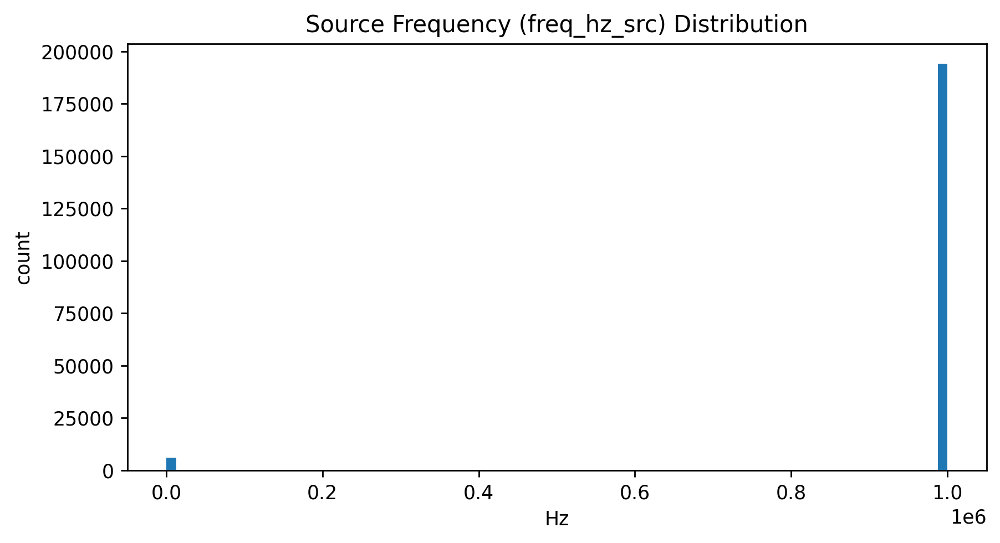

**extra_hist_by_class_Bwd_Pkts_s.png**

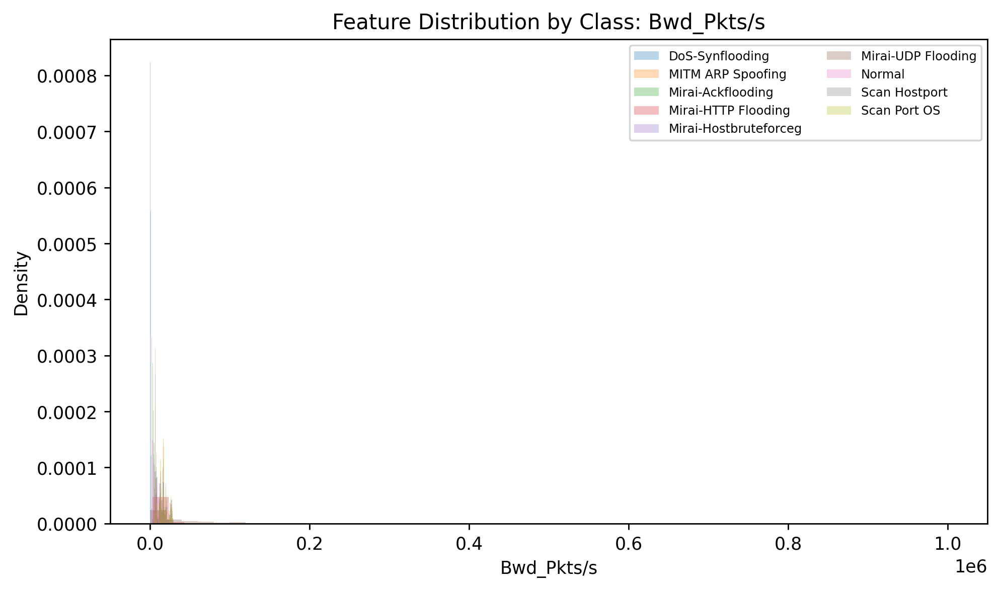

**extra_hist_by_class_Flow_Byts_s.png**

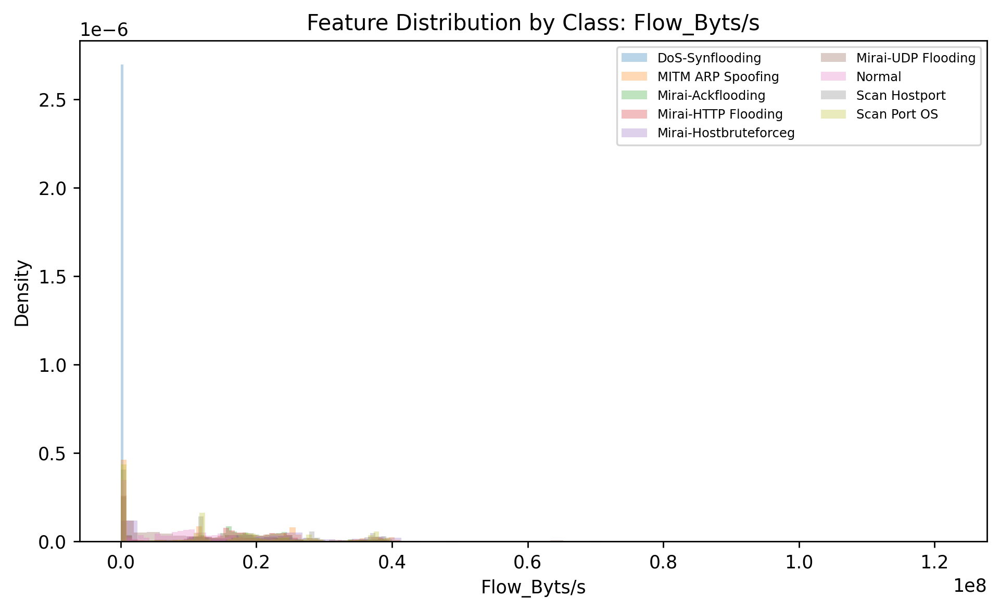

**extra_hist_by_class_Flow_Pkts_s.png**

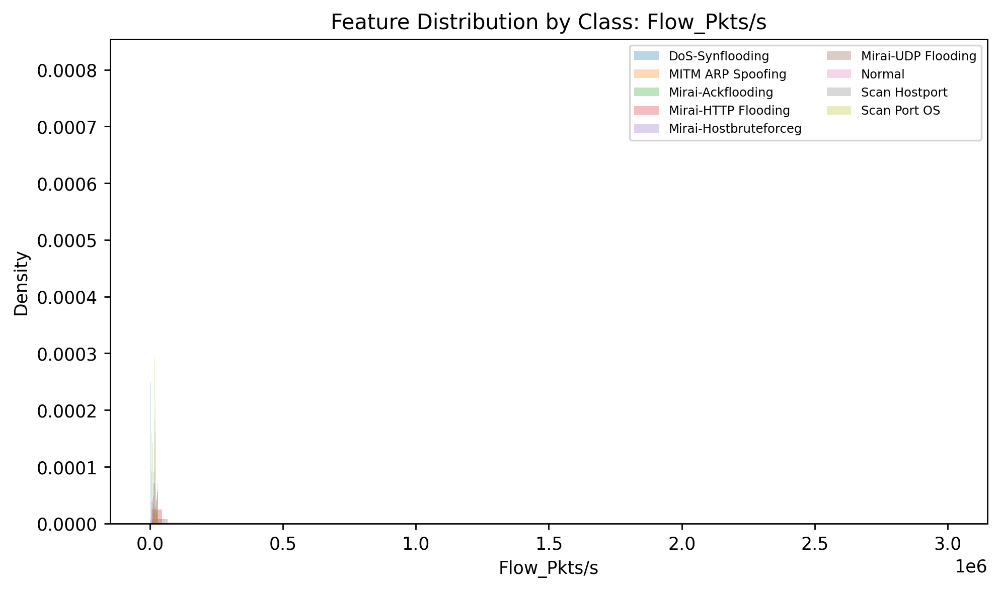

**extra_hist_by_class_Fwd_Pkts_s.png**

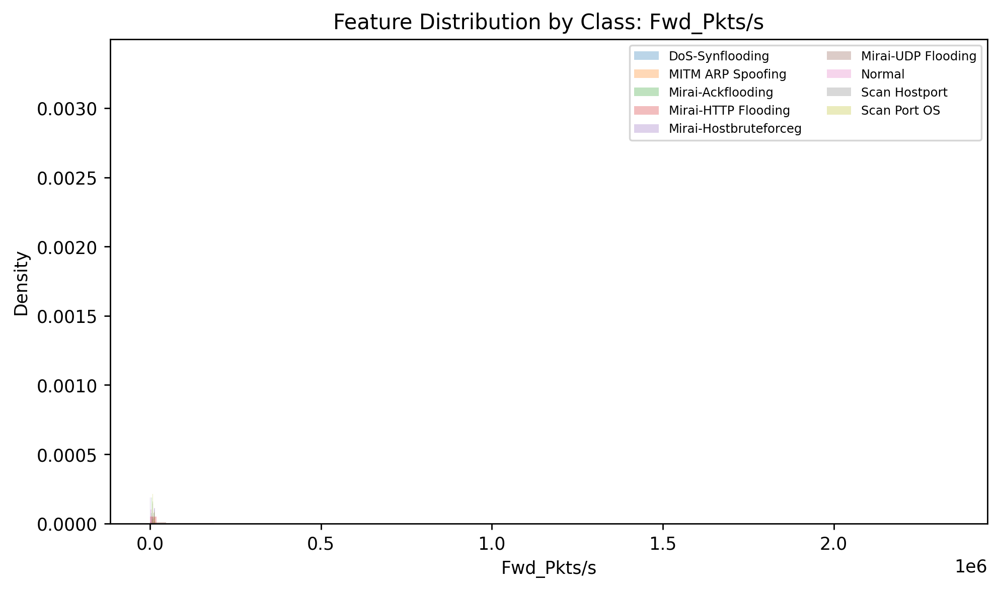

**extra_hist_by_class_Pkt_Len_Var.png**

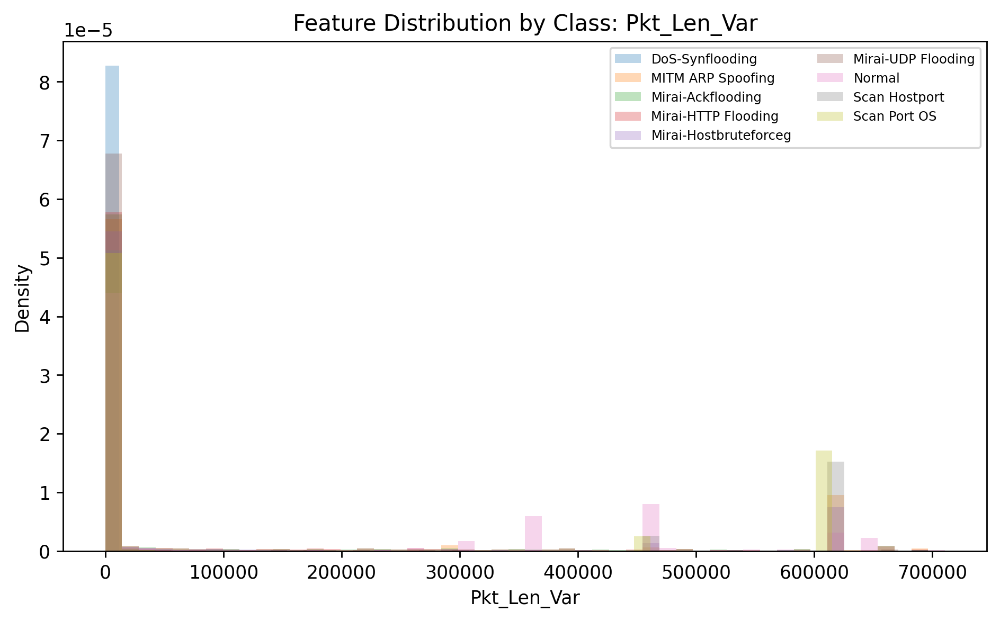

**extra_hist_by_class_freq_delta.png**

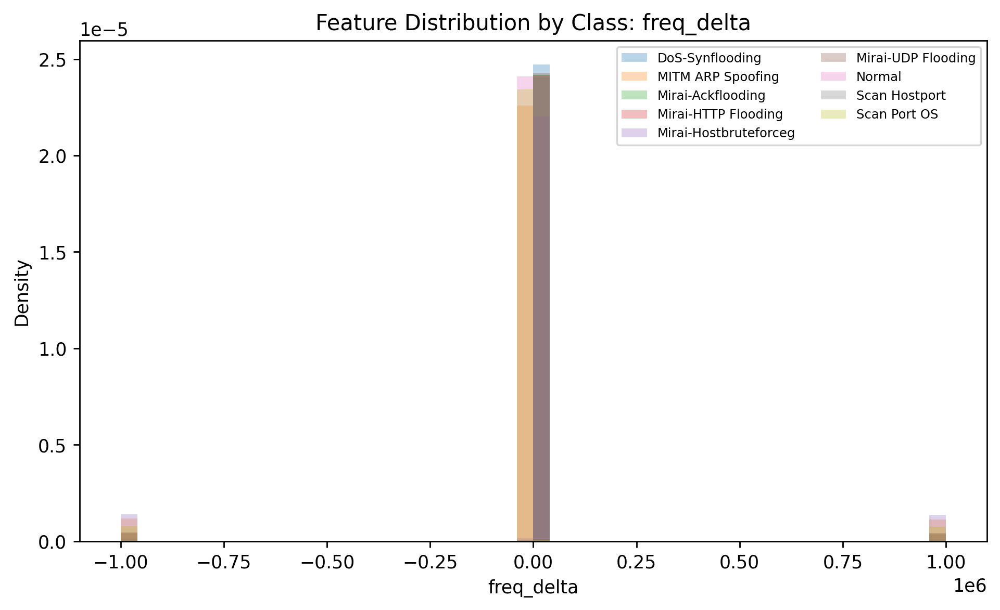

**extra_hist_by_class_freq_hz_src.png**

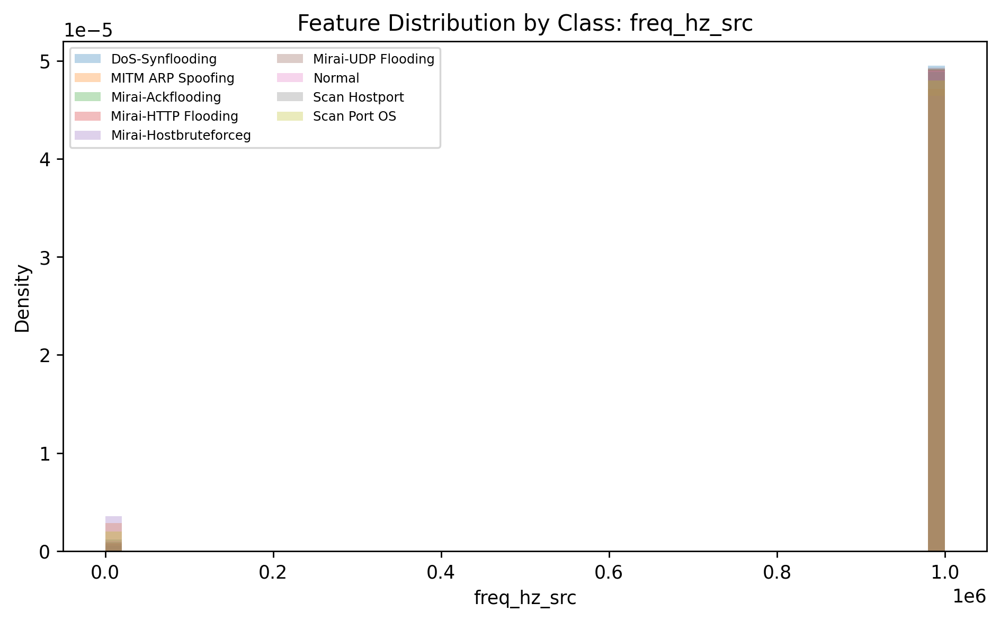

**extra_hist_by_class_iat_roll_mean_5.png**

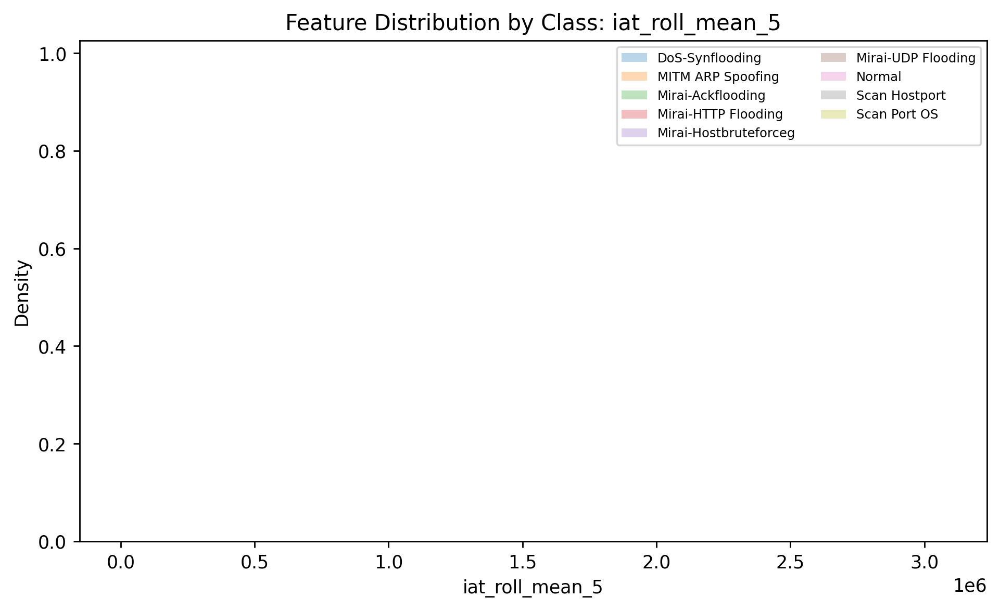

**extra_hist_by_class_iat_roll_std_10.png**

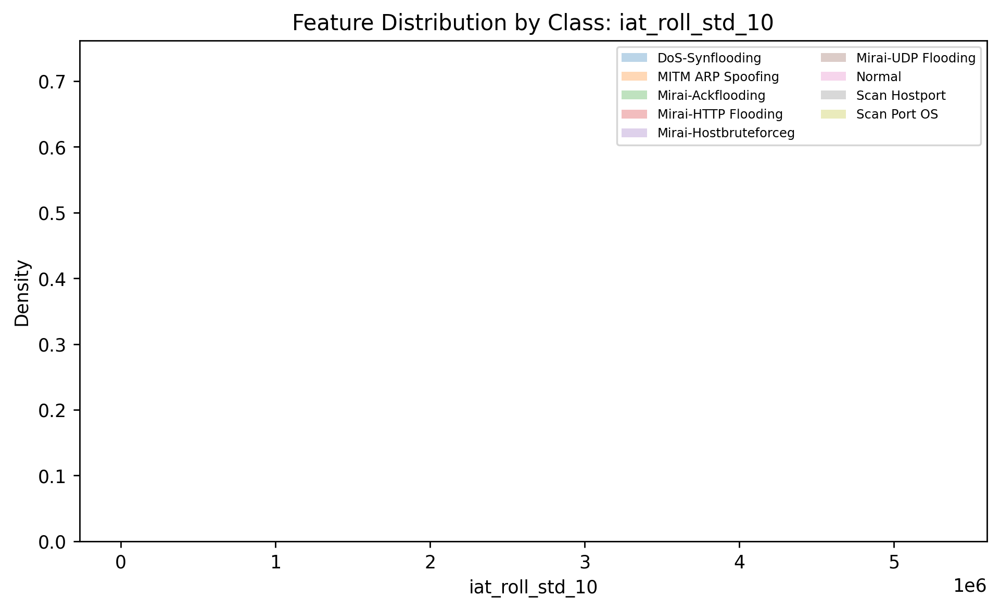

**extra_hist_by_class_iat_roll_std_20.png**

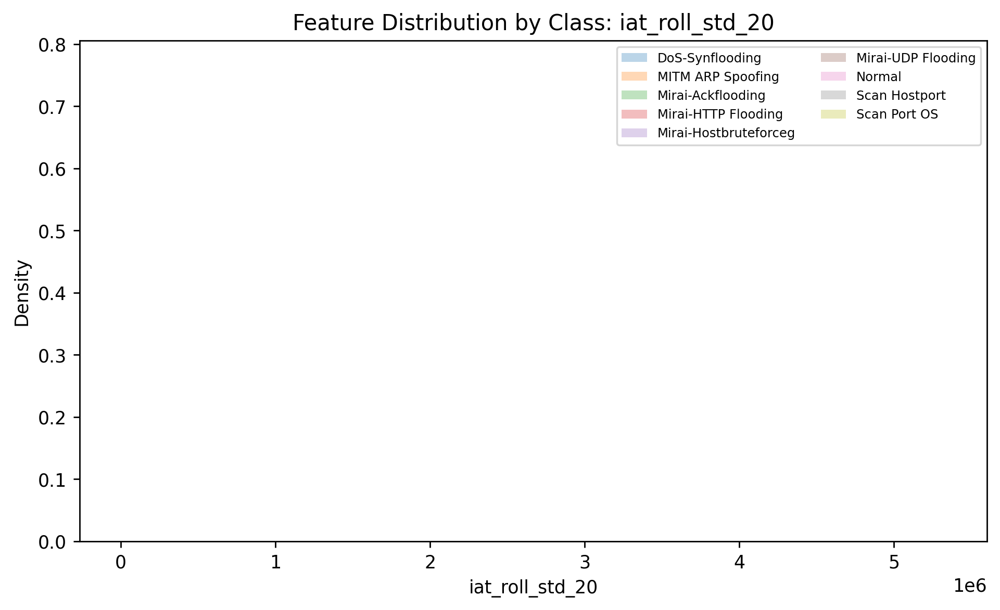

**extra_hist_by_class_iat_roll_std_5.png**

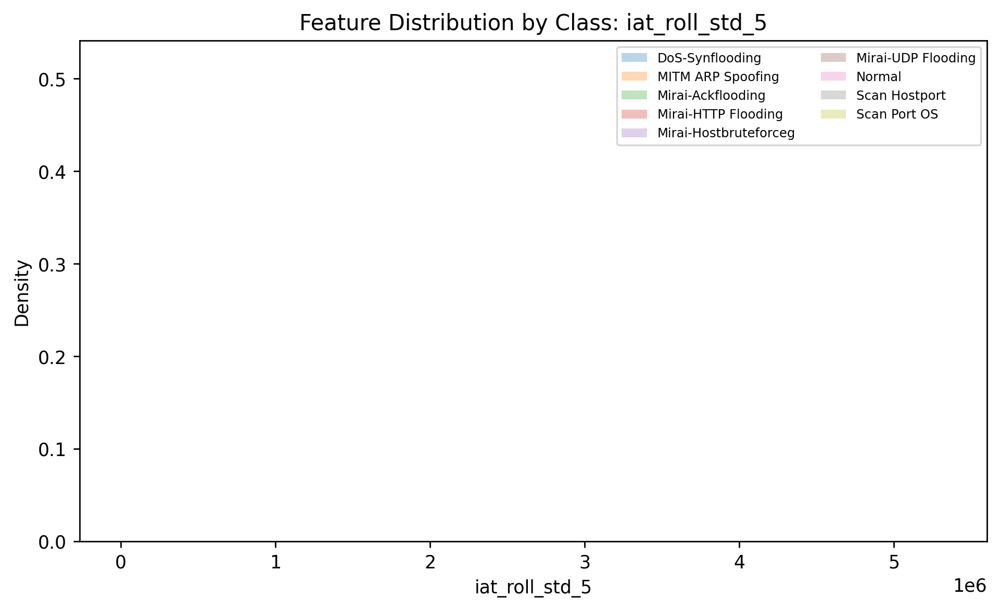

**extra_hist_by_class_iat_src.png**

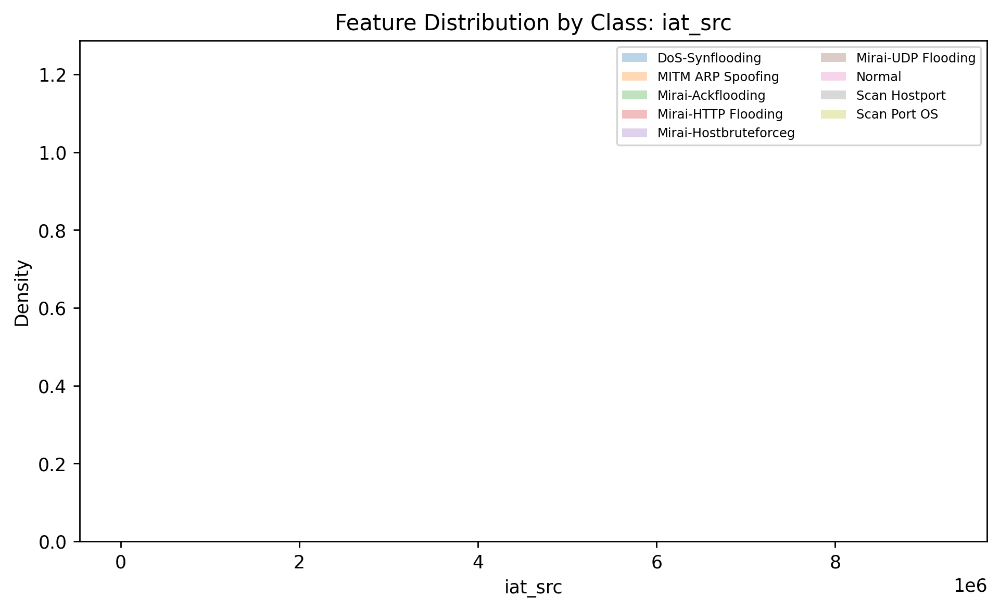

**extra_iat_src_distribution.png**

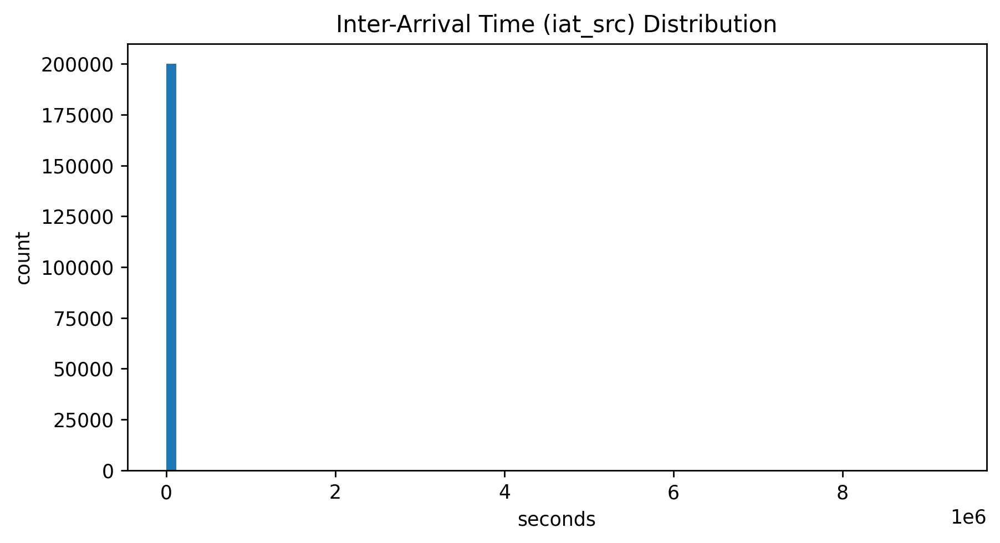

### Graphs 41–60

**extra_iat_src_median_iqr_by_class.png**

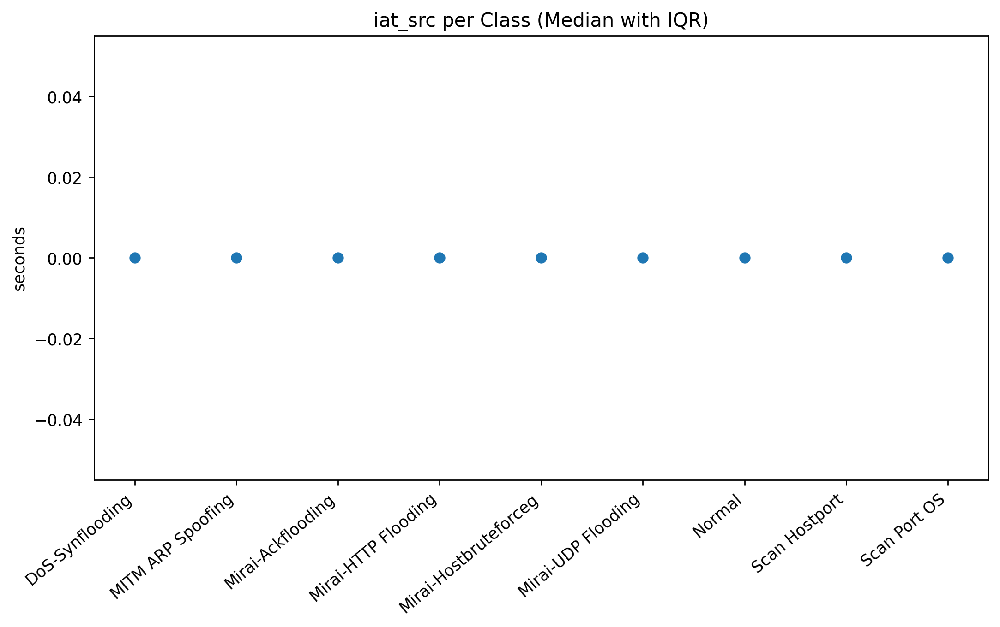

**extra_precision_by_class_confidence_thresholded.png**

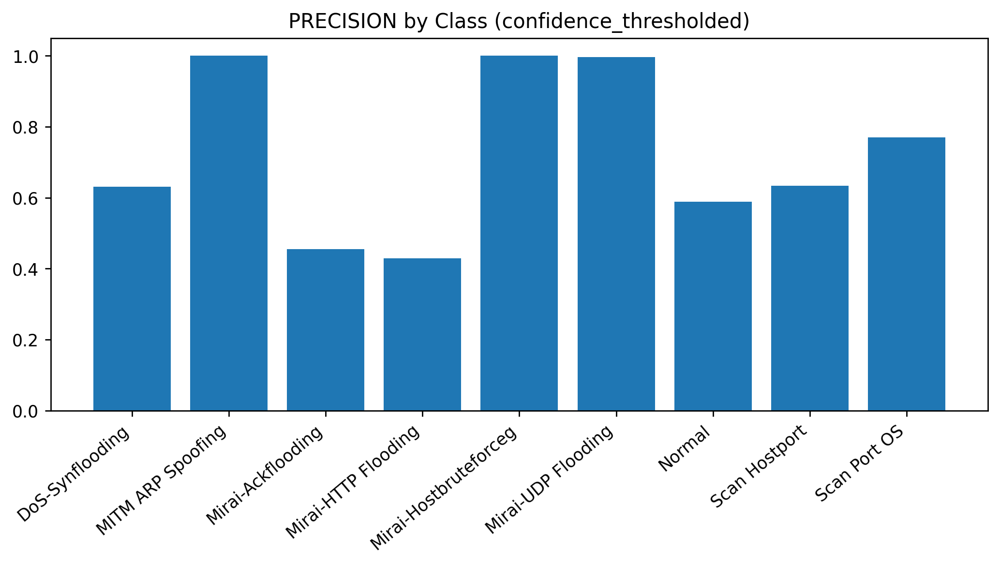

**extra_precision_by_class_raw.png**

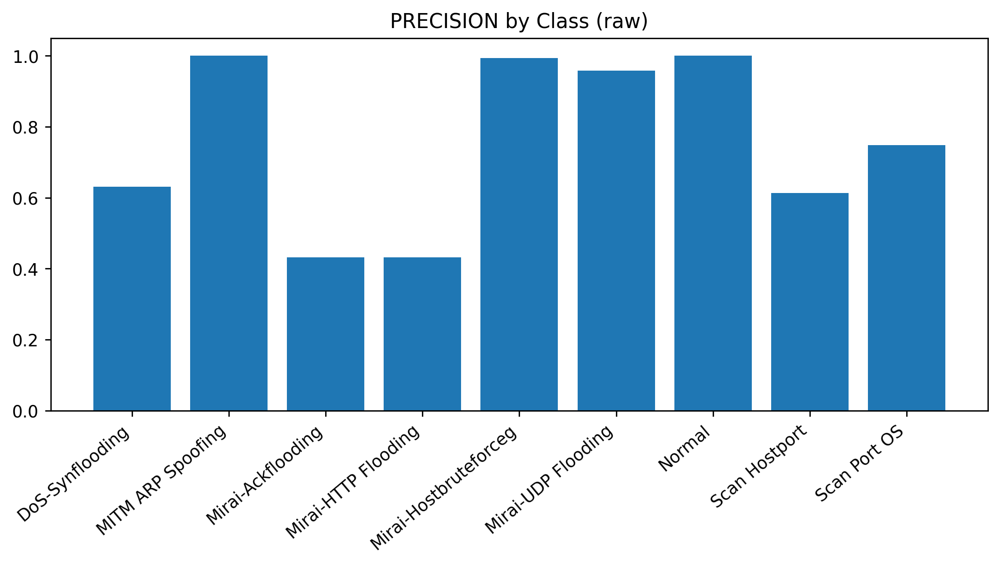

**extra_precision_by_class_stabilized_voteK5.png**

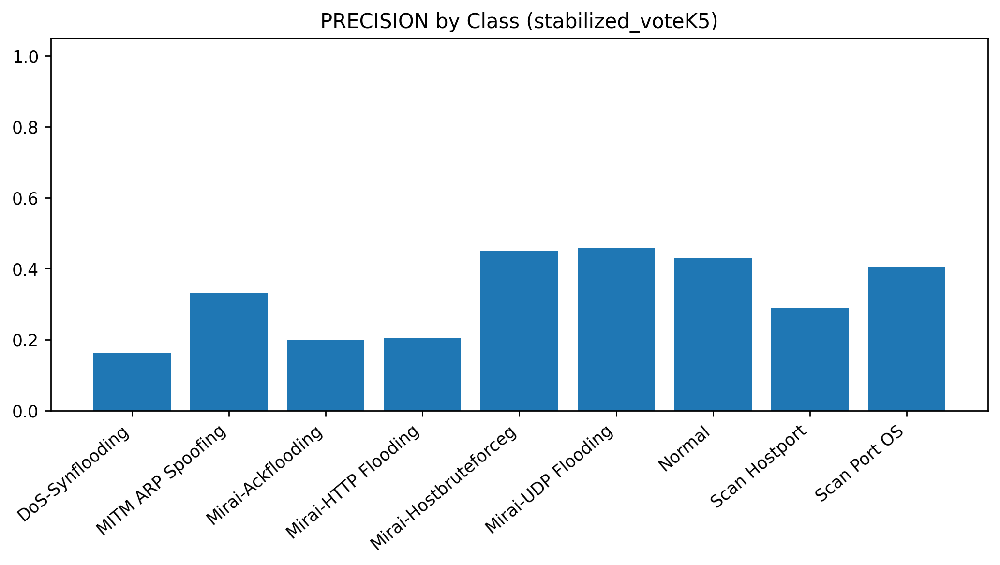

**extra_recall_by_class_confidence_thresholded.png**

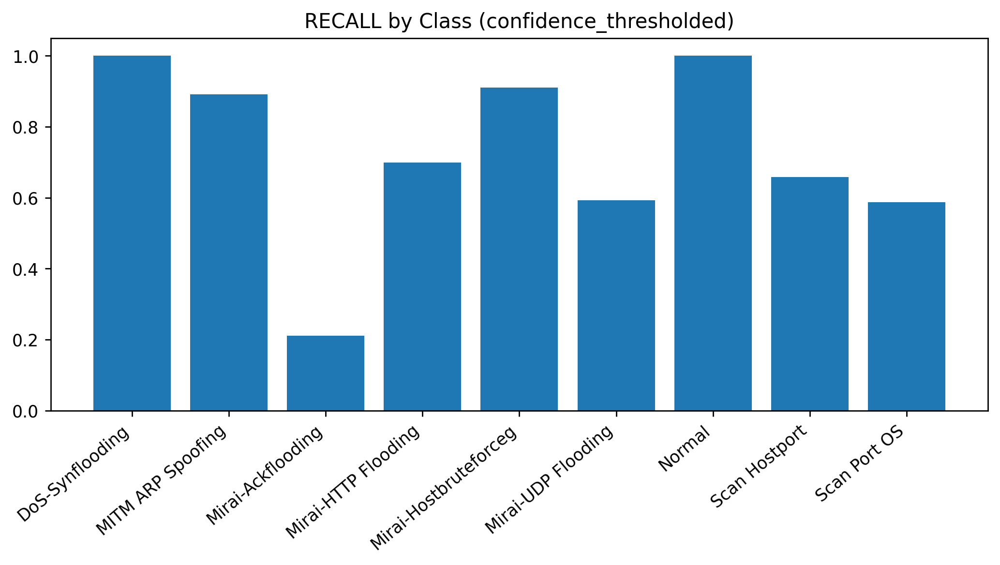

**extra_recall_by_class_raw.png**

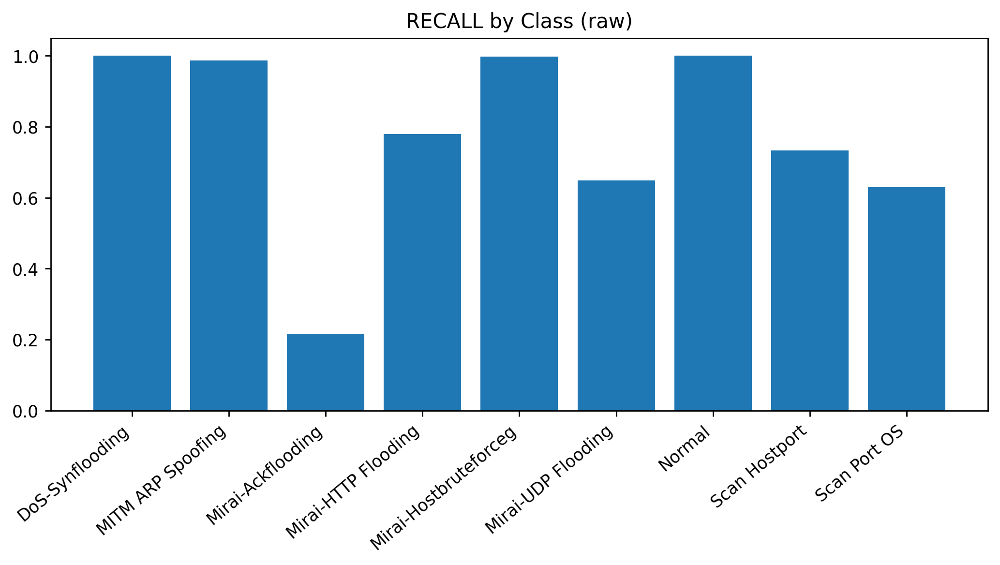

**extra_recall_by_class_stabilized_voteK5.png**

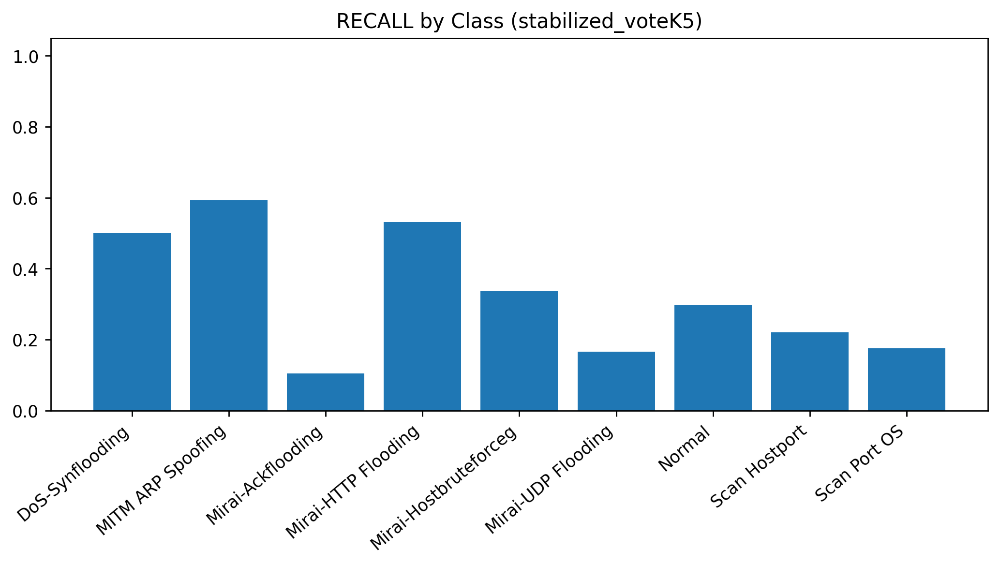

**extra_top2_margin_histogram_test.png**

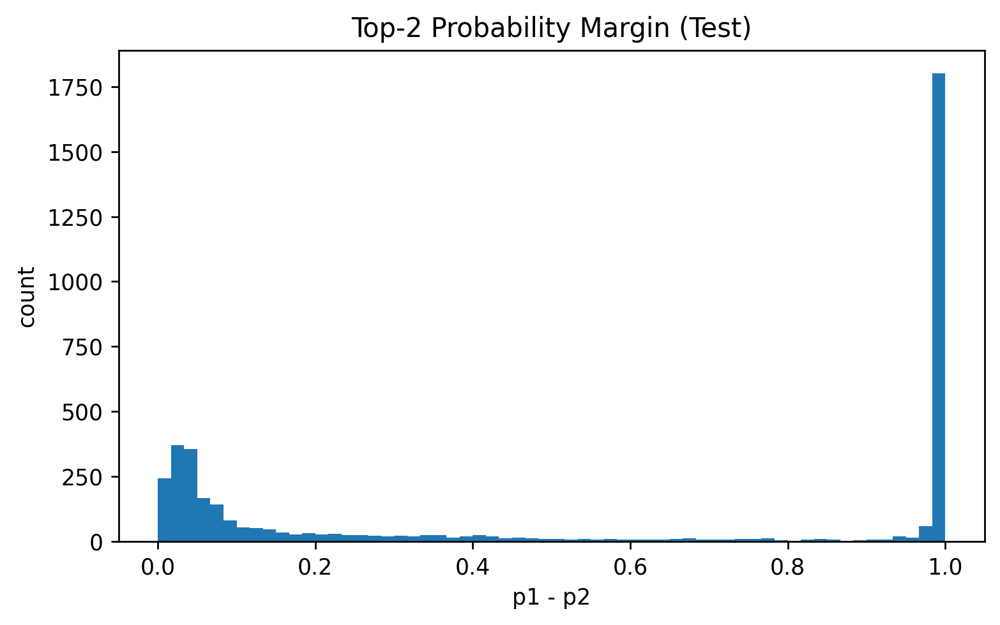

**extra_top_confused_pairs_raw.png**

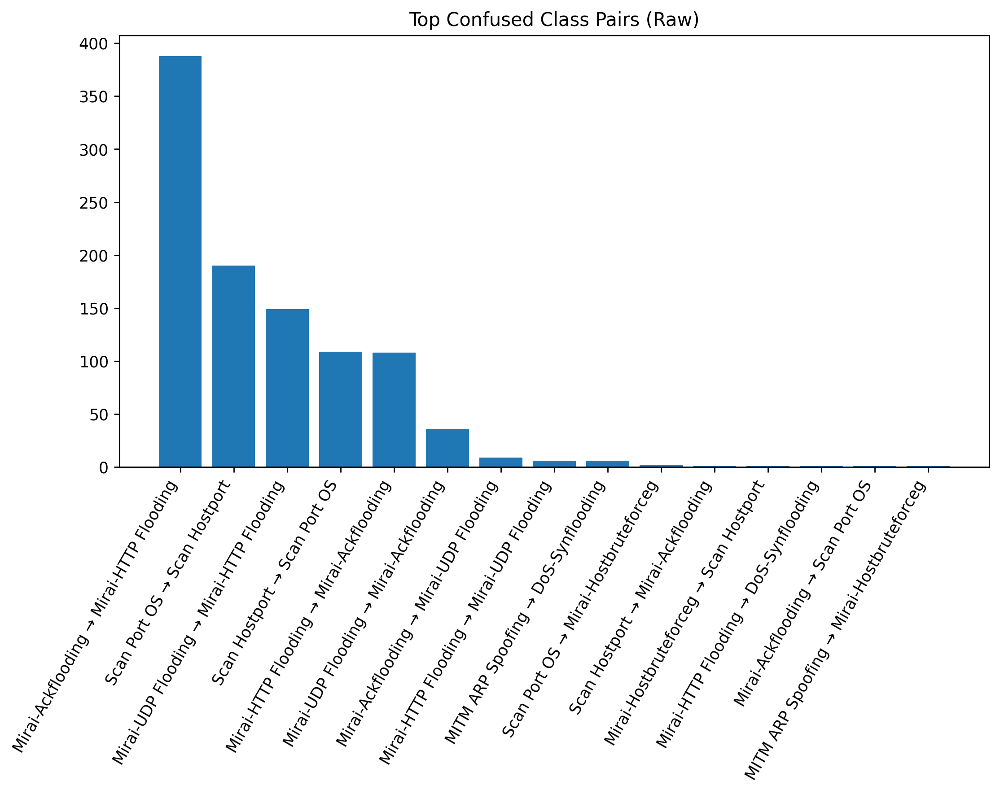

**plot_baseline_confusion_matrix_logreg.png**

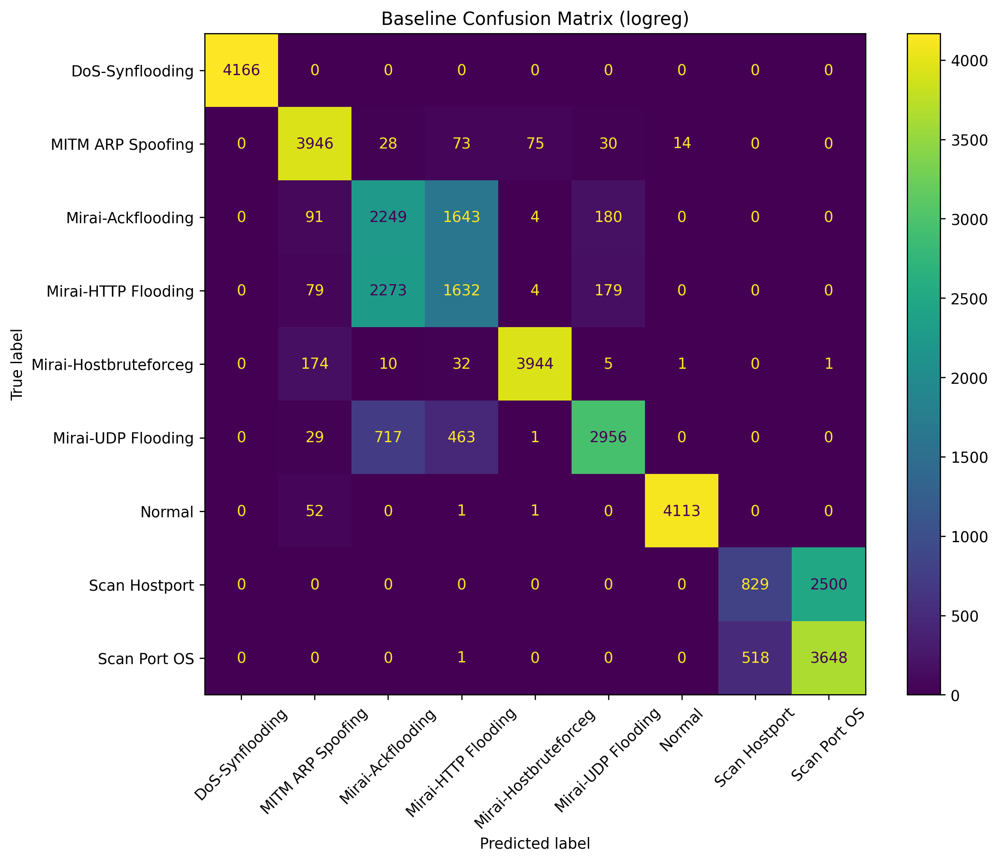

**plot_baseline_confusion_matrix_randomforest.png**

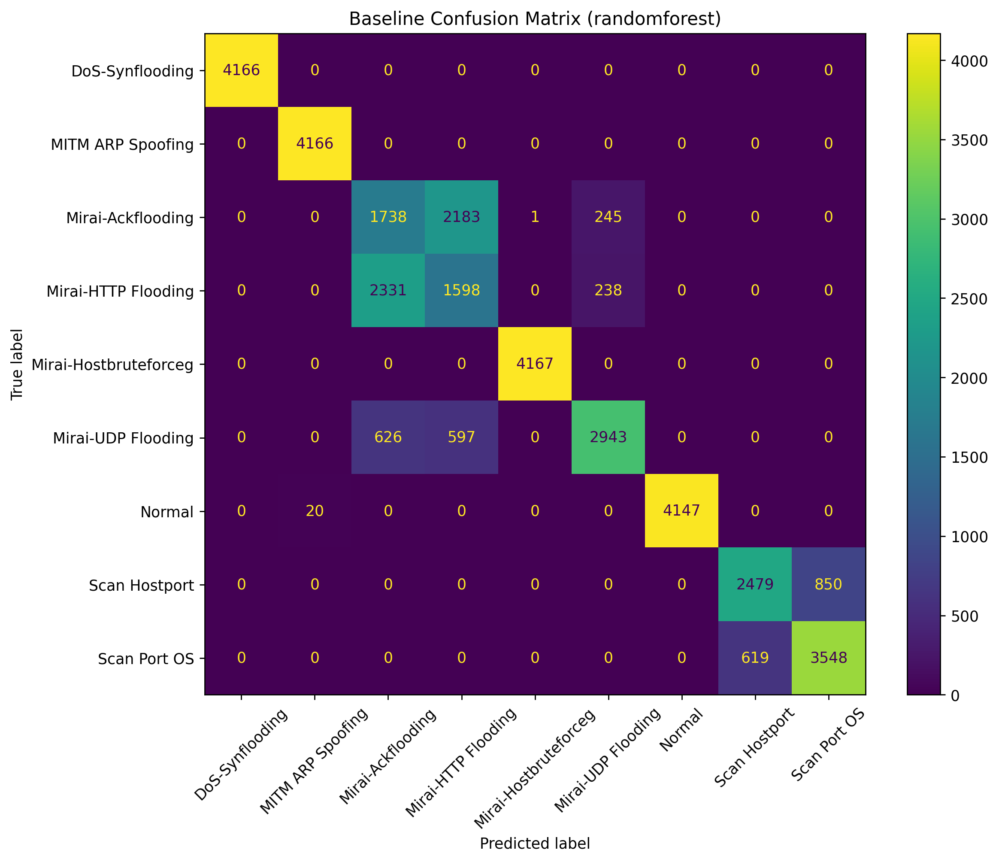

**plot_class_distribution_bar.png**

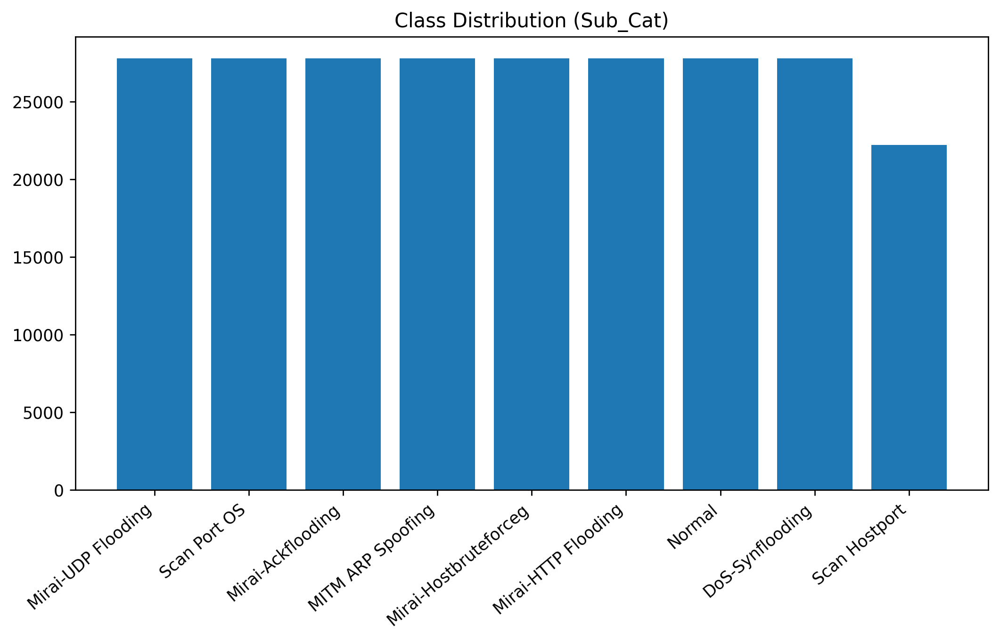

**plot_confusion_matrix_confidence_thresholded.png**

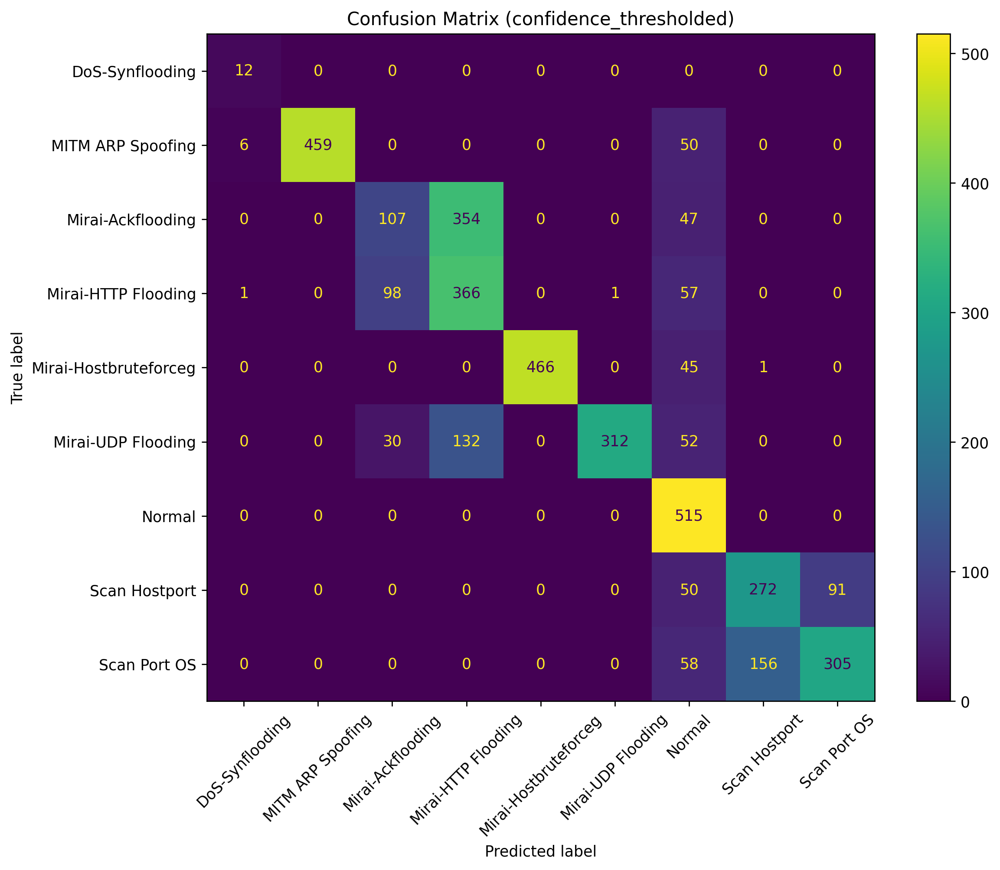

**plot_confusion_matrix_raw.png**

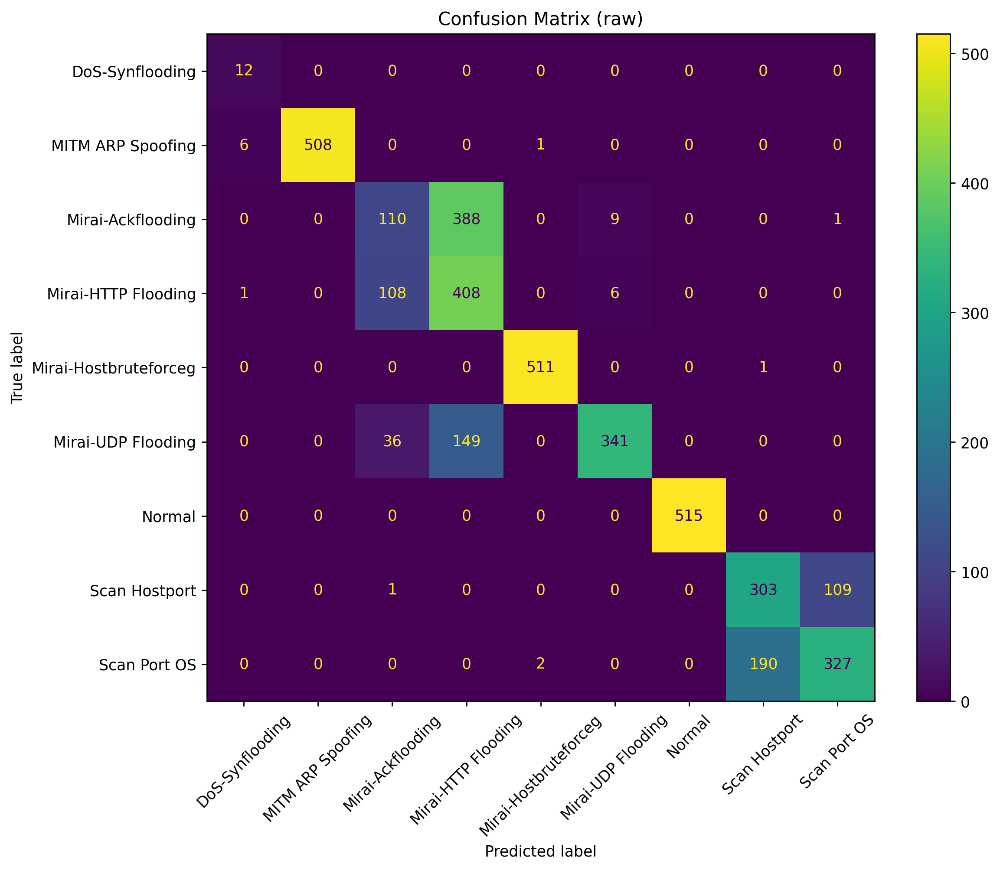

**plot_confusion_matrix_stabilized_voteK5.png**

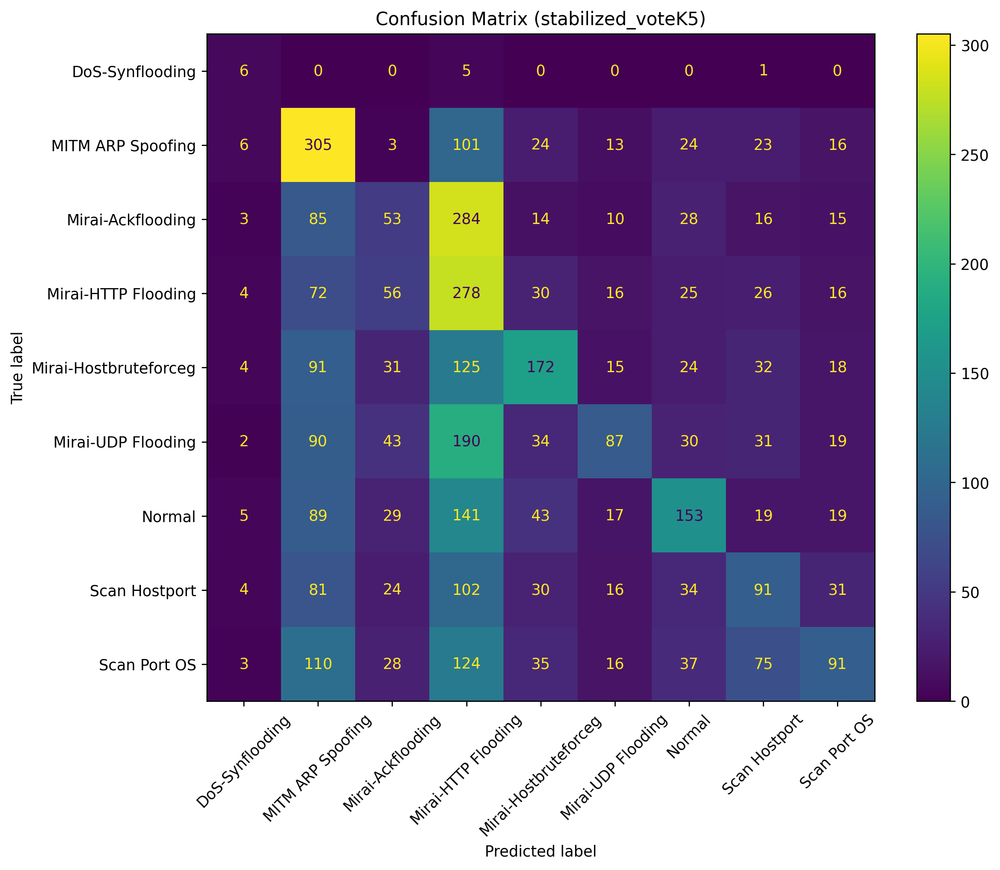

**plot_correlation_heatmap_top25.png**

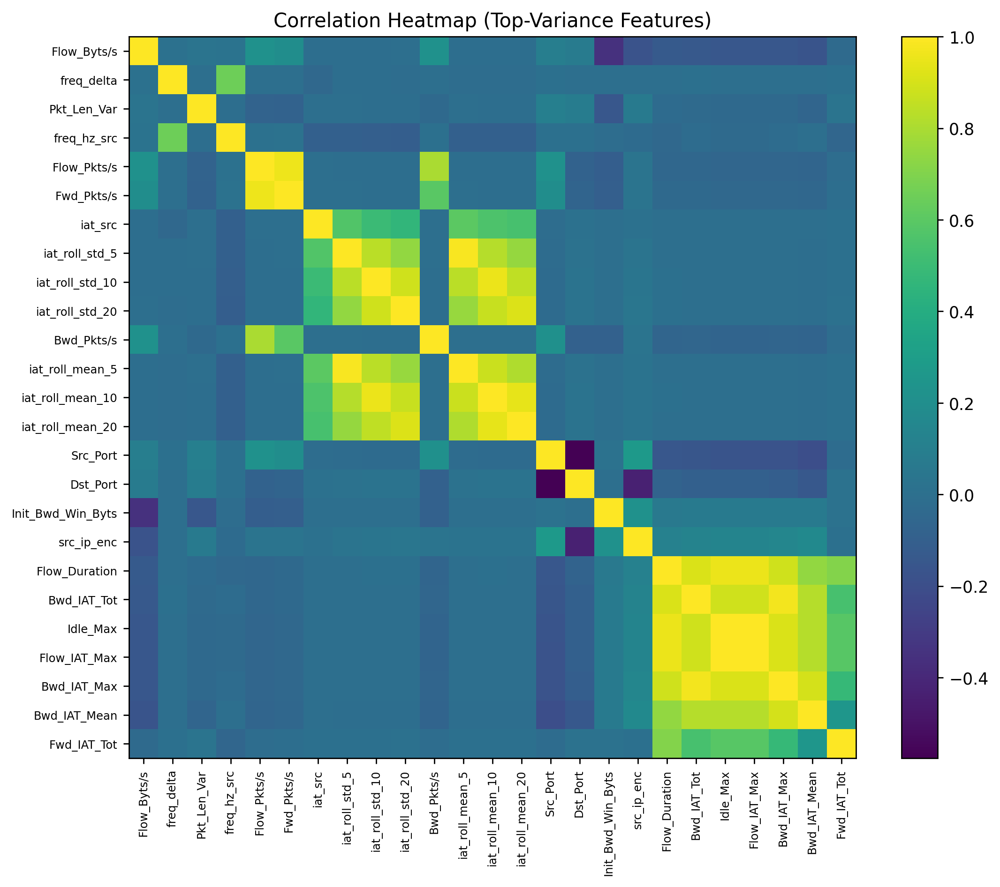

**plot_hourly_flows.png**

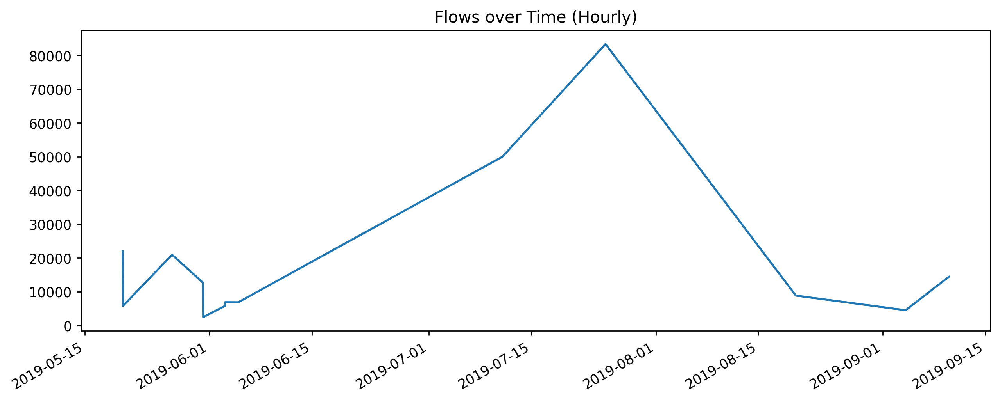

**plot_pca_2d_train10k.png**

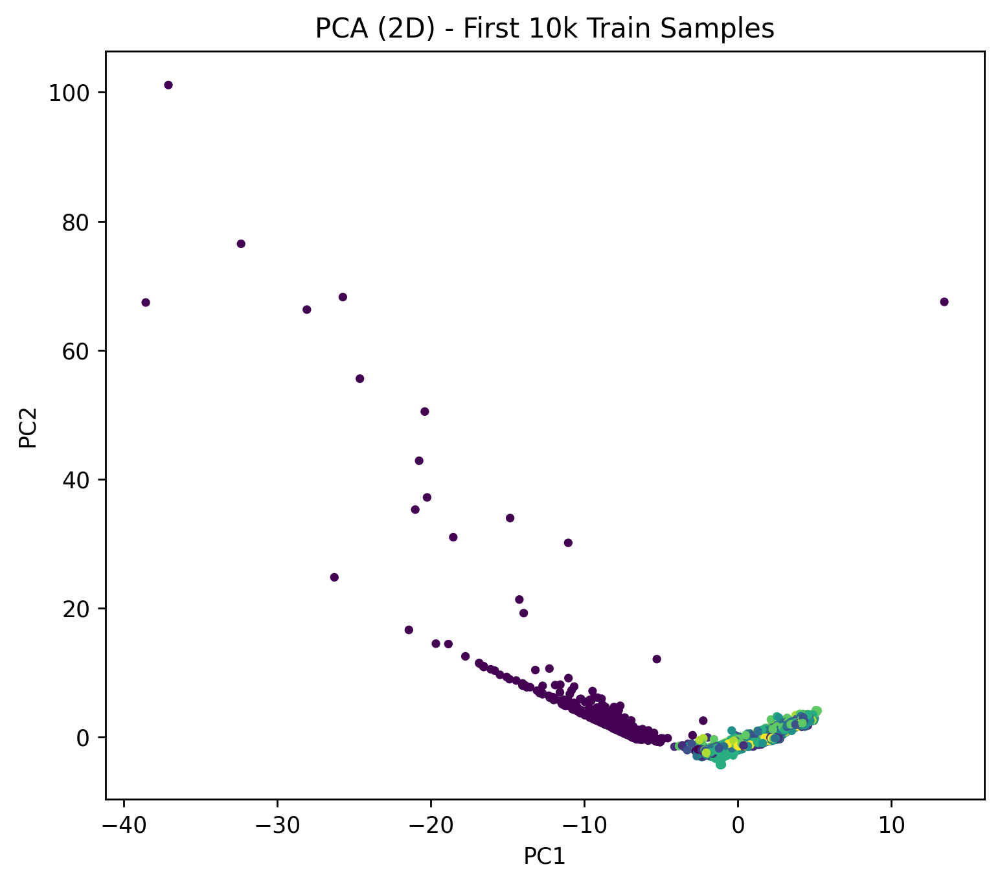

**plot_pr_confidence_thresholded_0_DoS-Synflooding.png**

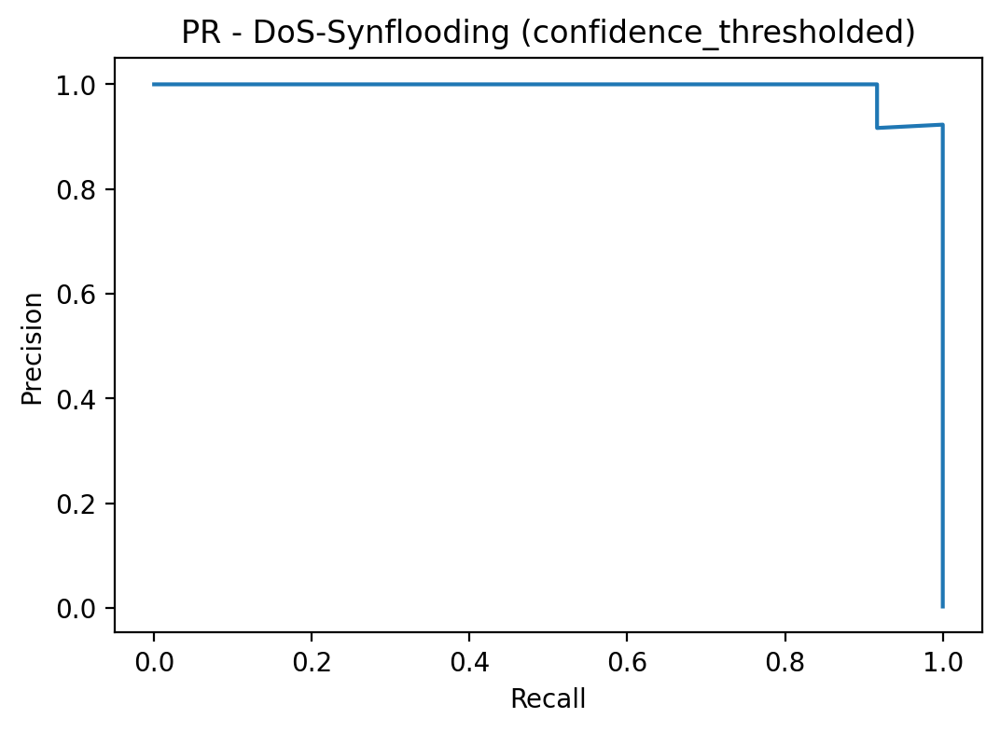

**plot_pr_confidence_thresholded_1_MITM_ARP_Spoofing.png**

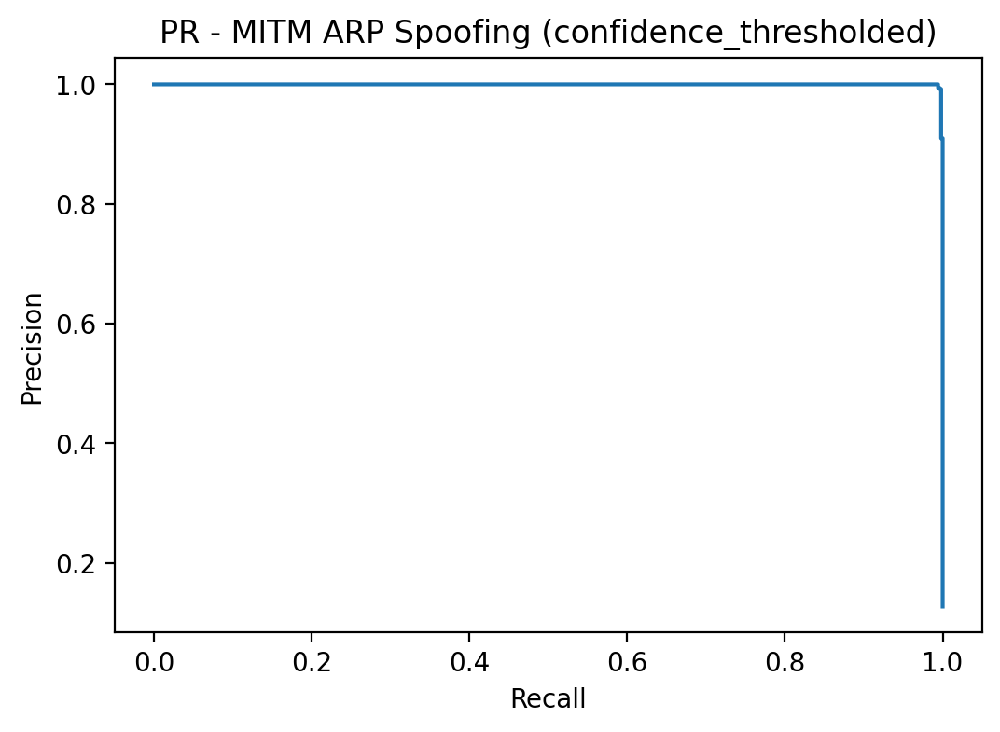

### Graphs 61–80

**plot_pr_confidence_thresholded_2_Mirai-Ackflooding.png**

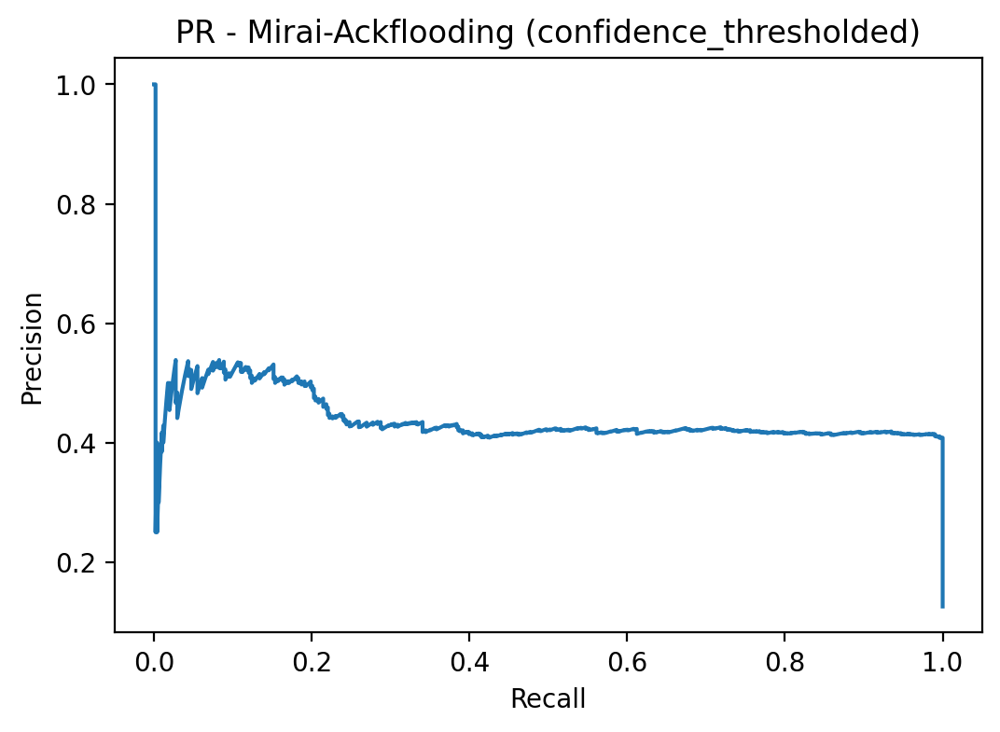

**plot_pr_confidence_thresholded_3_Mirai-HTTP_Flooding.png**

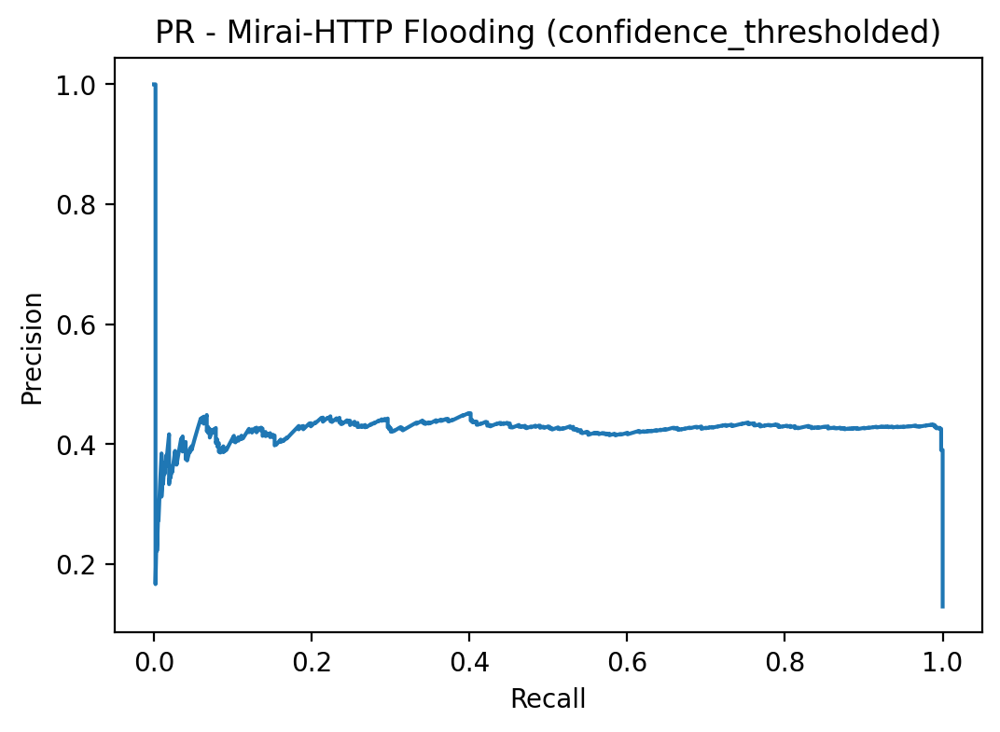

**plot_pr_confidence_thresholded_4_Mirai-Hostbruteforceg.png**

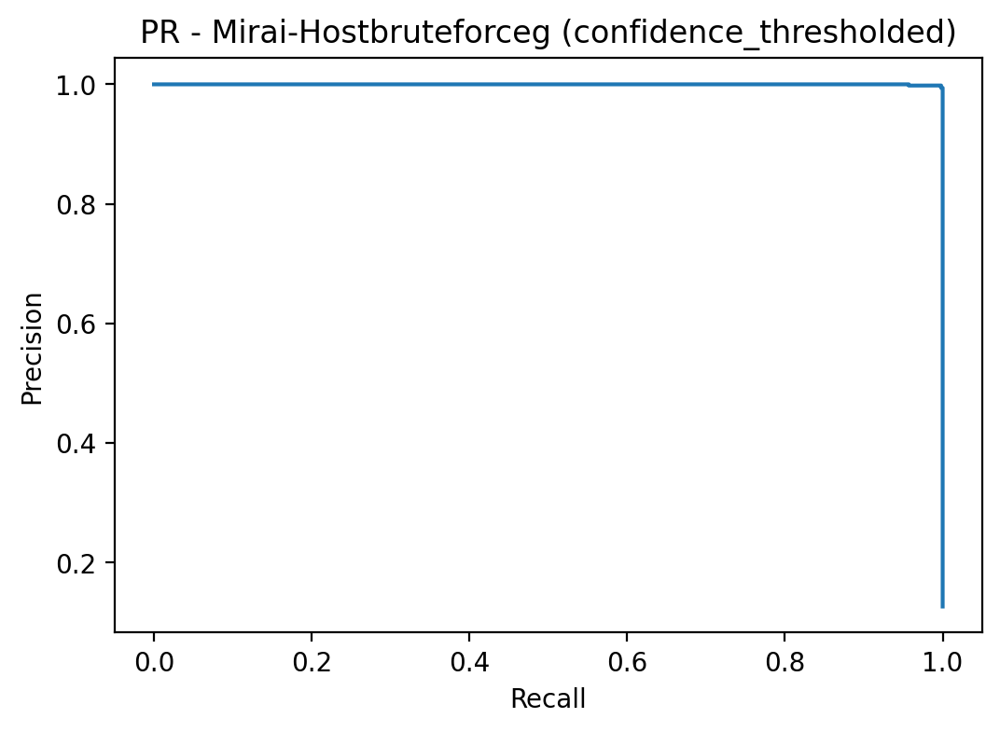

**plot_pr_confidence_thresholded_5_Mirai-UDP_Flooding.png**

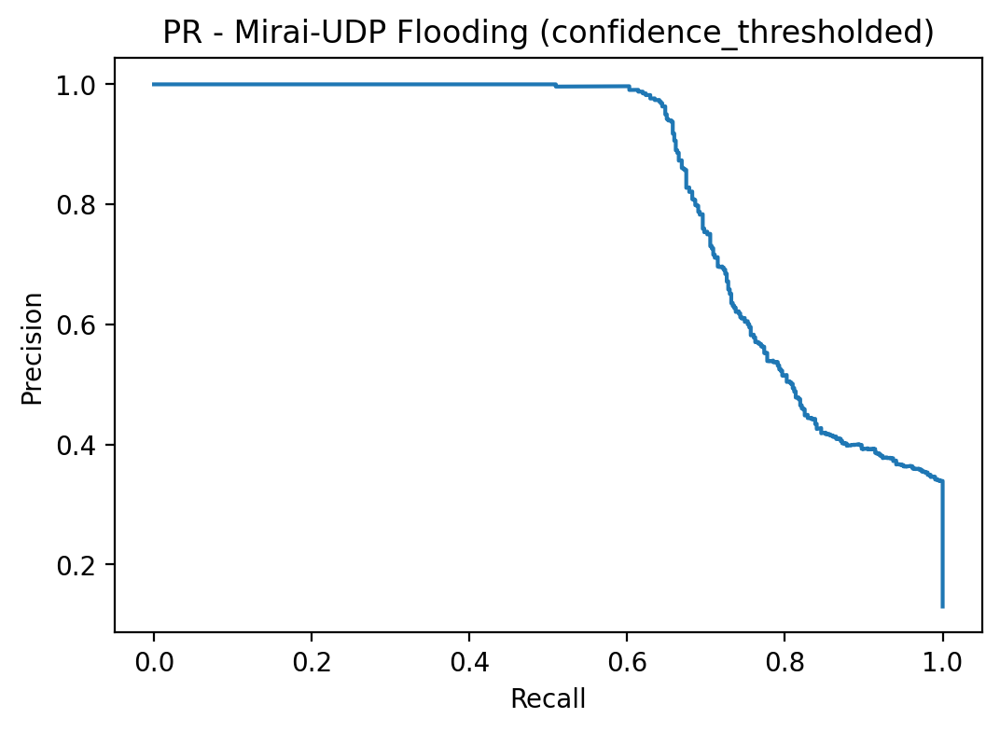

**plot_pr_confidence_thresholded_6_Normal.png**

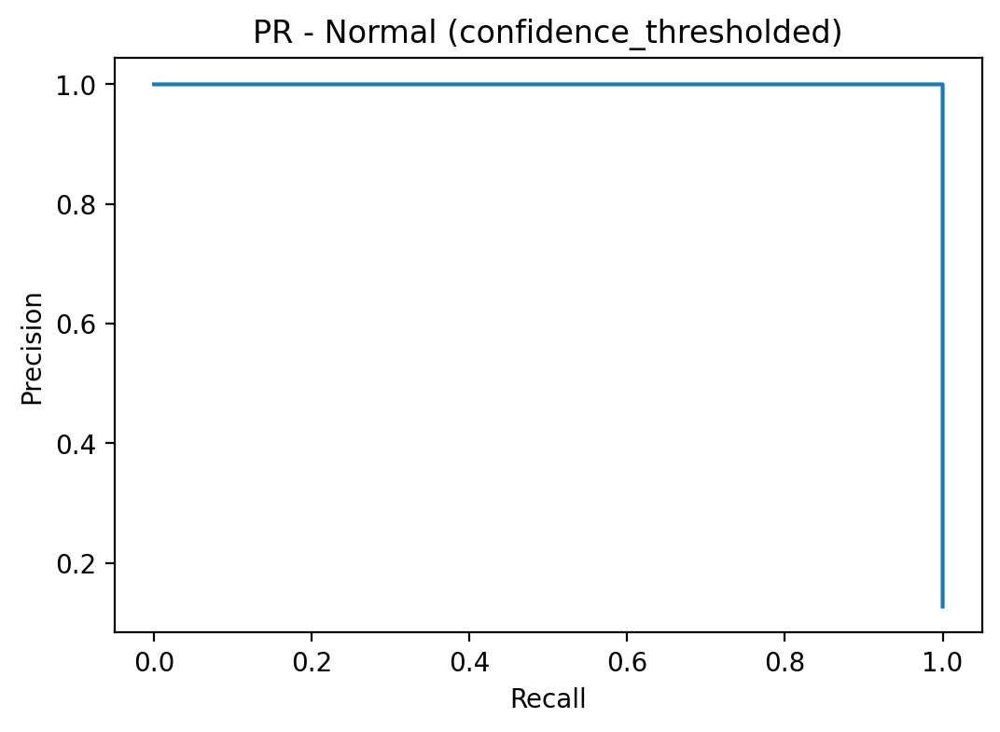

**plot_pr_confidence_thresholded_7_Scan_Hostport.png**

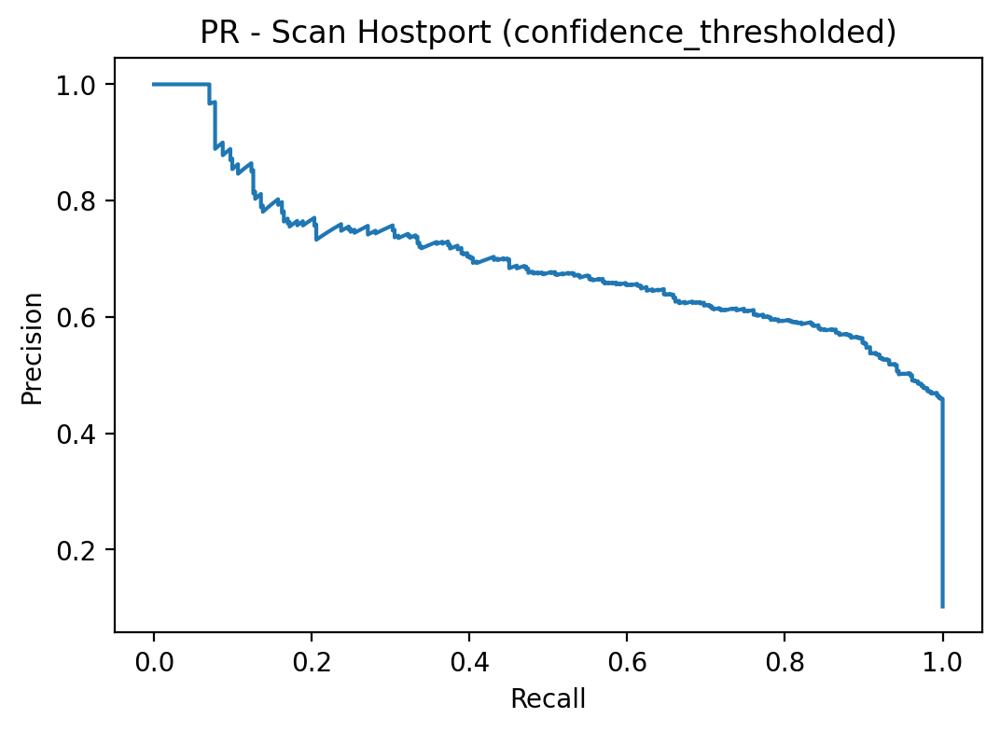

**plot_pr_confidence_thresholded_8_Scan_Port_OS.png**

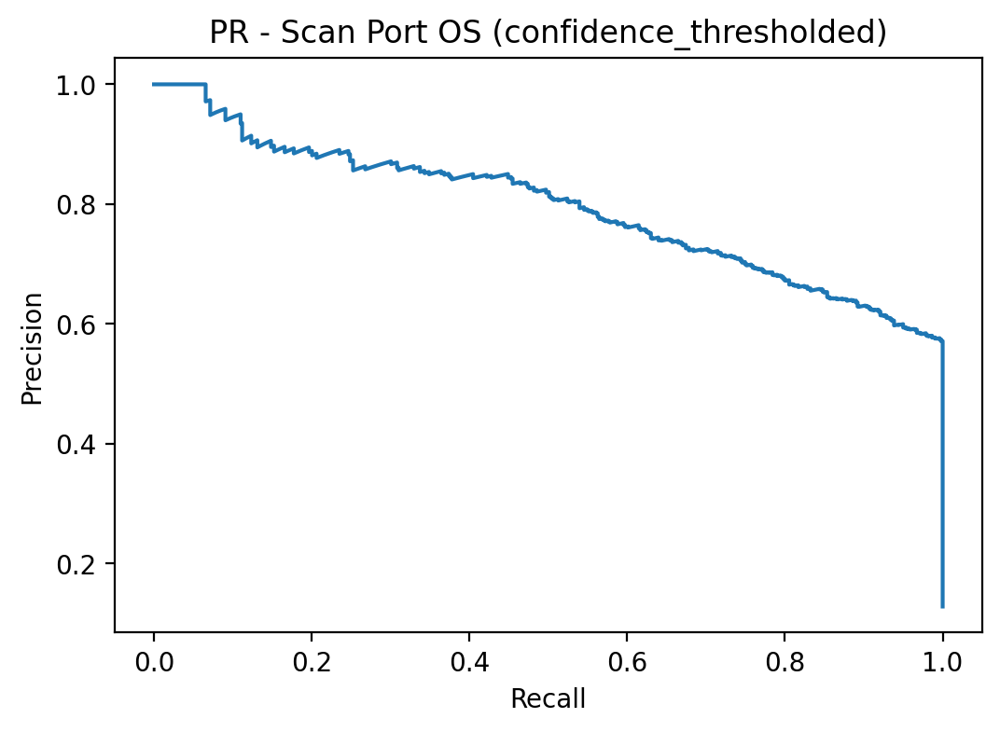

**plot_pr_raw_0_DoS-Synflooding.png**

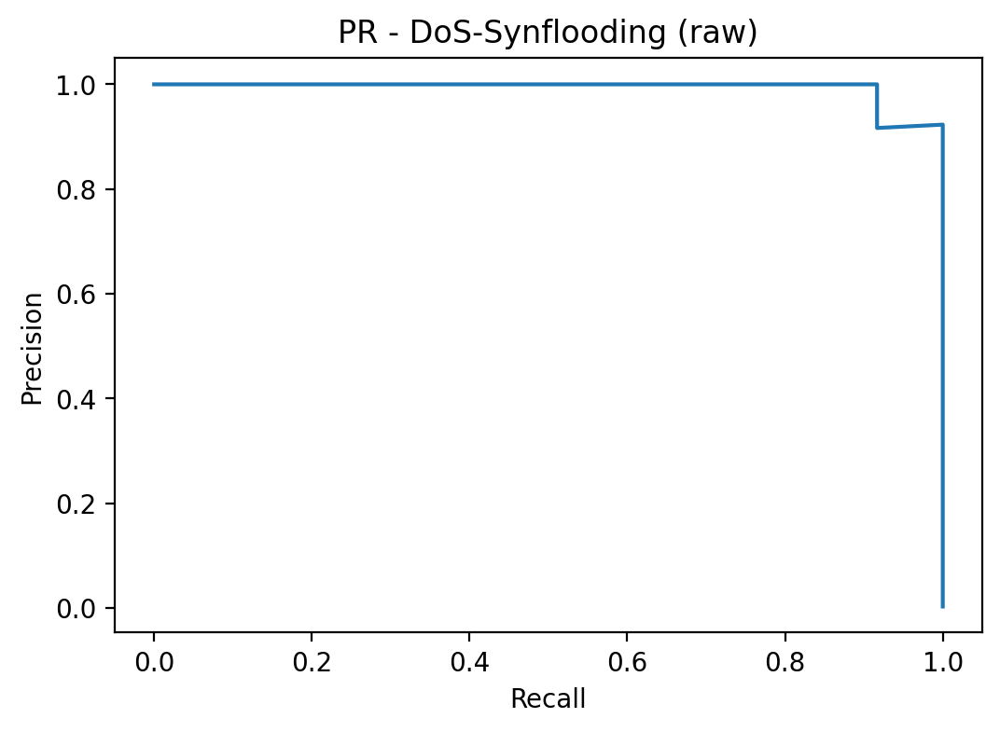

**plot_pr_raw_1_MITM_ARP_Spoofing.png**

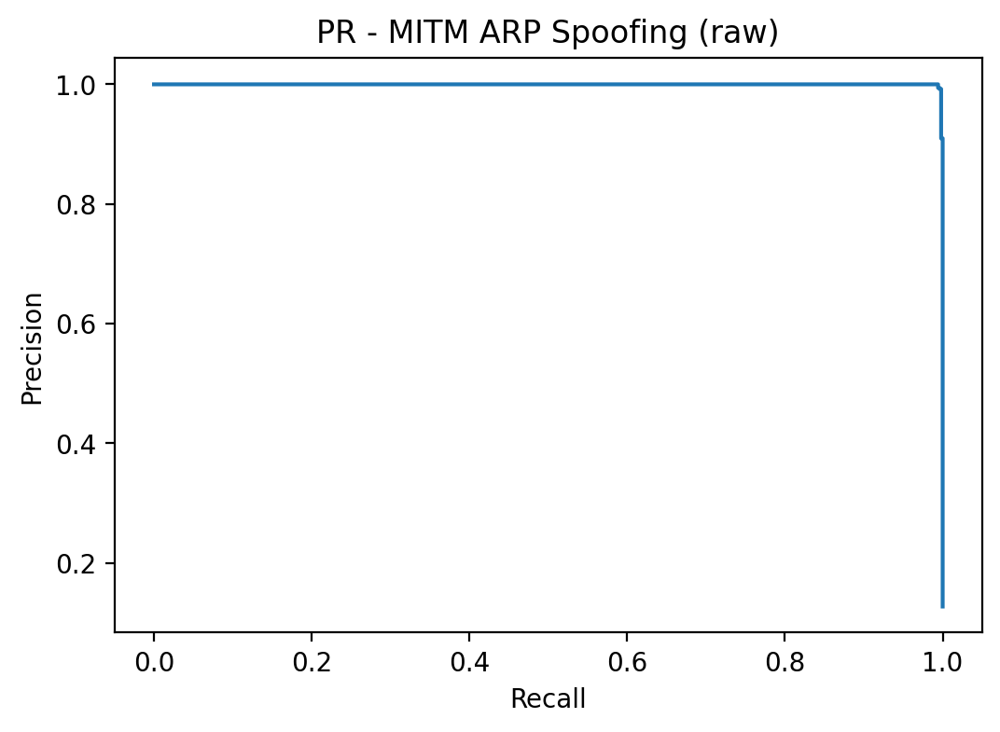

**plot_pr_raw_2_Mirai-Ackflooding.png**

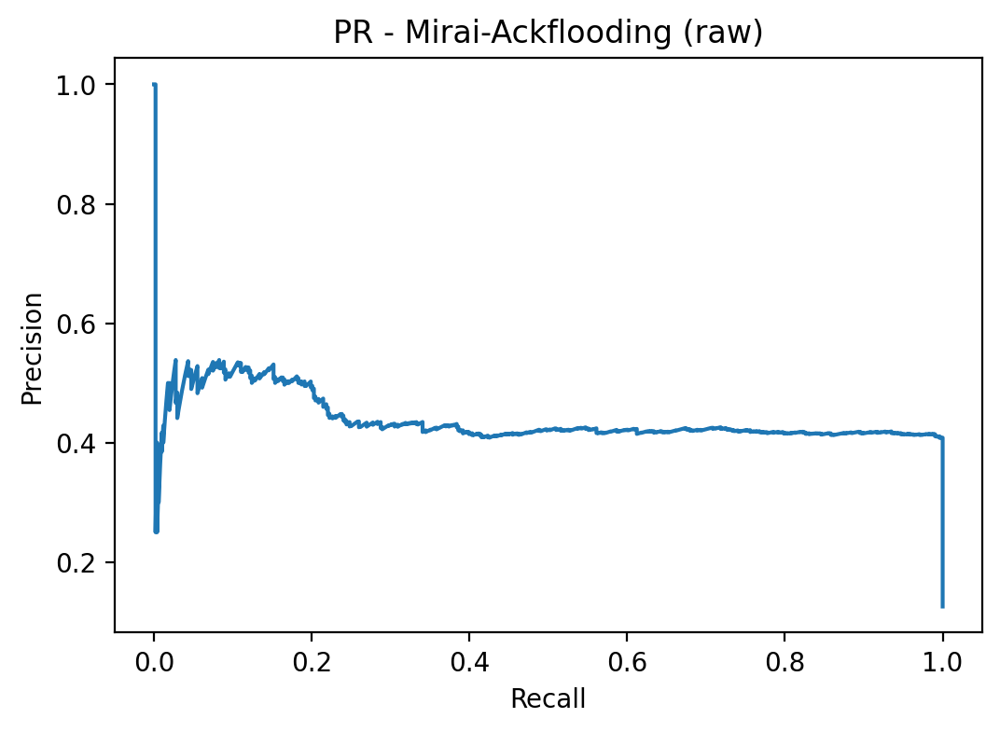

**plot_pr_raw_3_Mirai-HTTP_Flooding.png**

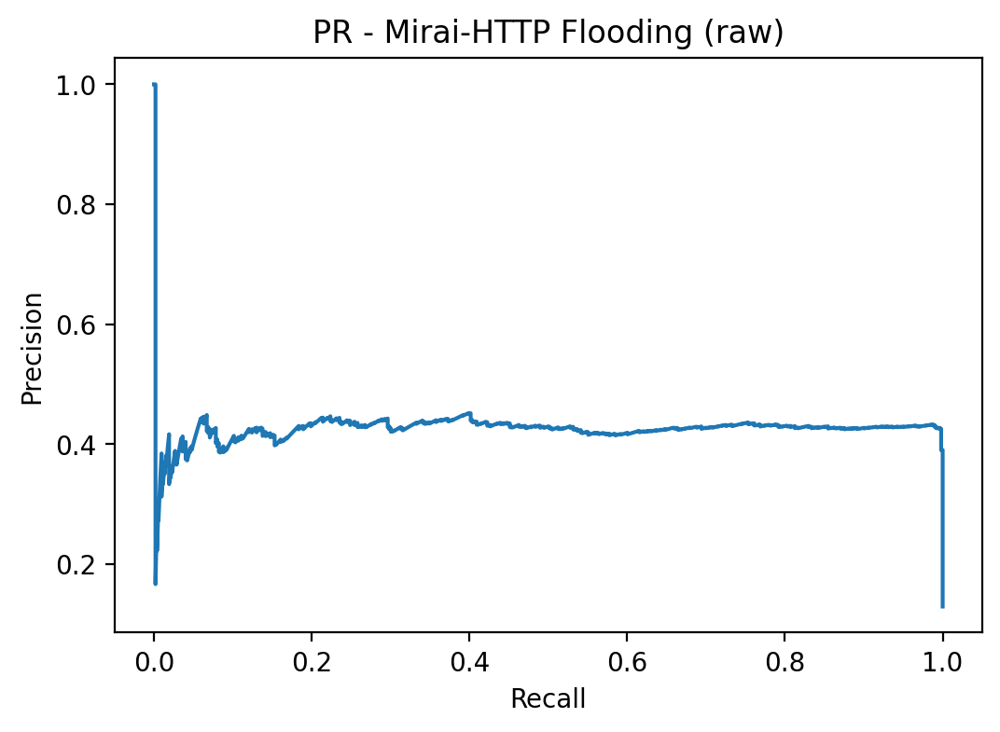

**plot_pr_raw_4_Mirai-Hostbruteforceg.png**

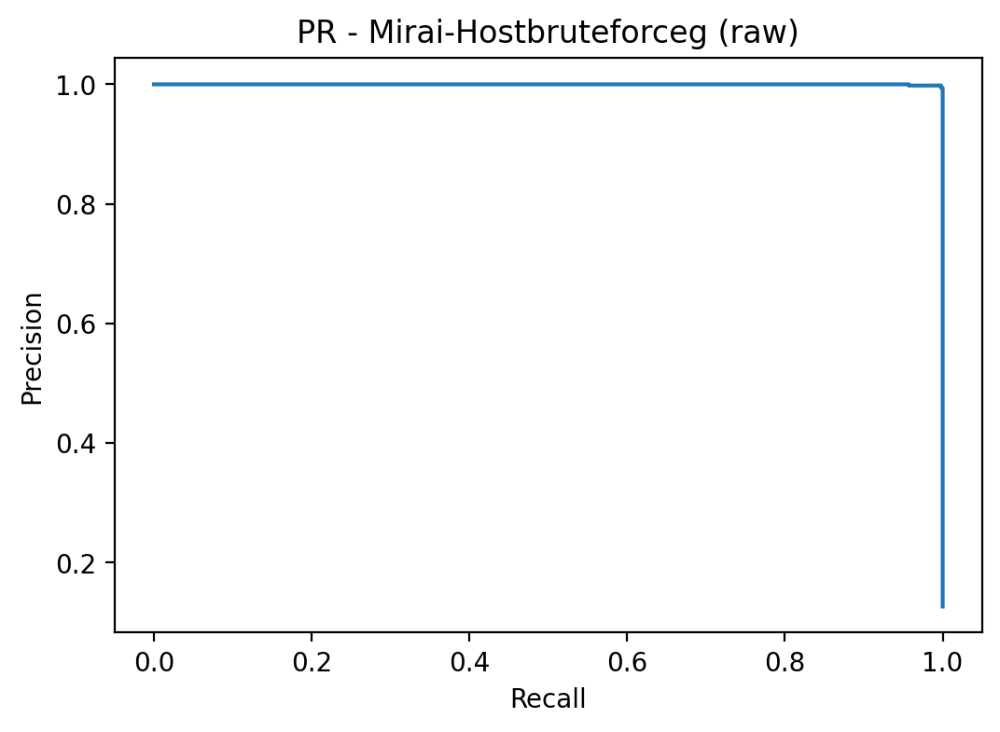

**plot_pr_raw_5_Mirai-UDP_Flooding.png**

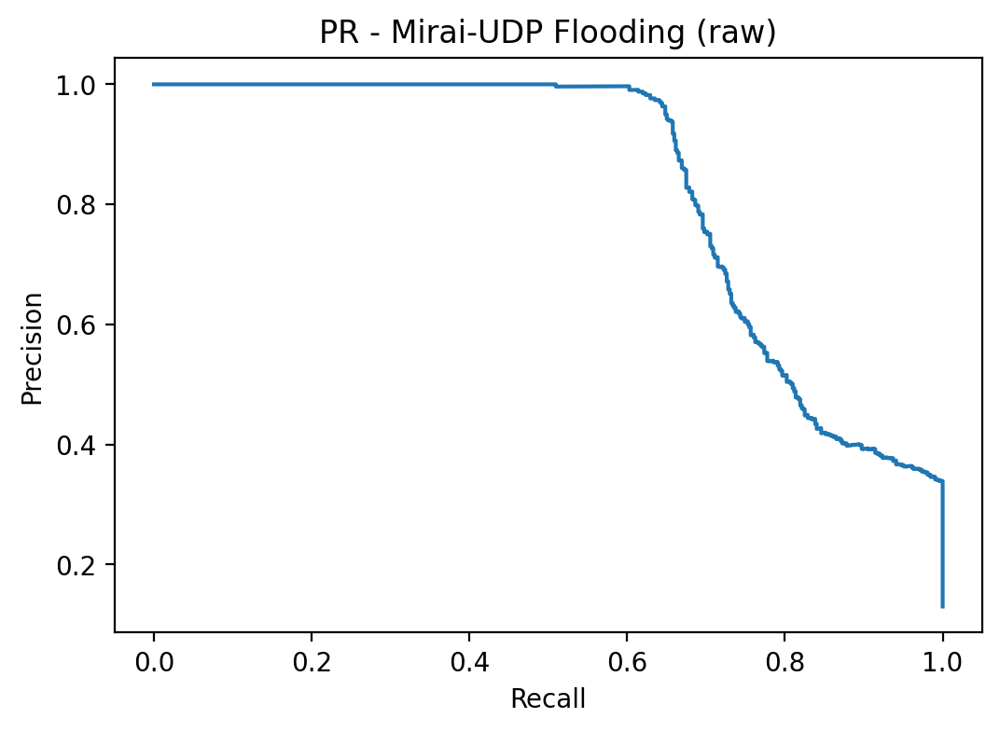

**plot_pr_raw_6_Normal.png**

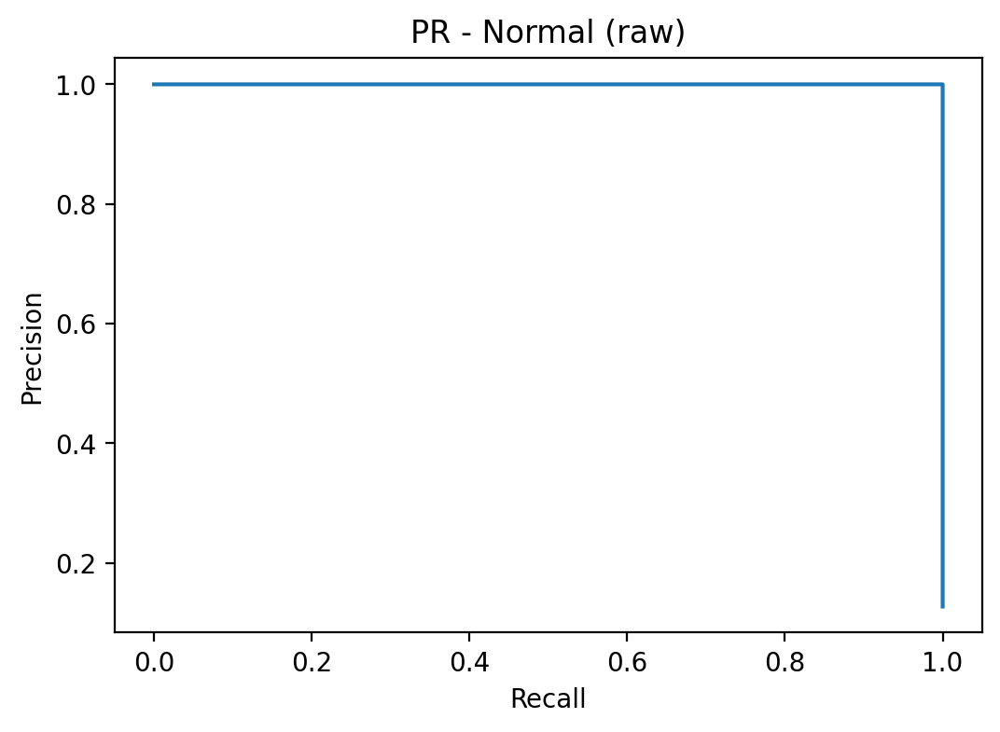

**plot_pr_raw_7_Scan_Hostport.png**

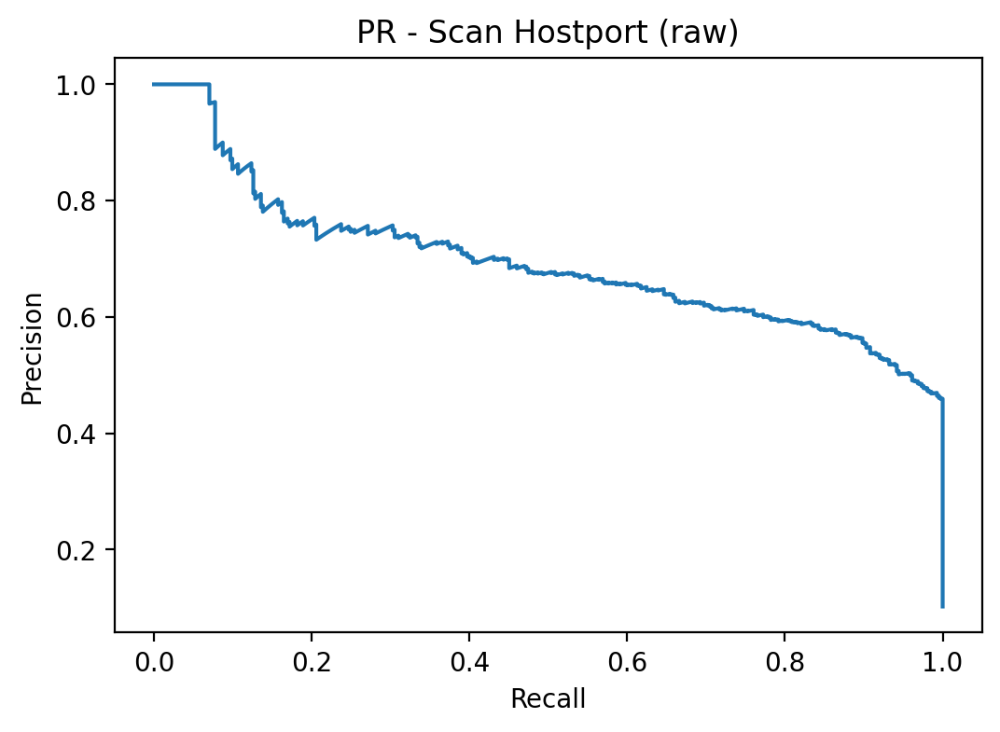

**plot_pr_raw_8_Scan_Port_OS.png**

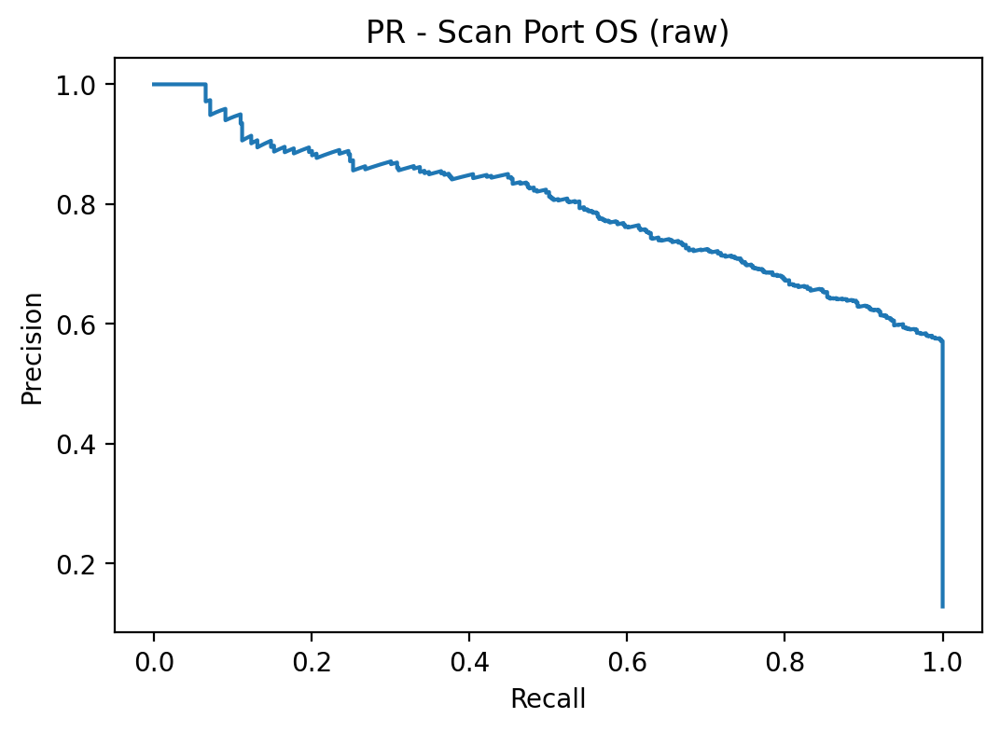

**plot_pr_stabilized_voteK5_0_DoS-Synflooding.png**

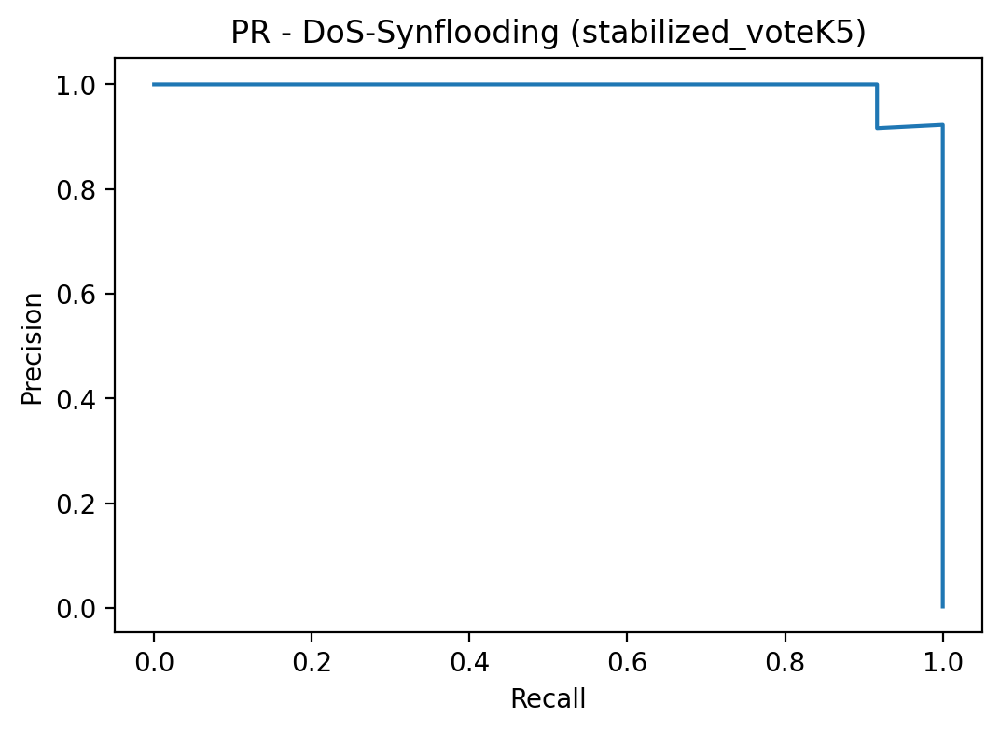

**plot_pr_stabilized_voteK5_1_MITM_ARP_Spoofing.png**

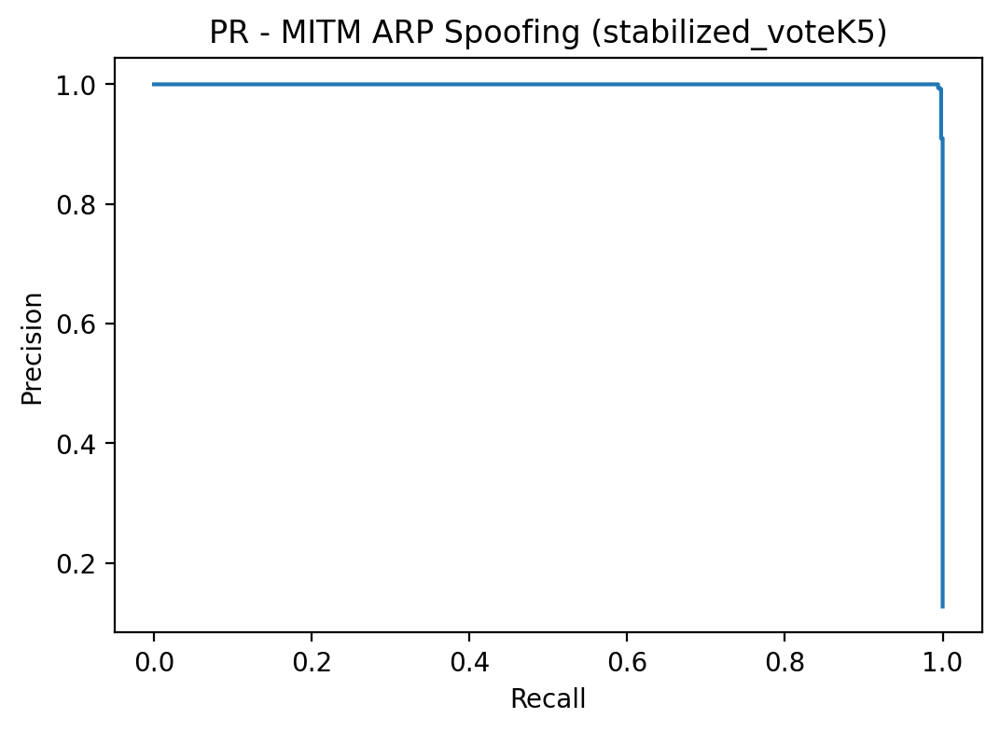

**plot_pr_stabilized_voteK5_2_Mirai-Ackflooding.png**

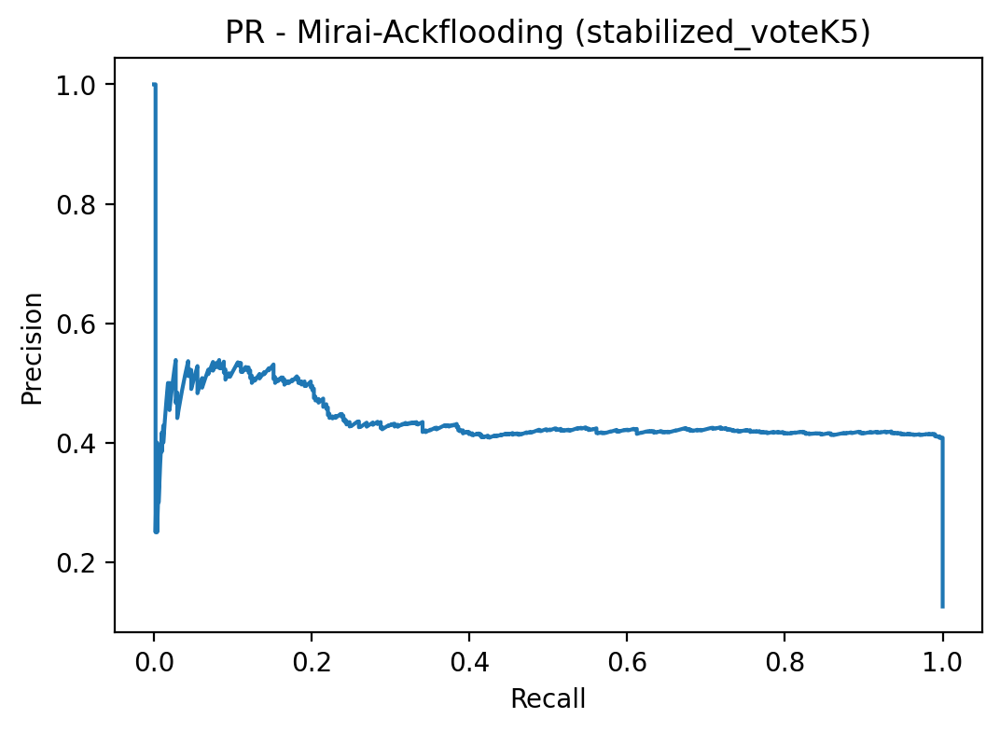

**plot_pr_stabilized_voteK5_3_Mirai-HTTP_Flooding.png**

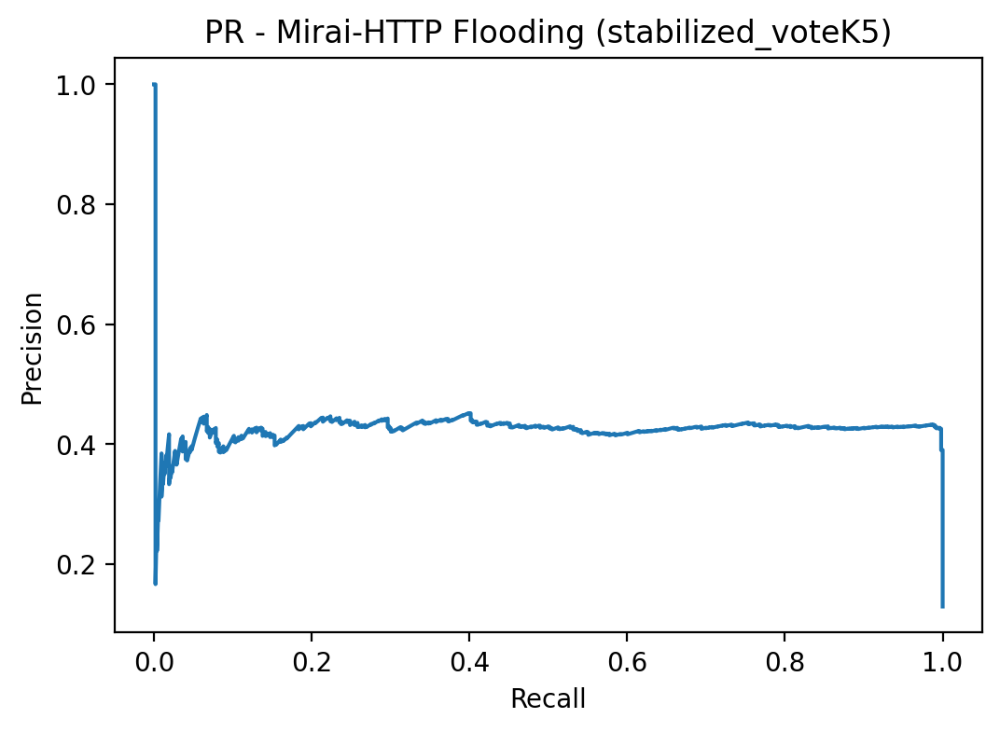

### Graphs 81–100

**plot_pr_stabilized_voteK5_4_Mirai-Hostbruteforceg.png**

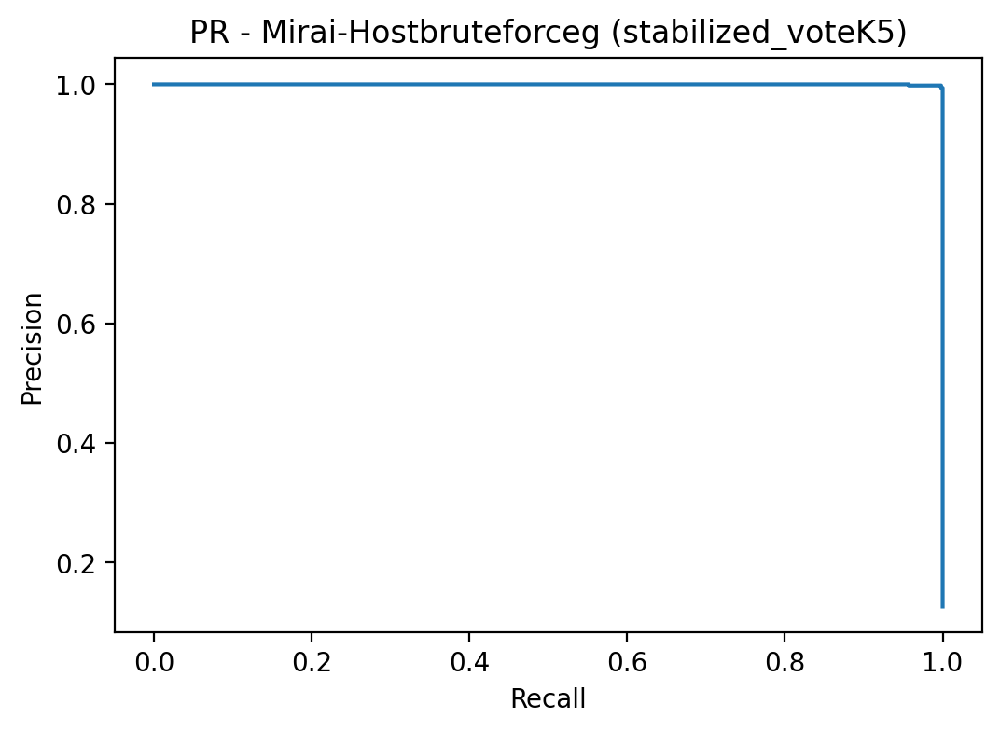

**plot_pr_stabilized_voteK5_5_Mirai-UDP_Flooding.png**

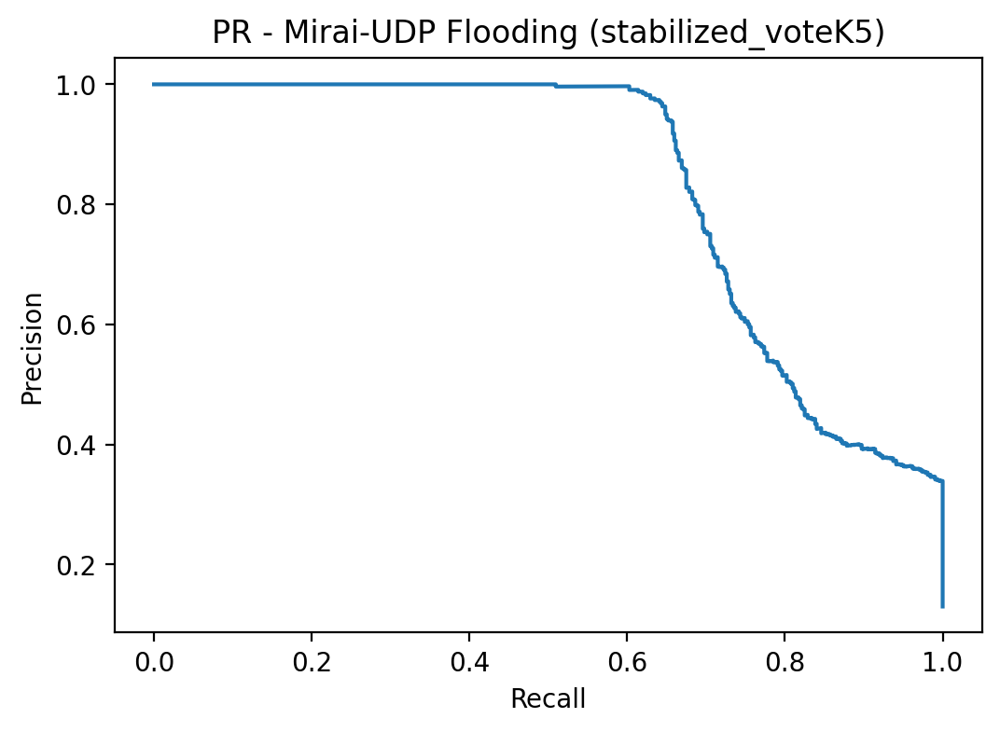

**plot_pr_stabilized_voteK5_6_Normal.png**

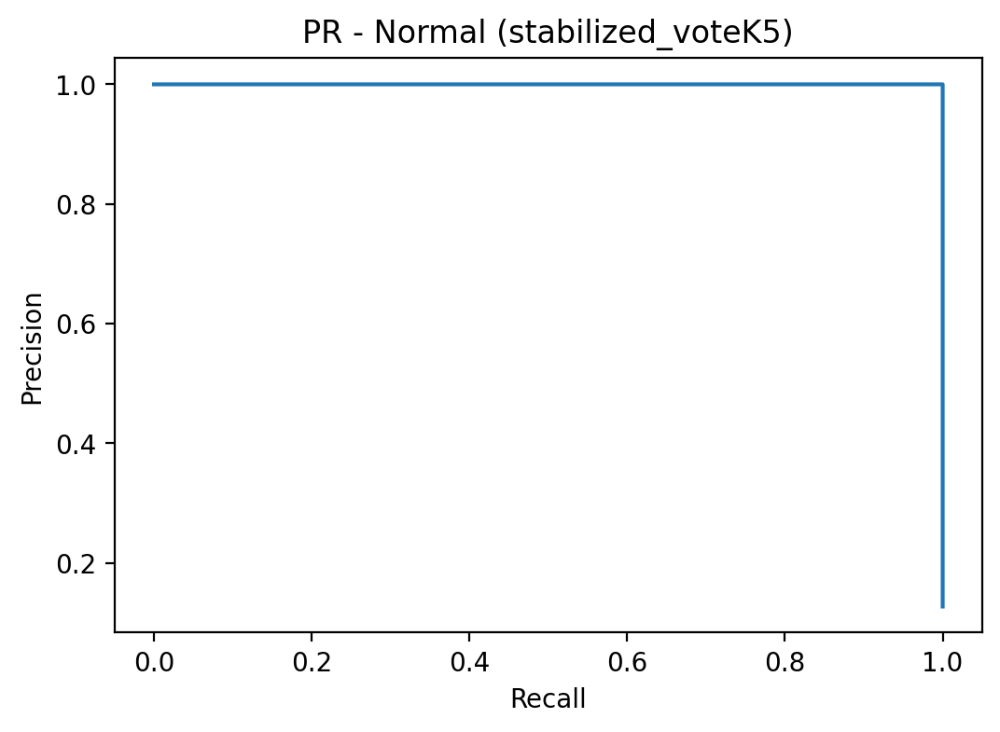

**plot_pr_stabilized_voteK5_7_Scan_Hostport.png**

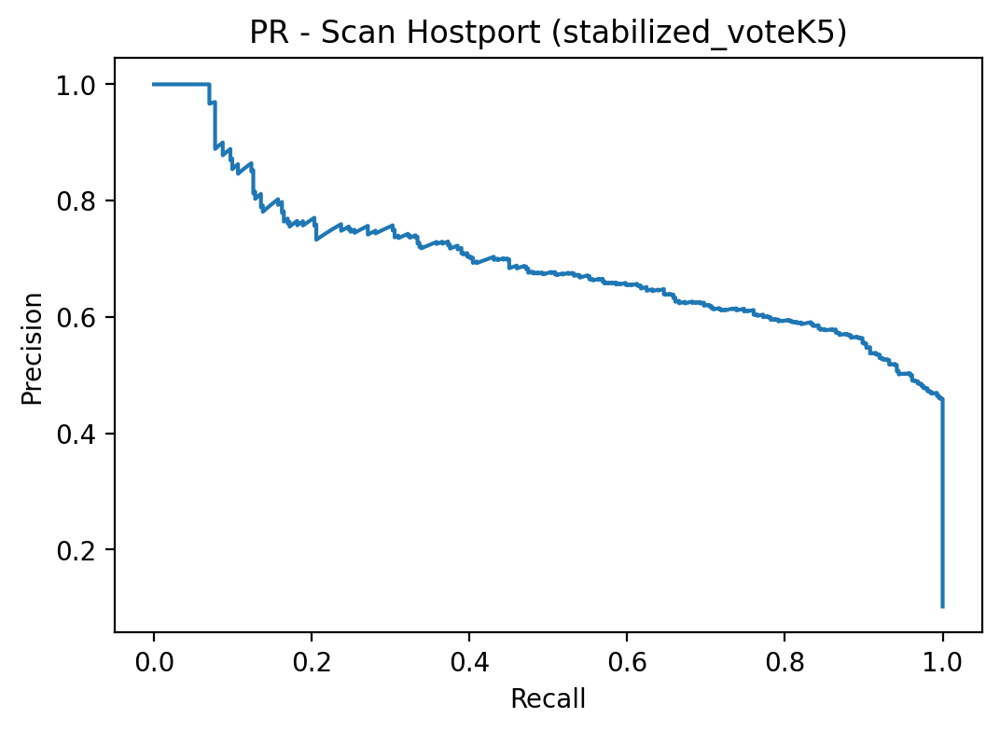

**plot_pr_stabilized_voteK5_8_Scan_Port_OS.png**

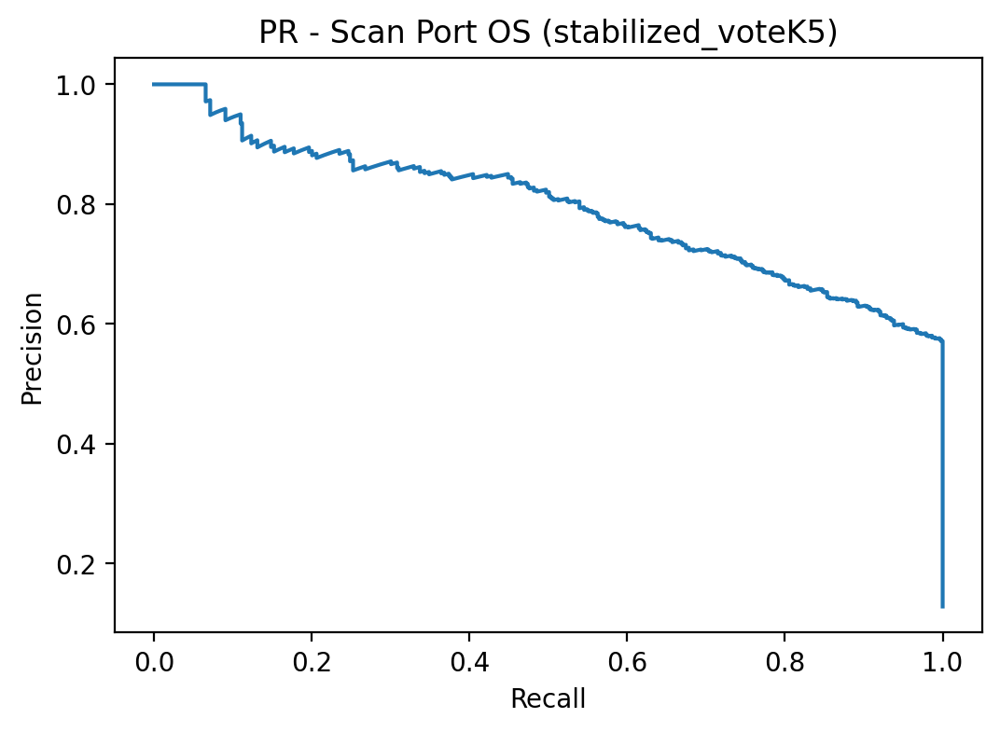

**plot_protocol_distribution.png**

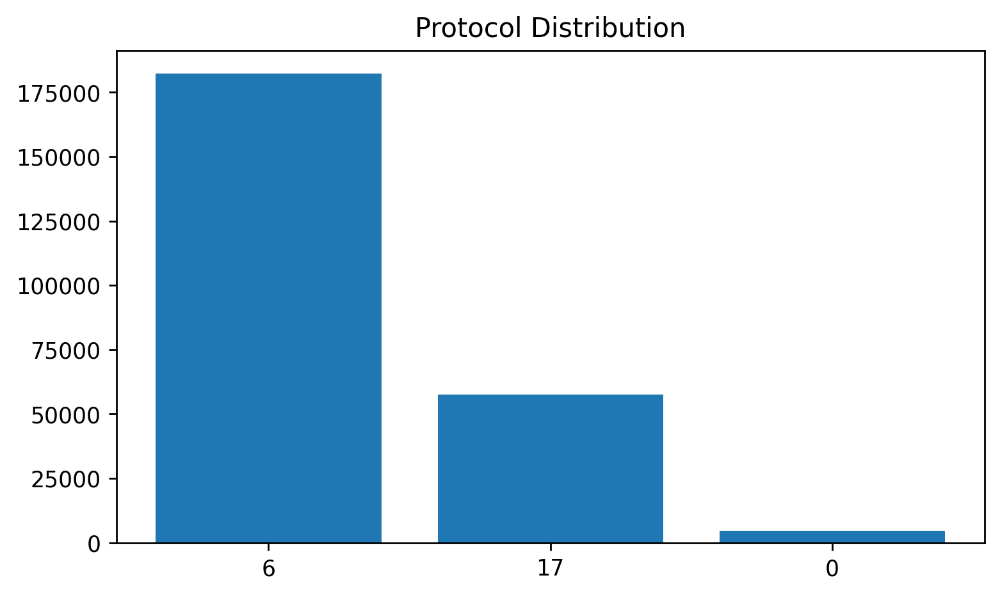

**plot_rf_feature_importance_top30.png**

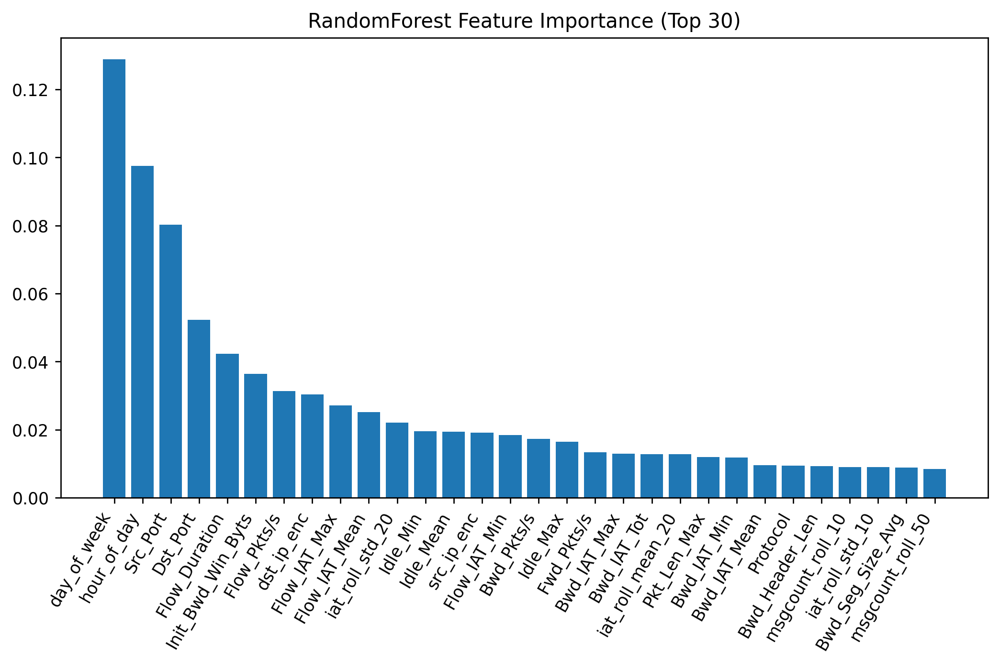

**plot_roc_confidence_thresholded_0_DoS-Synflooding.png**

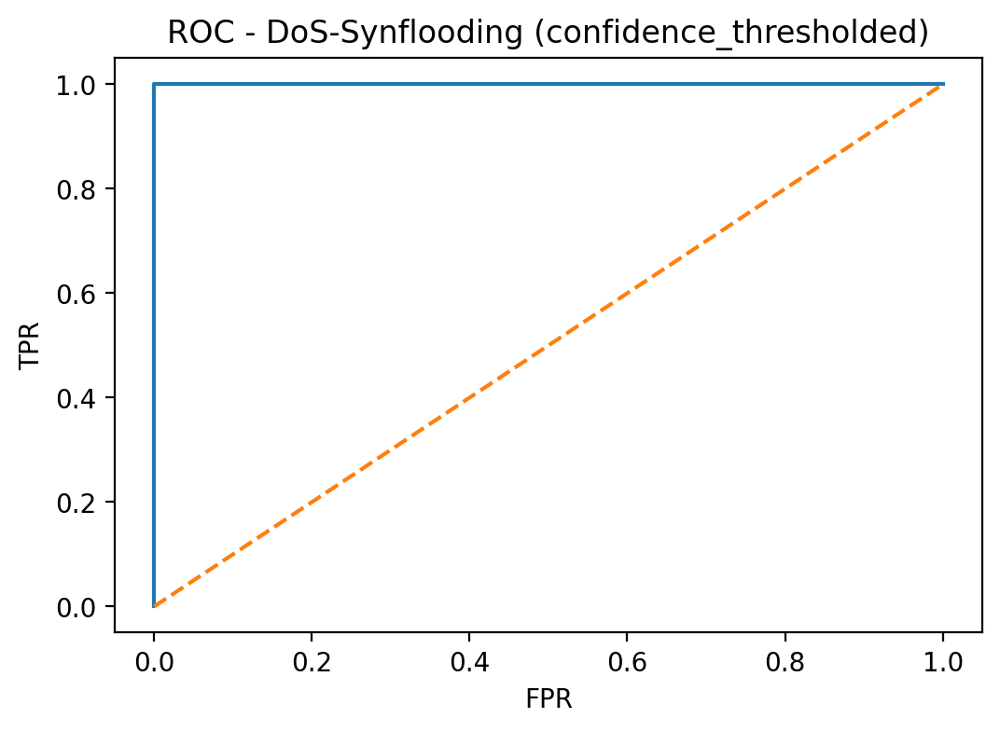

**plot_roc_confidence_thresholded_1_MITM_ARP_Spoofing.png**

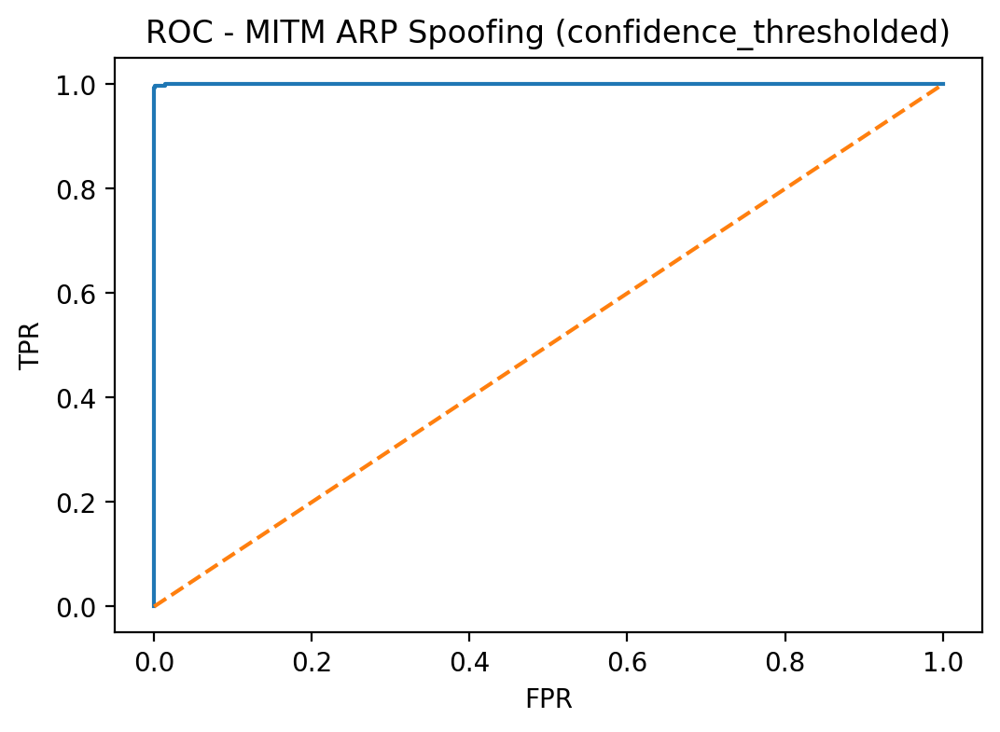

**plot_roc_confidence_thresholded_2_Mirai-Ackflooding.png**

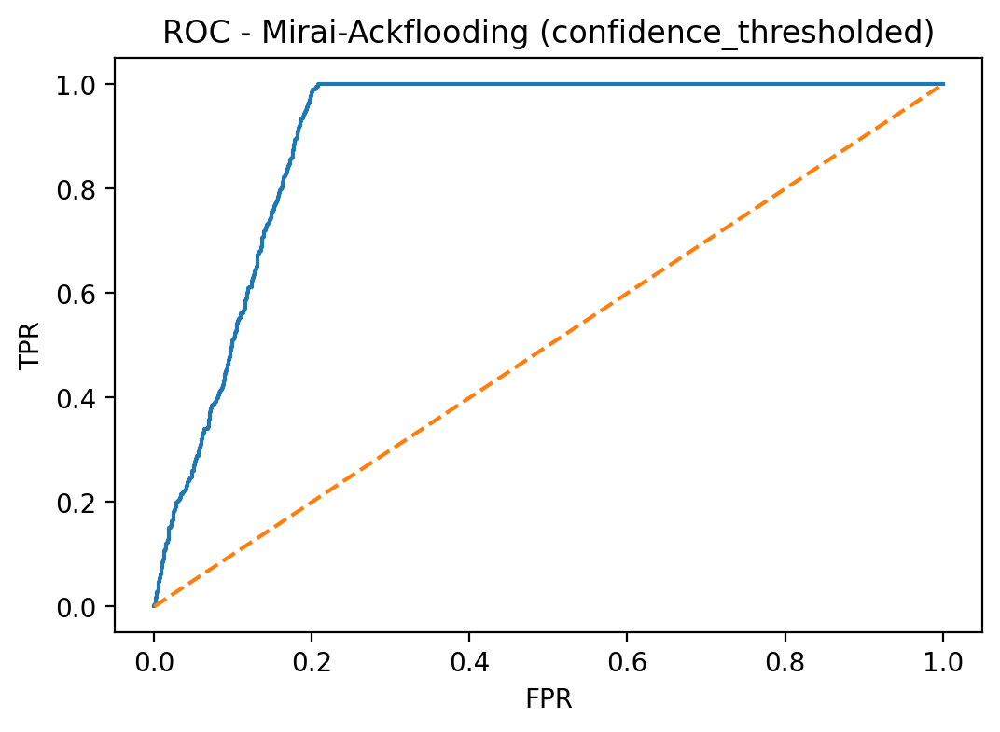

**plot_roc_confidence_thresholded_3_Mirai-HTTP_Flooding.png**

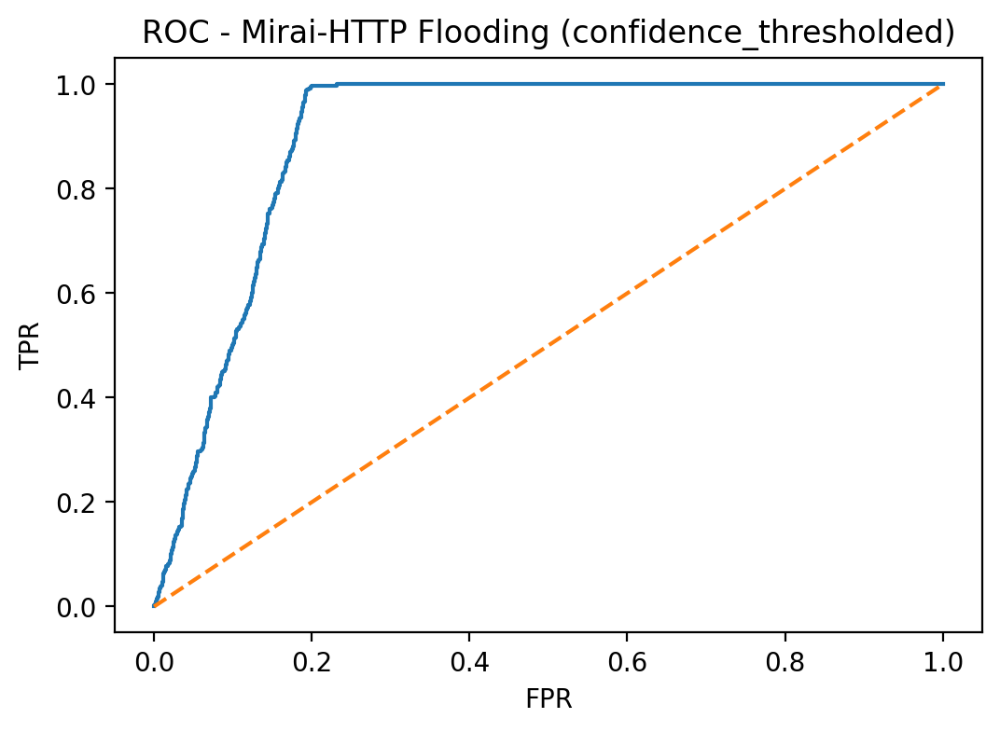

**plot_roc_confidence_thresholded_4_Mirai-Hostbruteforceg.png**

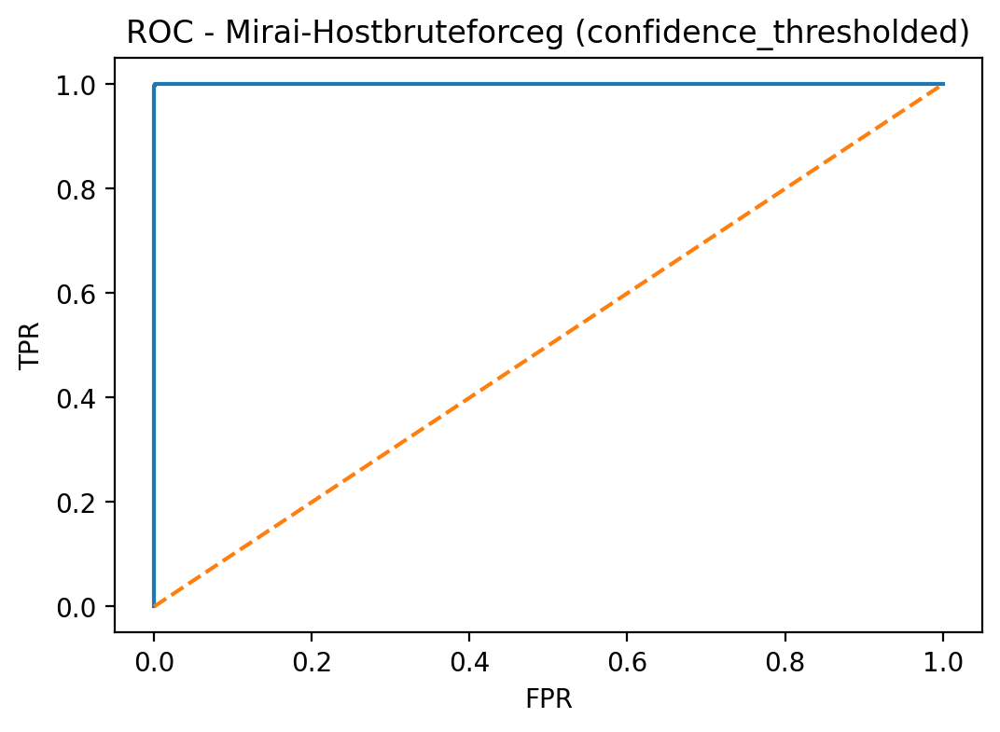

**plot_roc_confidence_thresholded_5_Mirai-UDP_Flooding.png**

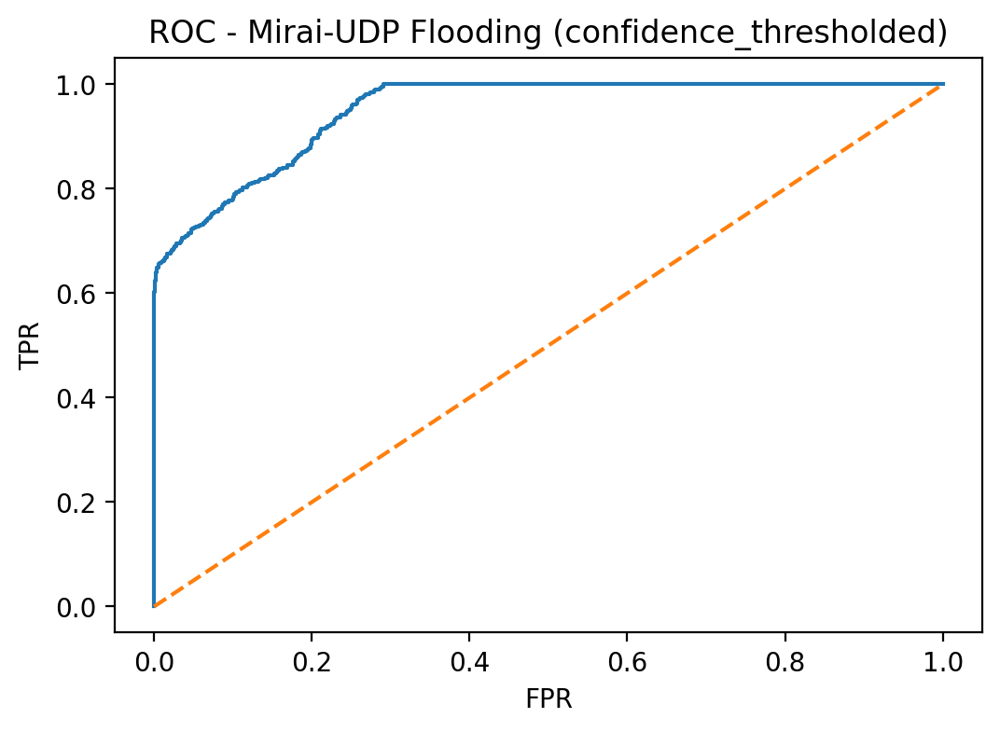

**plot_roc_confidence_thresholded_6_Normal.png**

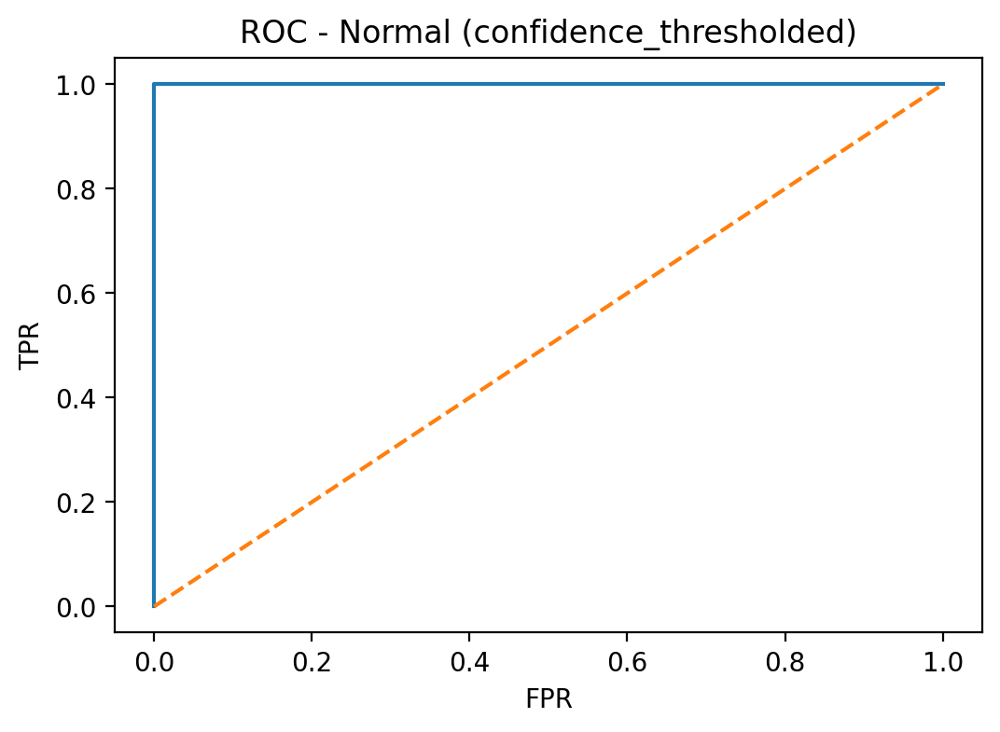

**plot_roc_confidence_thresholded_7_Scan_Hostport.png**

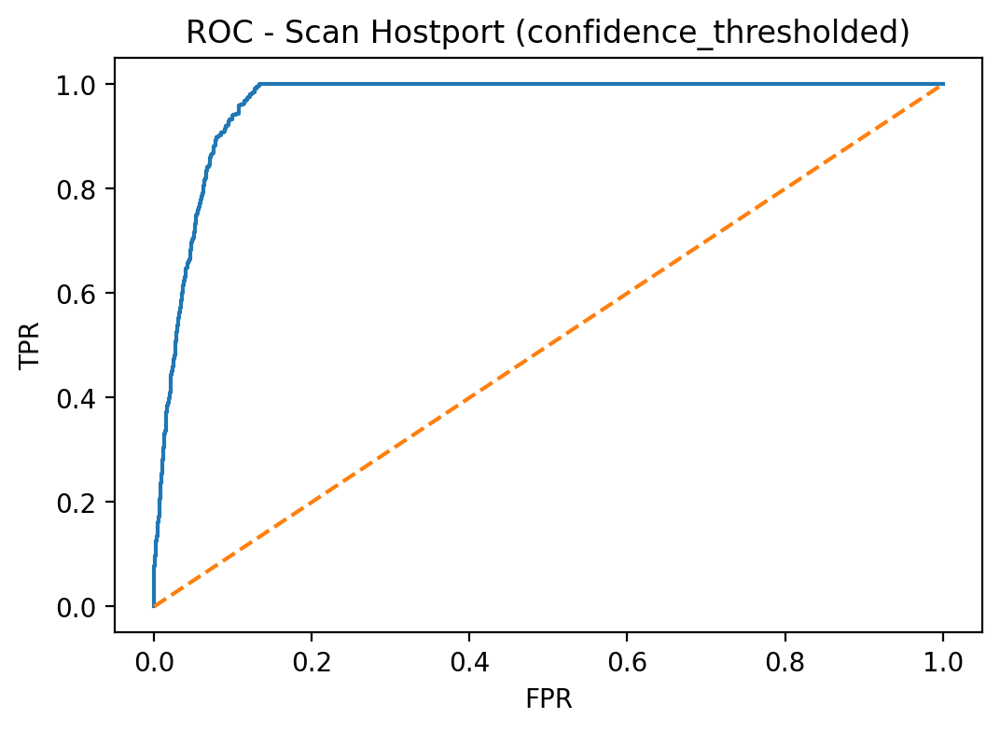

**plot_roc_confidence_thresholded_8_Scan_Port_OS.png**

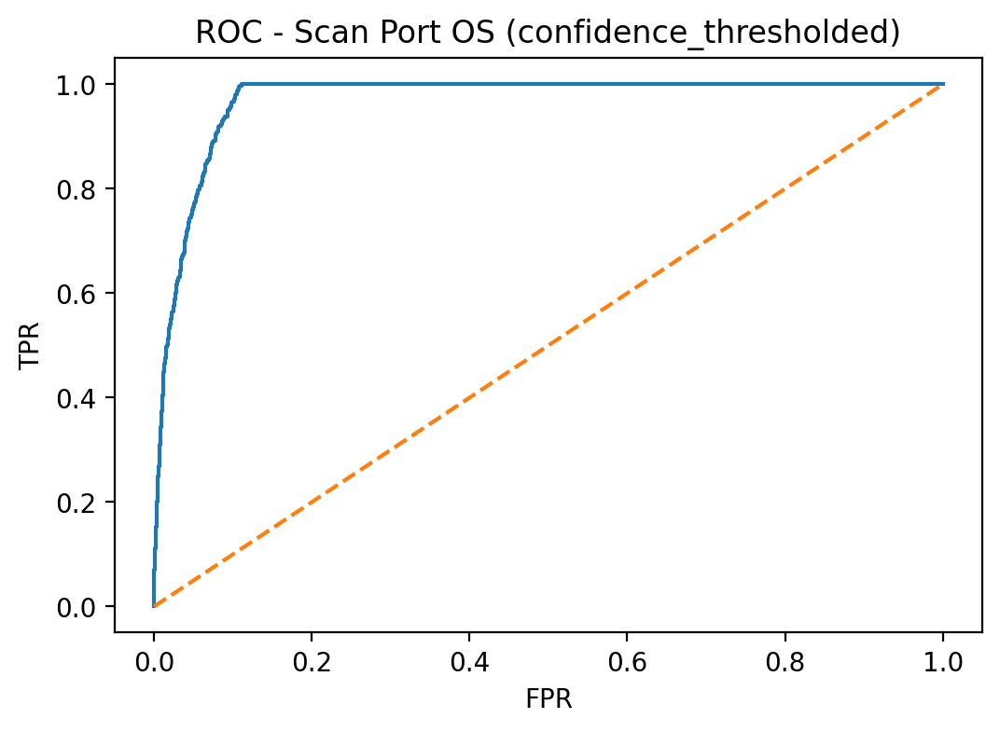

**plot_roc_raw_0_DoS-Synflooding.png**

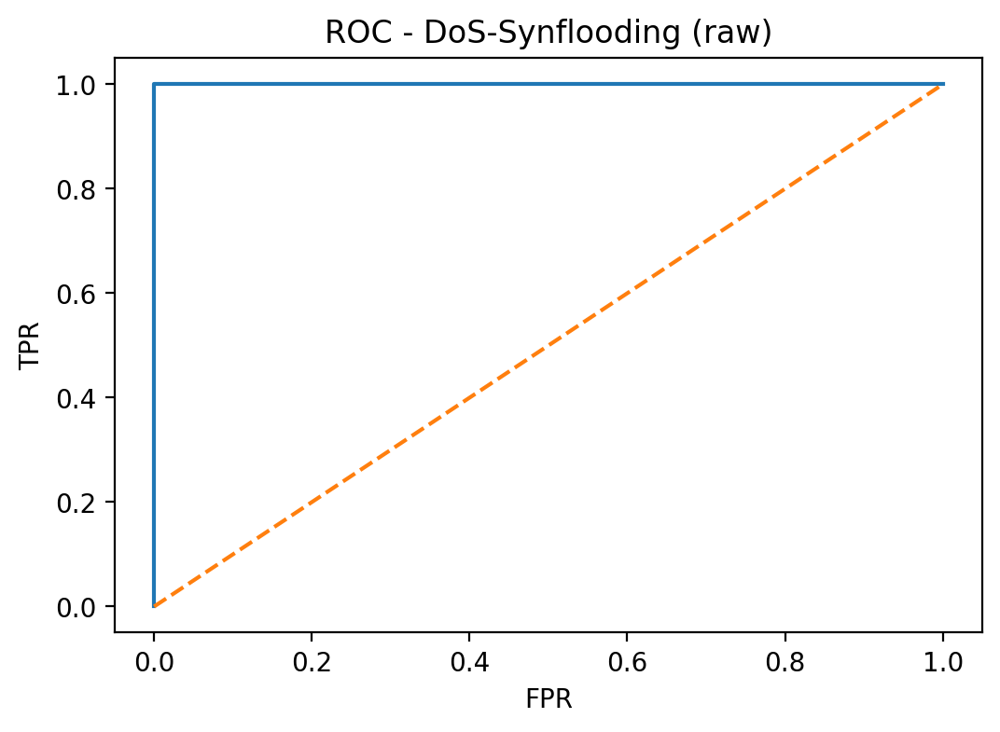

**plot_roc_raw_1_MITM_ARP_Spoofing.png**

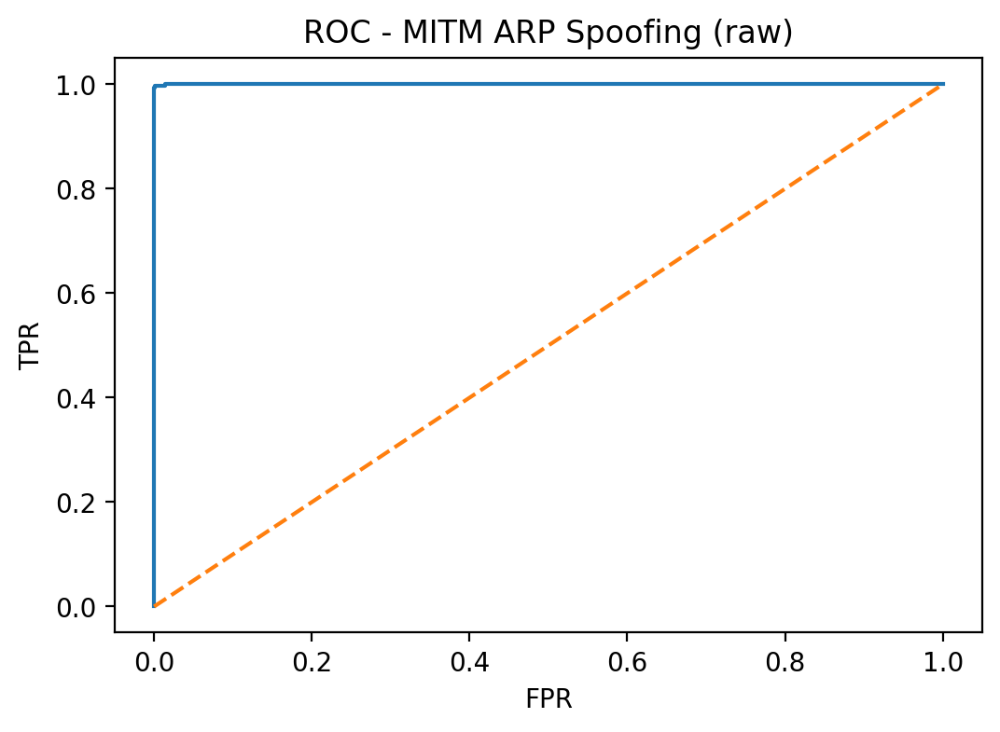

**plot_roc_raw_2_Mirai-Ackflooding.png**

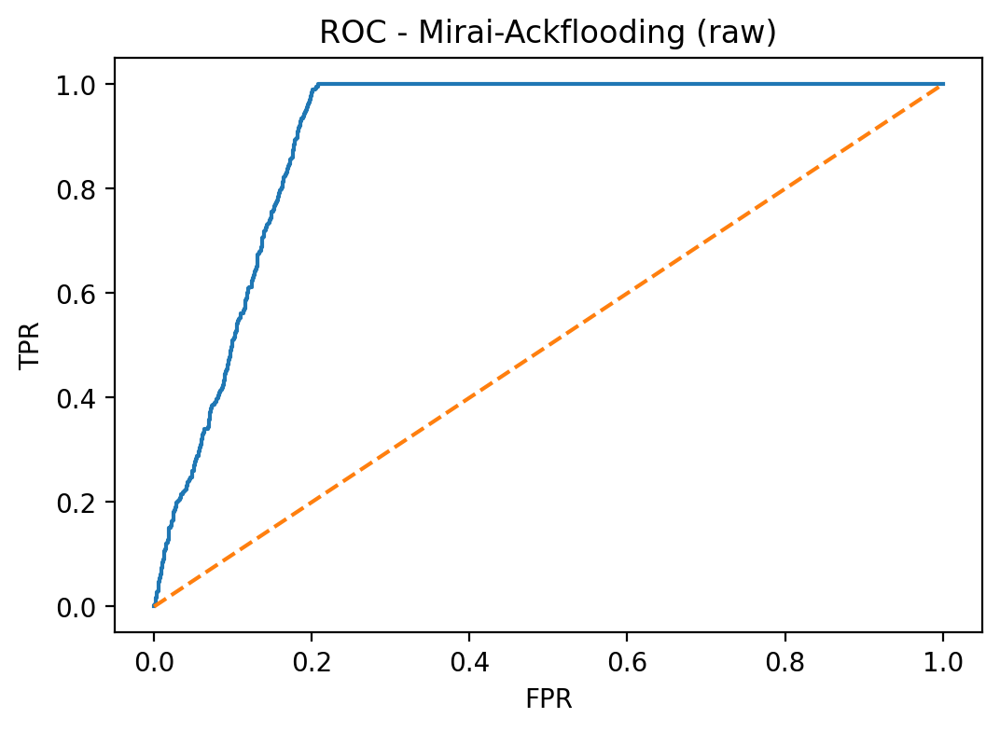

**plot_roc_raw_3_Mirai-HTTP_Flooding.png**

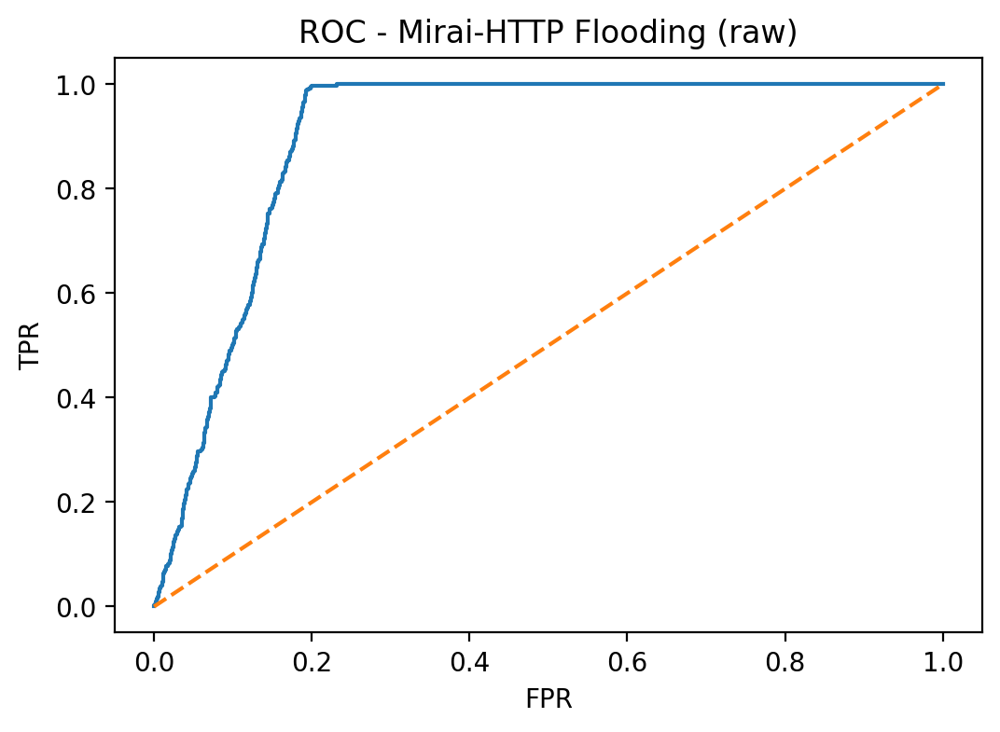

### Graphs 101–120

**plot_roc_raw_4_Mirai-Hostbruteforceg.png**

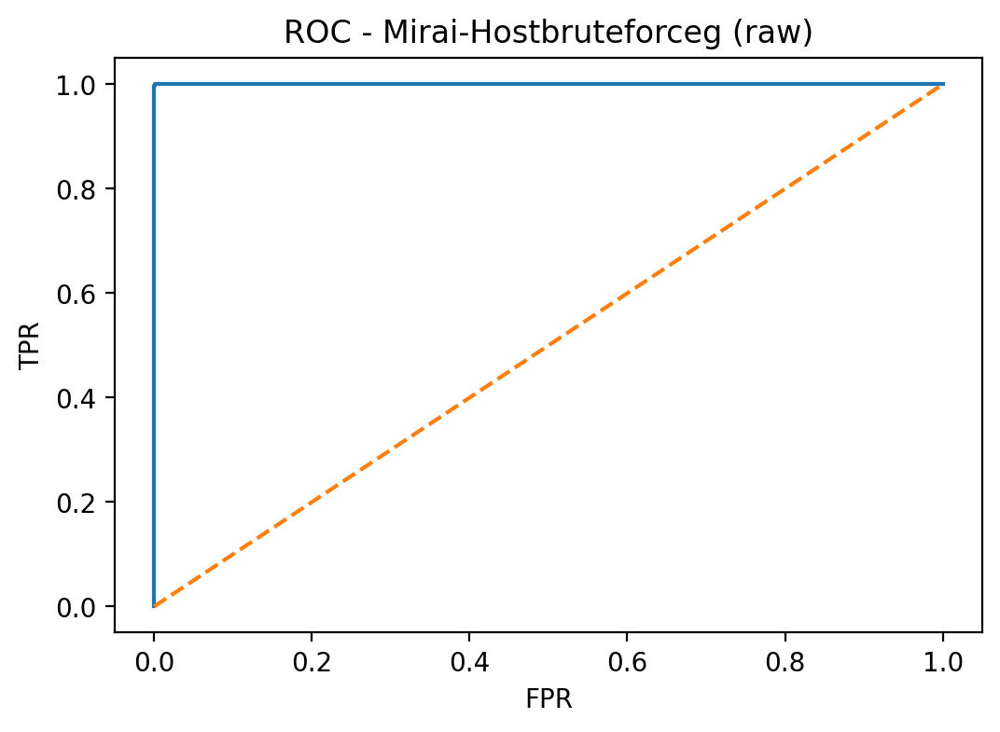

**plot_roc_raw_5_Mirai-UDP_Flooding.png**

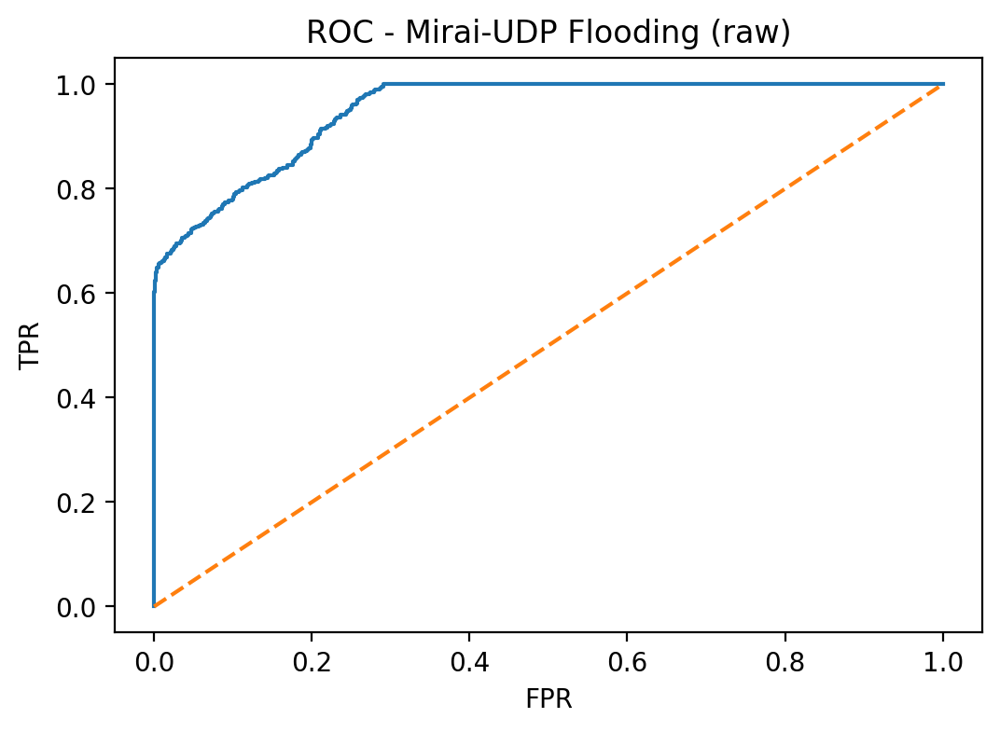

**plot_roc_raw_6_Normal.png**

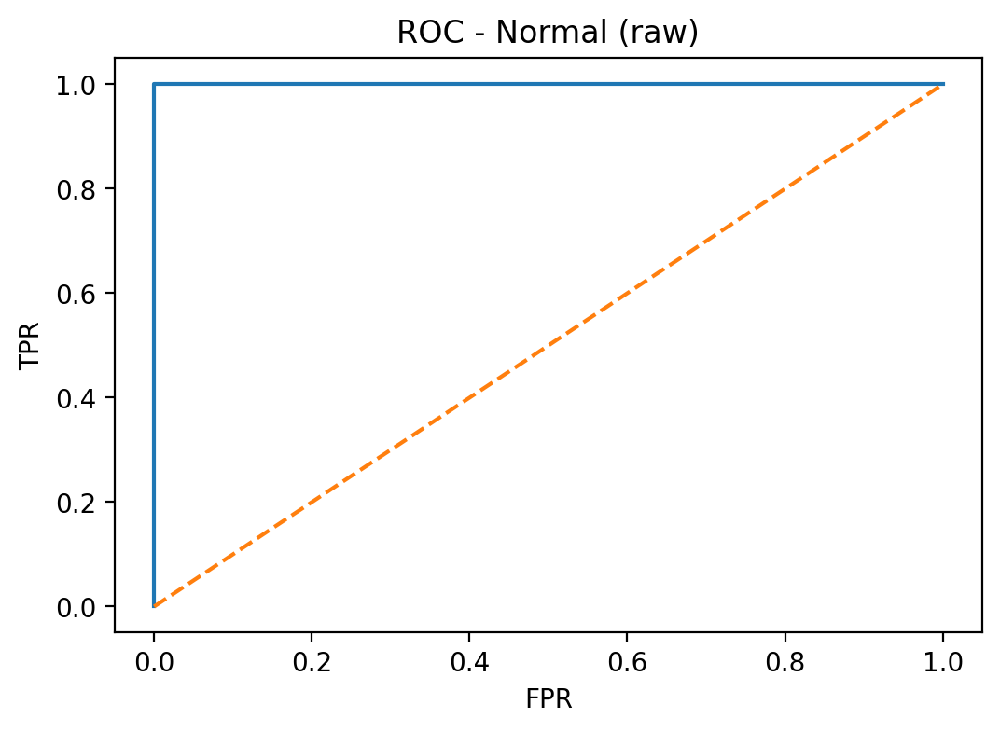

**plot_roc_raw_7_Scan_Hostport.png**

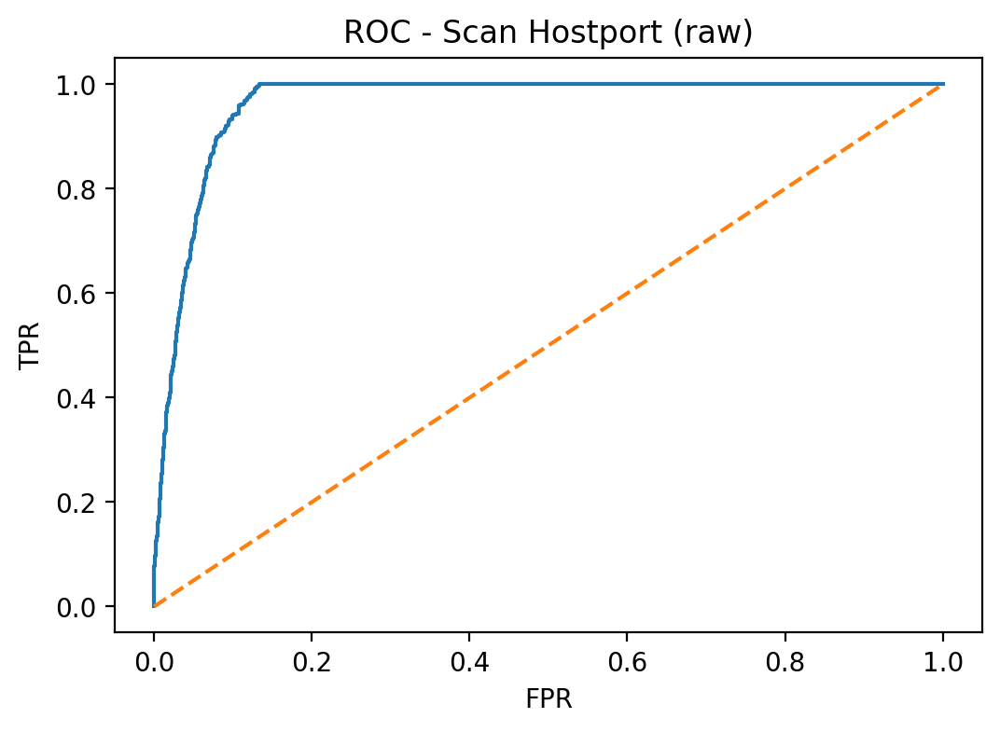

**plot_roc_raw_8_Scan_Port_OS.png**

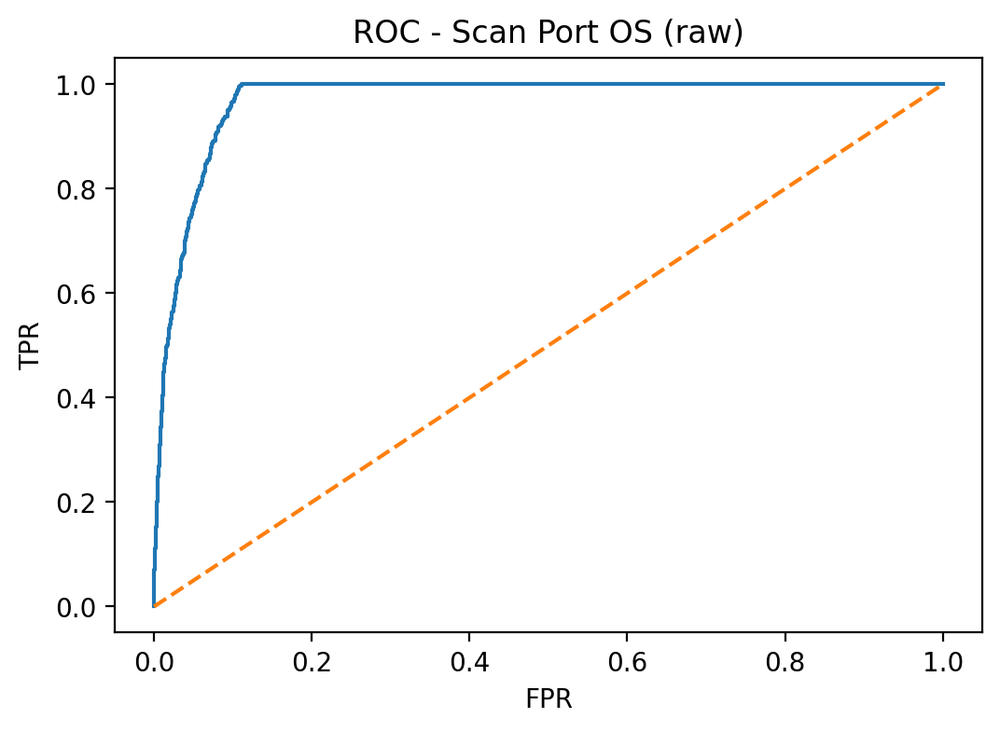

**plot_roc_stabilized_voteK5_0_DoS-Synflooding.png**

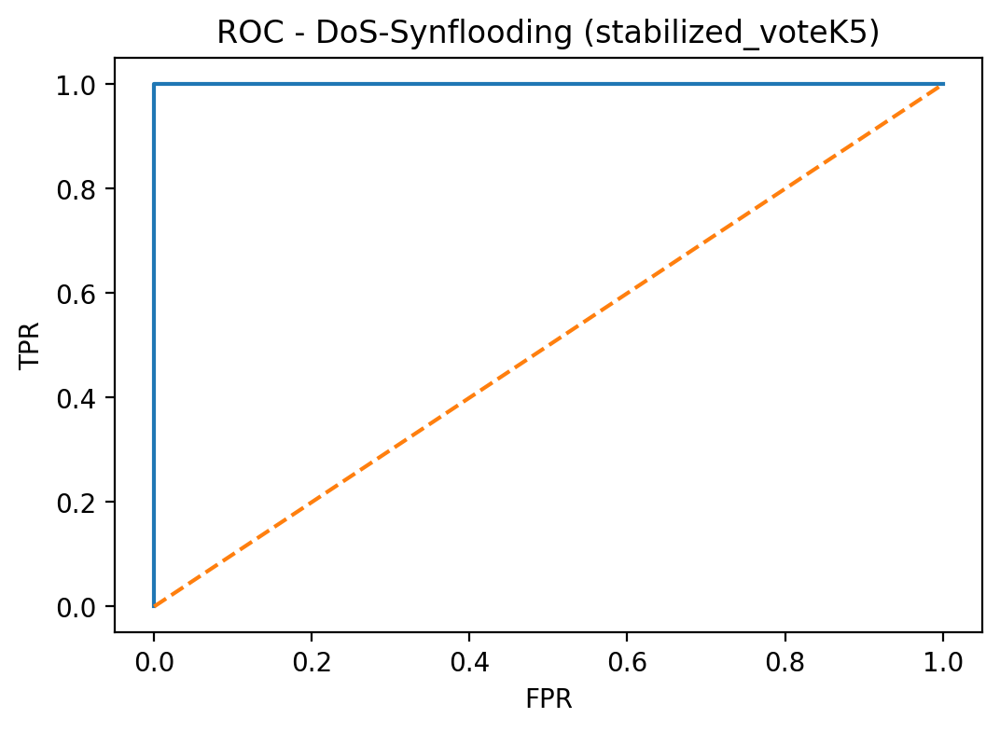

**plot_roc_stabilized_voteK5_1_MITM_ARP_Spoofing.png**

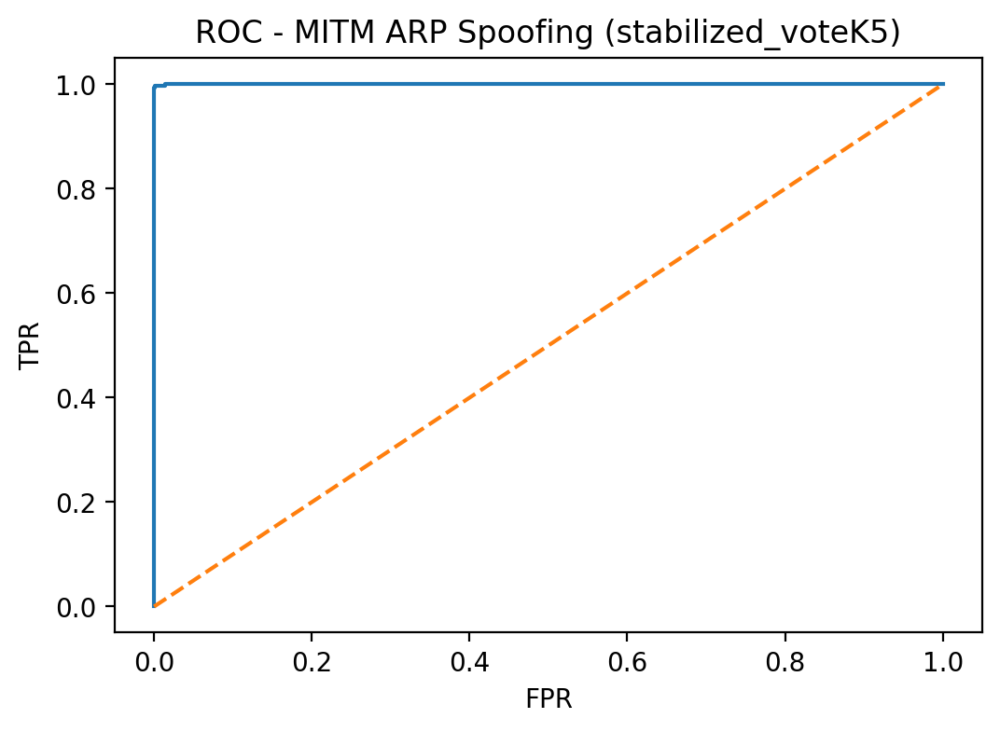

**plot_roc_stabilized_voteK5_2_Mirai-Ackflooding.png**

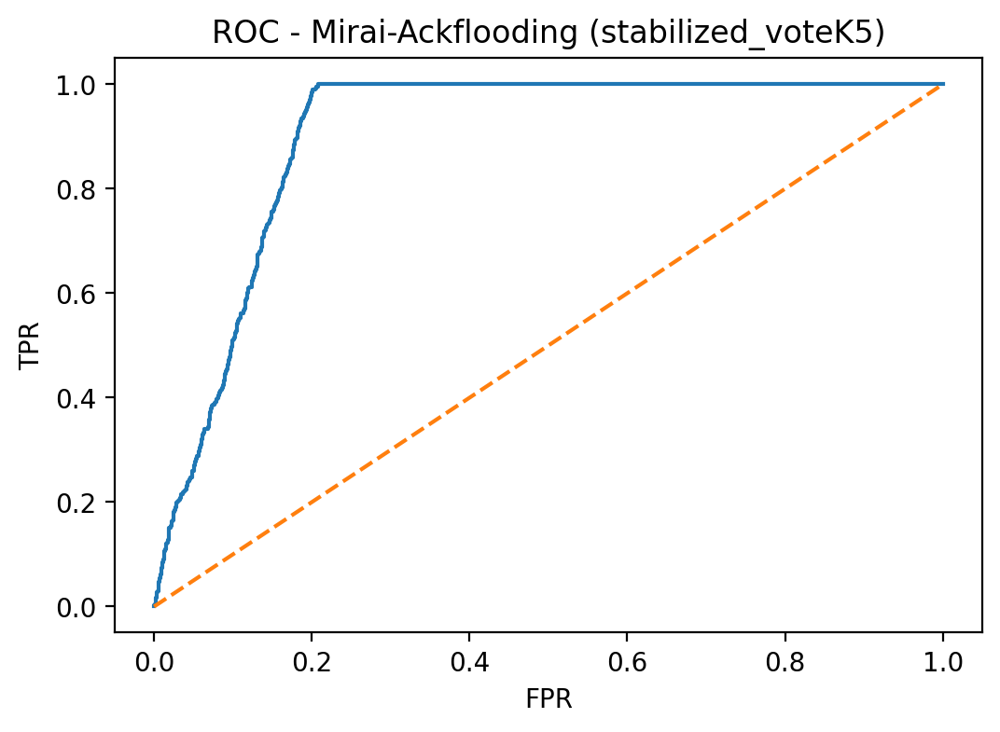

**plot_roc_stabilized_voteK5_3_Mirai-HTTP_Flooding.png**

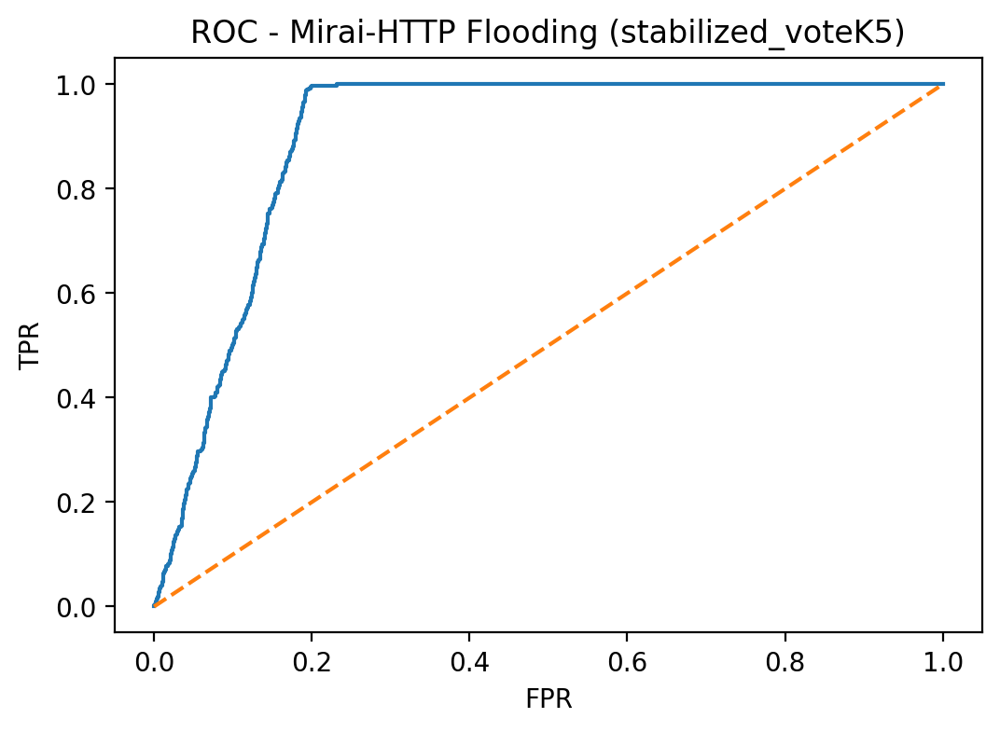

**plot_roc_stabilized_voteK5_4_Mirai-Hostbruteforceg.png**

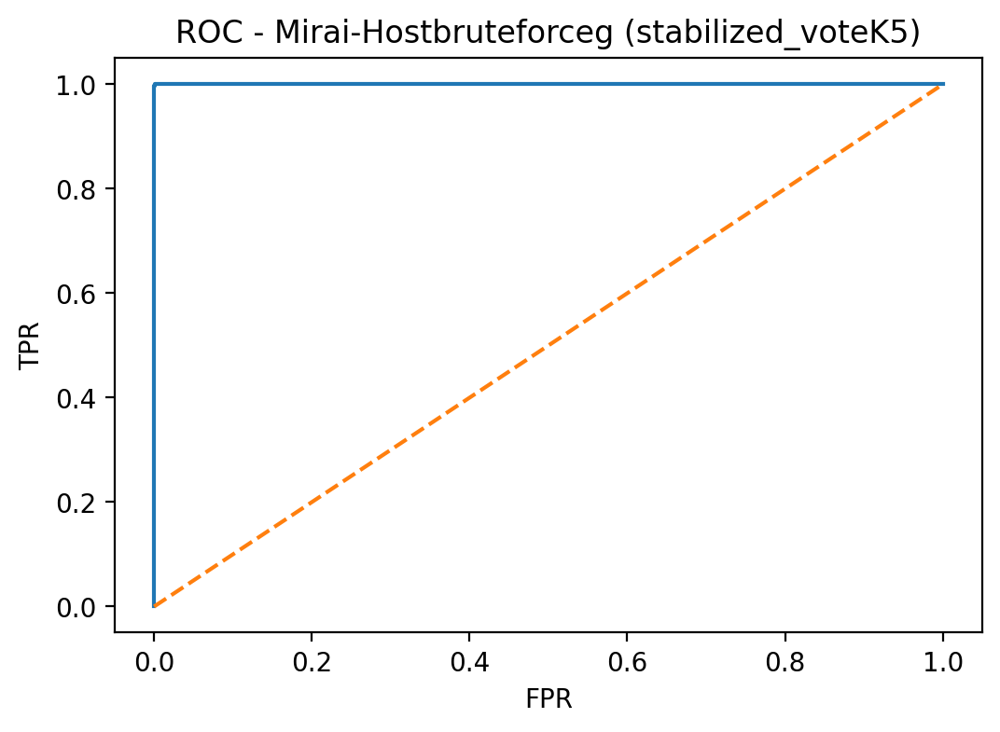

**plot_roc_stabilized_voteK5_5_Mirai-UDP_Flooding.png**

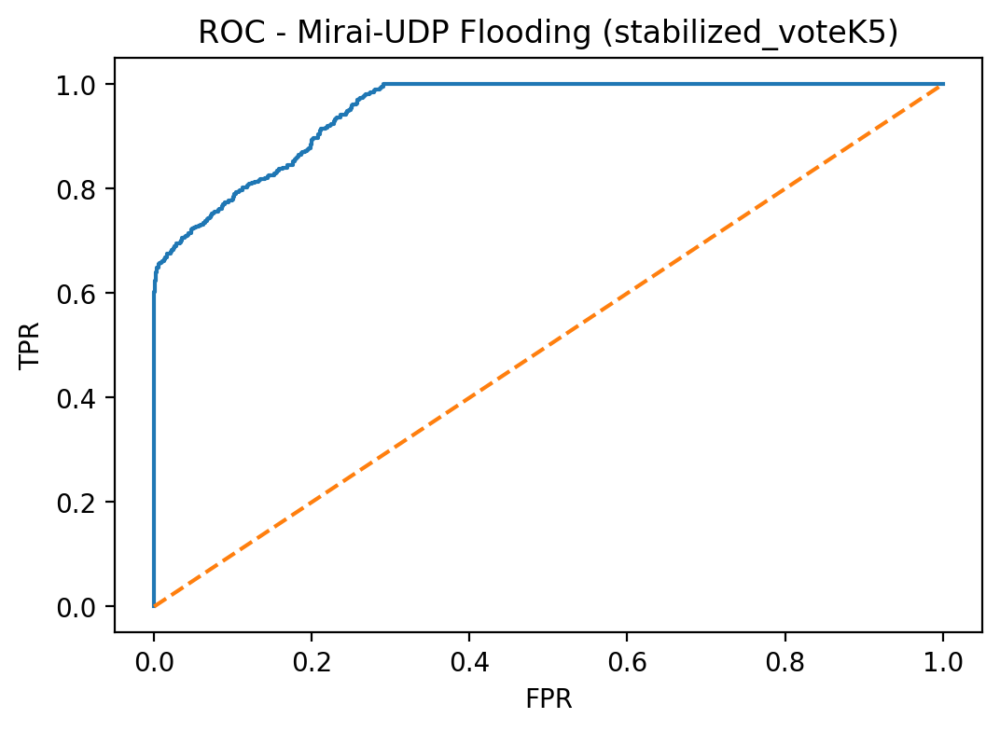

**plot_roc_stabilized_voteK5_6_Normal.png**

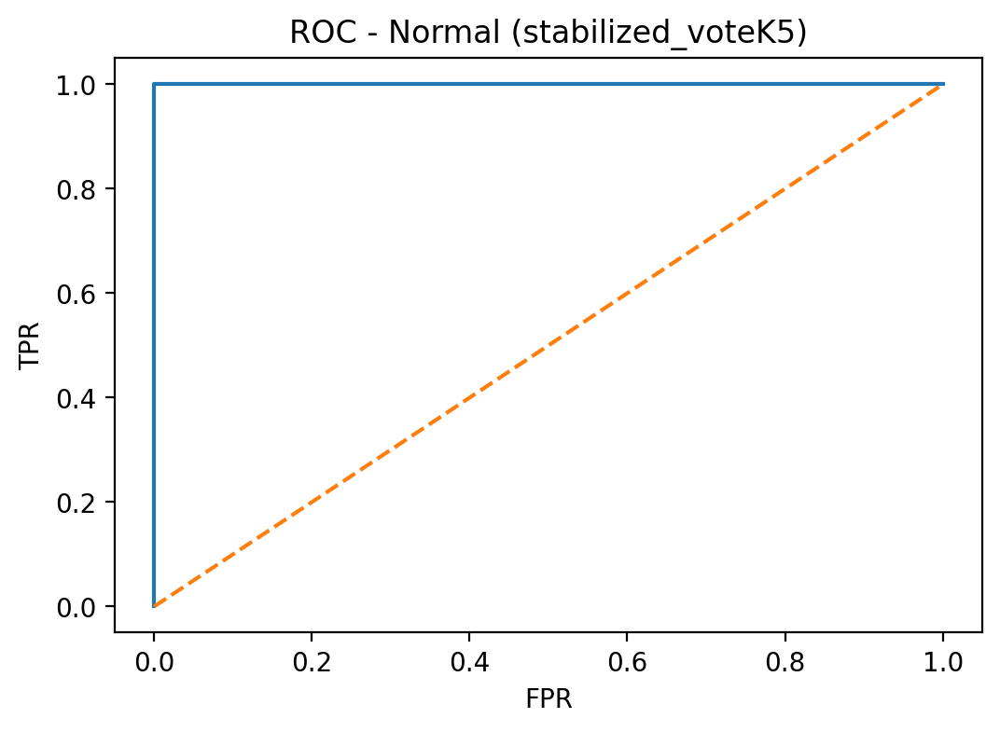

**plot_roc_stabilized_voteK5_7_Scan_Hostport.png**

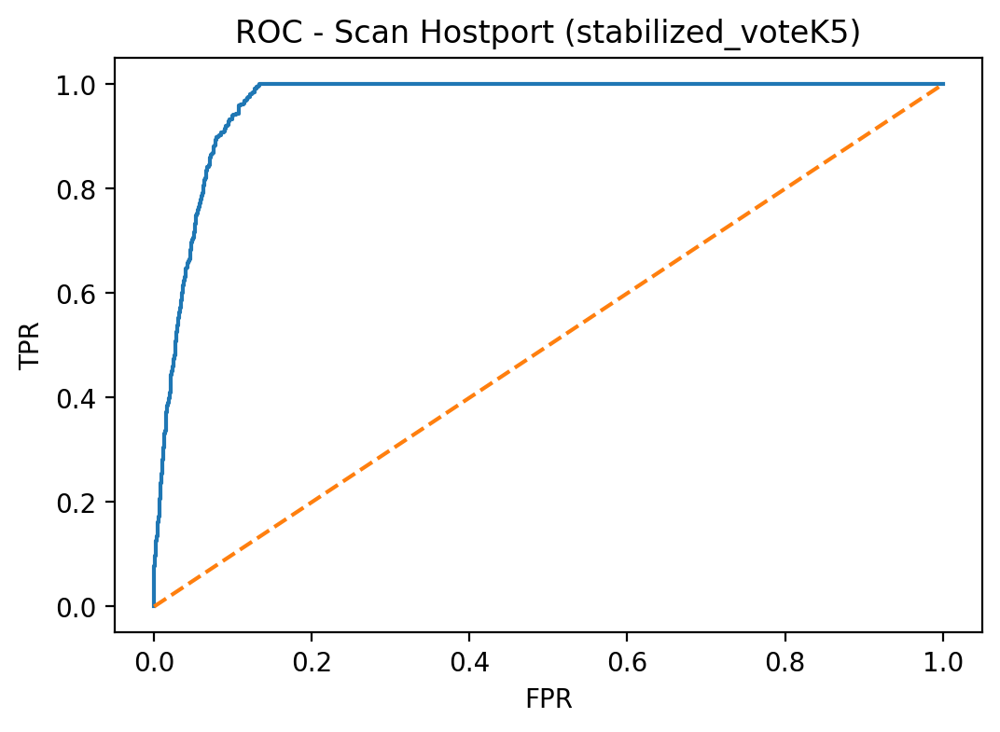

**plot_roc_stabilized_voteK5_8_Scan_Port_OS.png**

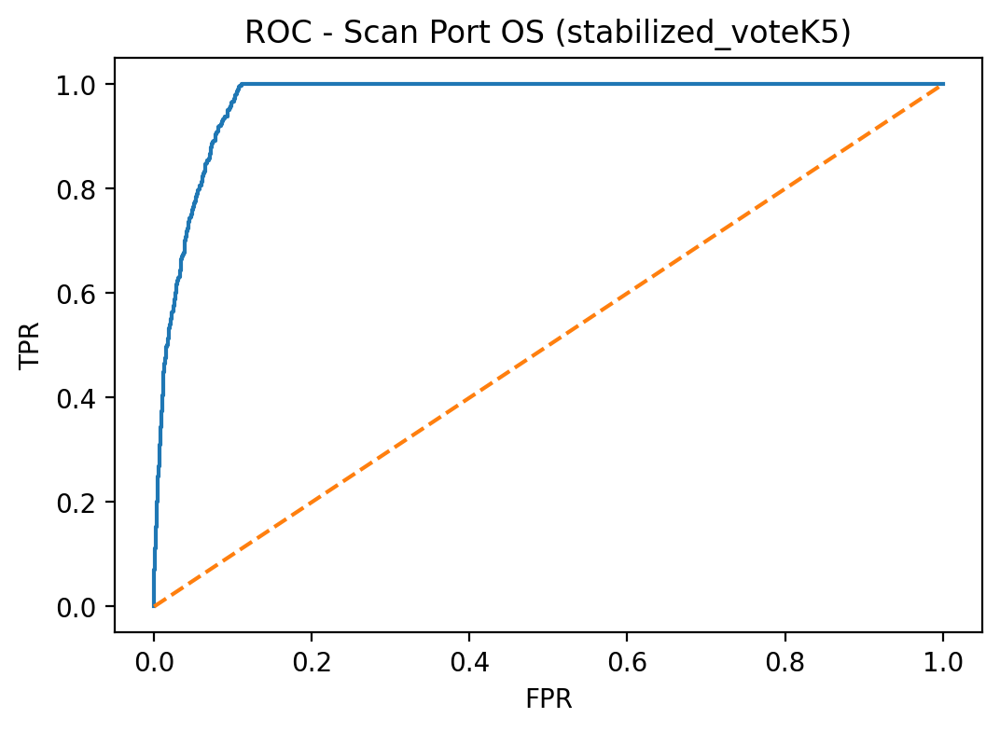

**plot_tcn_training_accuracy.png**

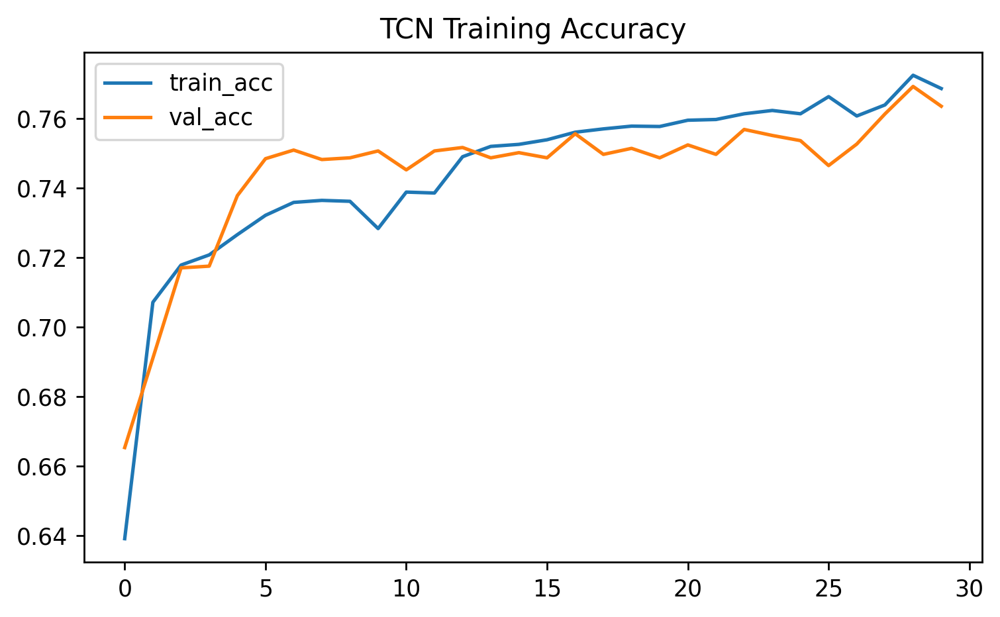

**plot_tcn_training_loss.png**

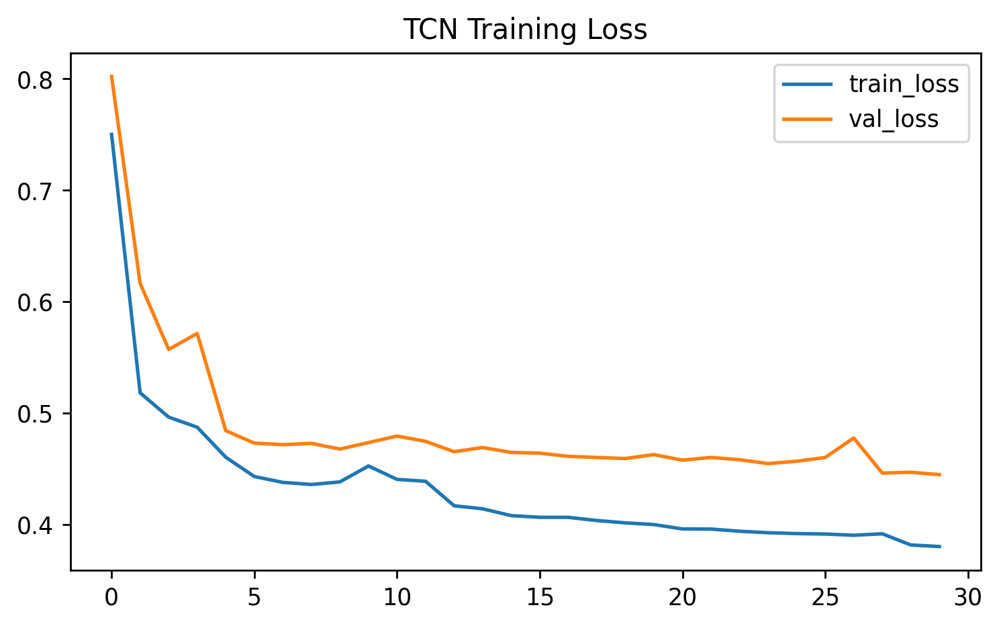

**plot_temperature_scaling.png**

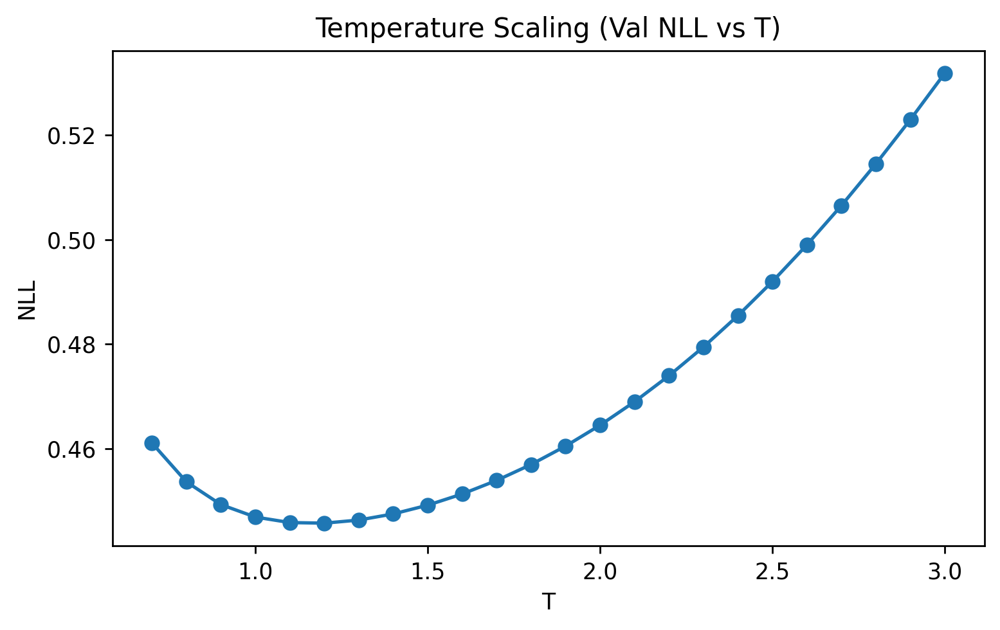

**plot_tsne_2d_train_subset.png**

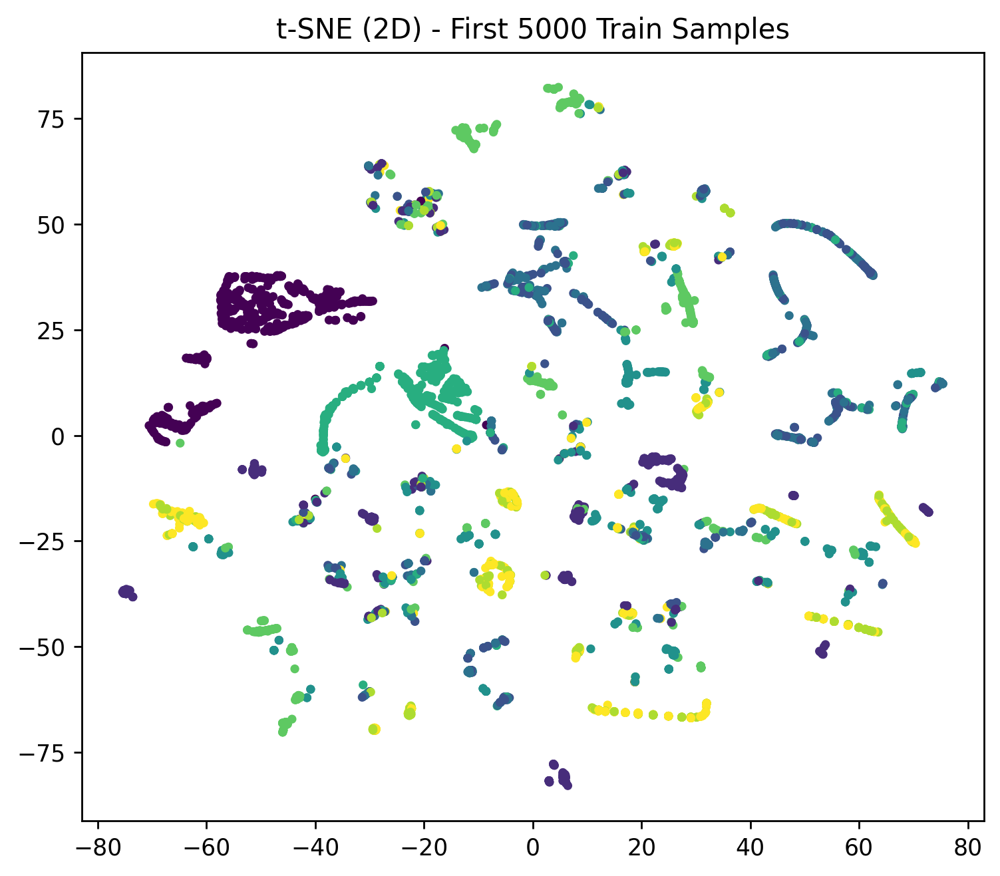

**table_auc_summary_confidence_thresholded.png**

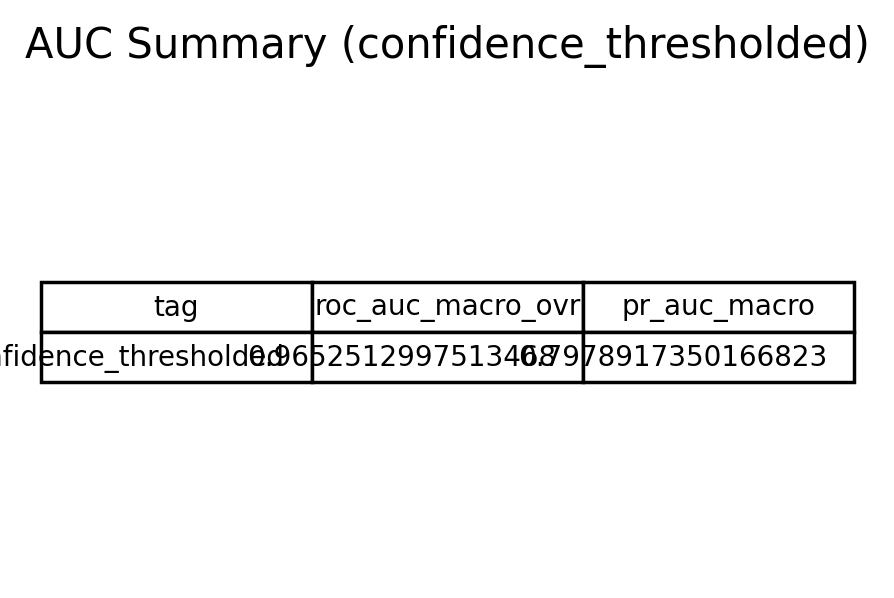

**table_auc_summary_raw.png**

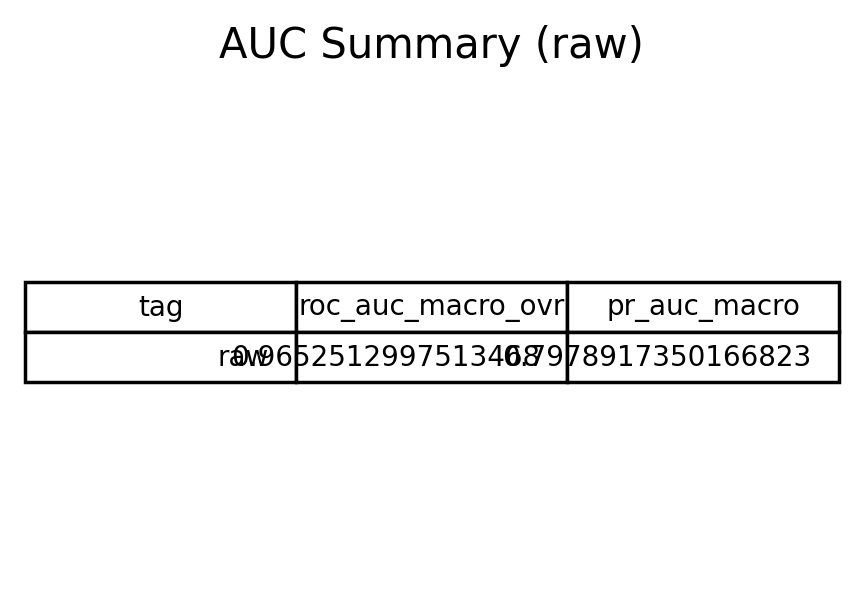

### Graphs 121–133

**table_auc_summary_stabilized_voteK5.png**

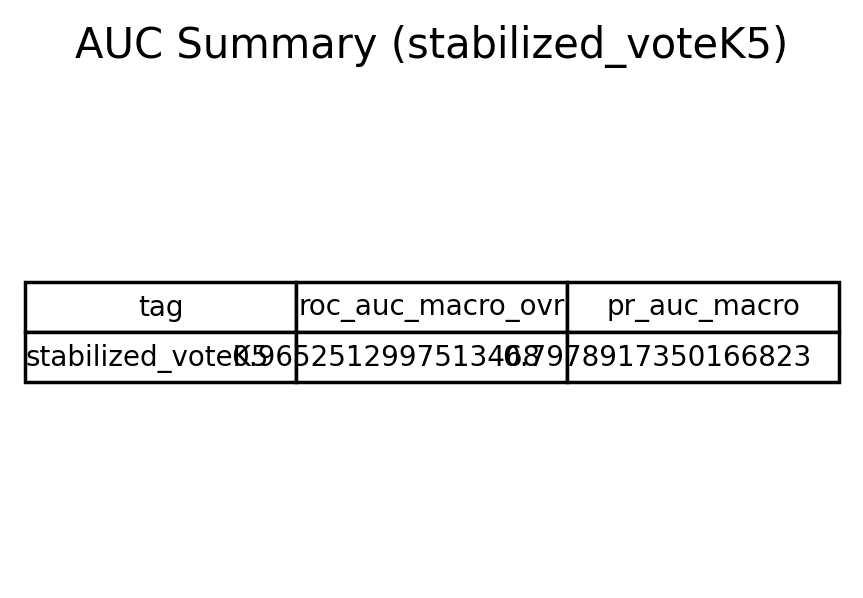

**table_baseline_auc_logreg.png**

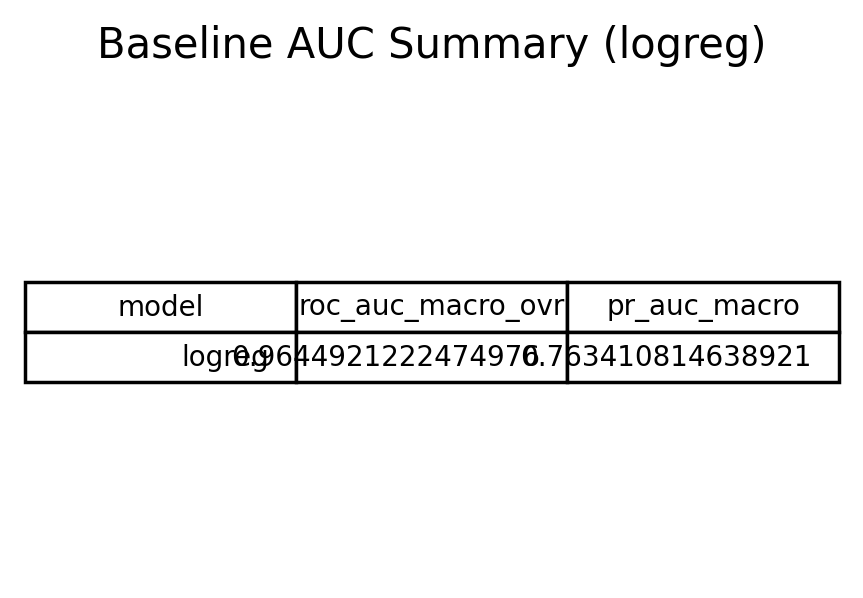

**table_baseline_auc_randomforest.png**

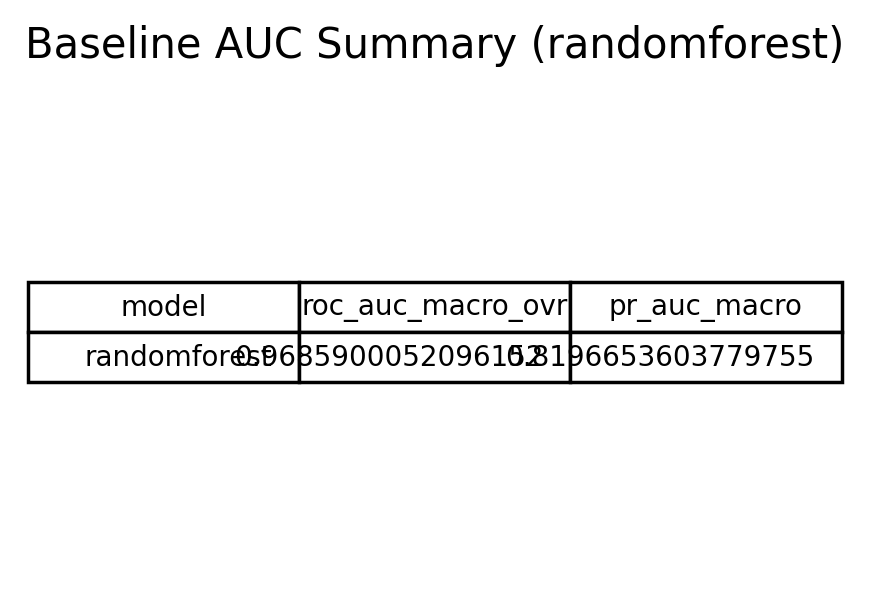

**table_baseline_report_logreg.png**

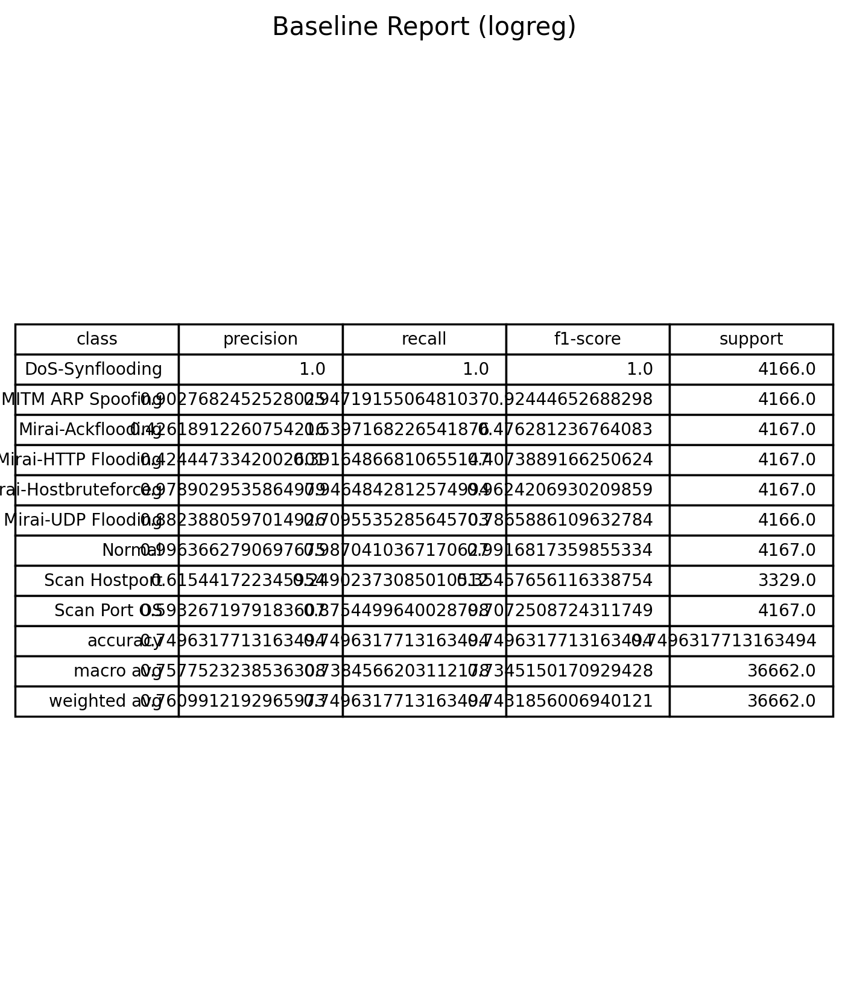

**table_baseline_report_randomforest.png**

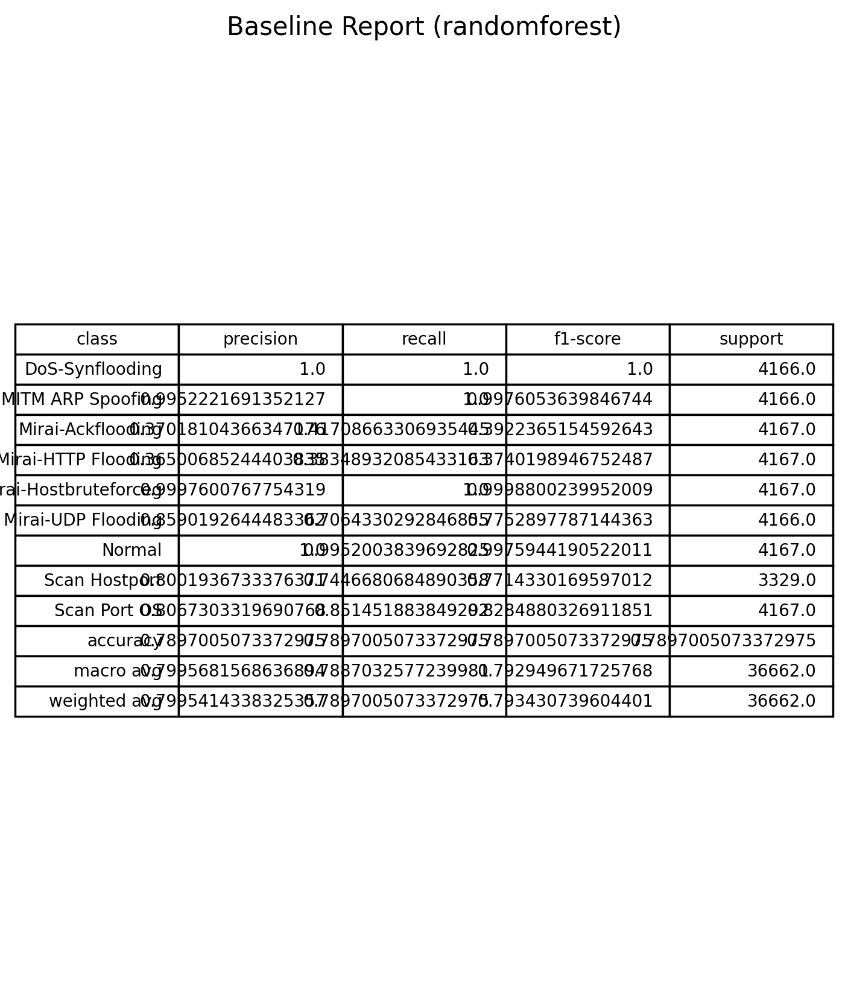

**table_class_distribution.png**

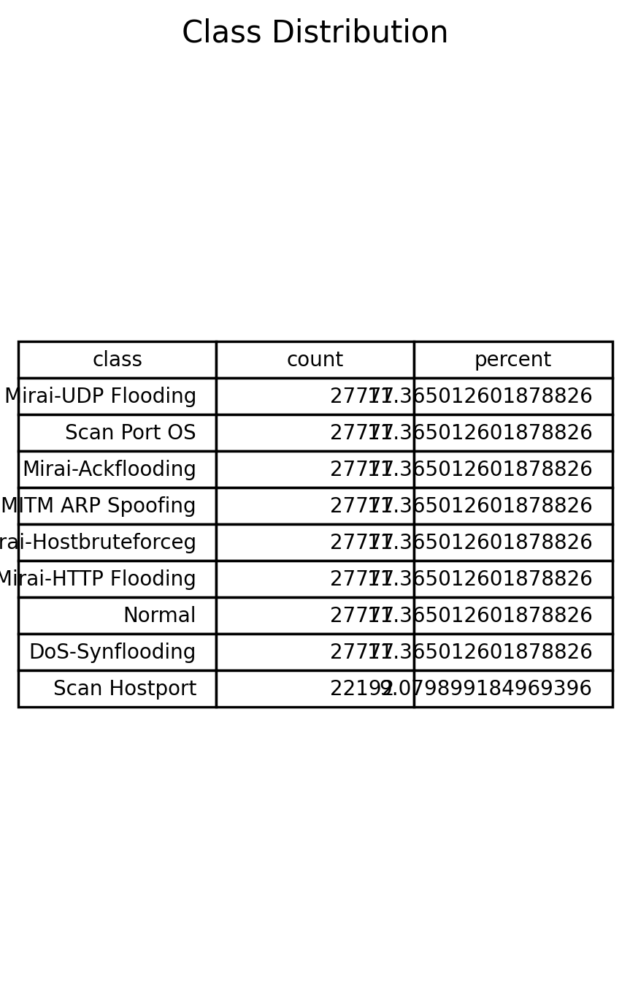

**table_class_thresholds.png**

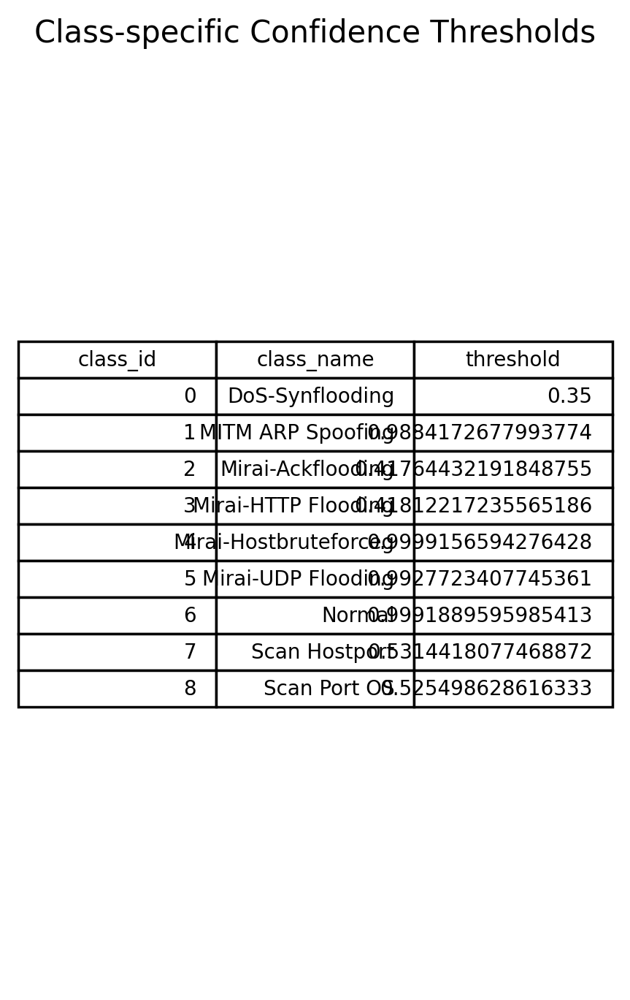

**table_classification_report_confidence_thresholded.png**

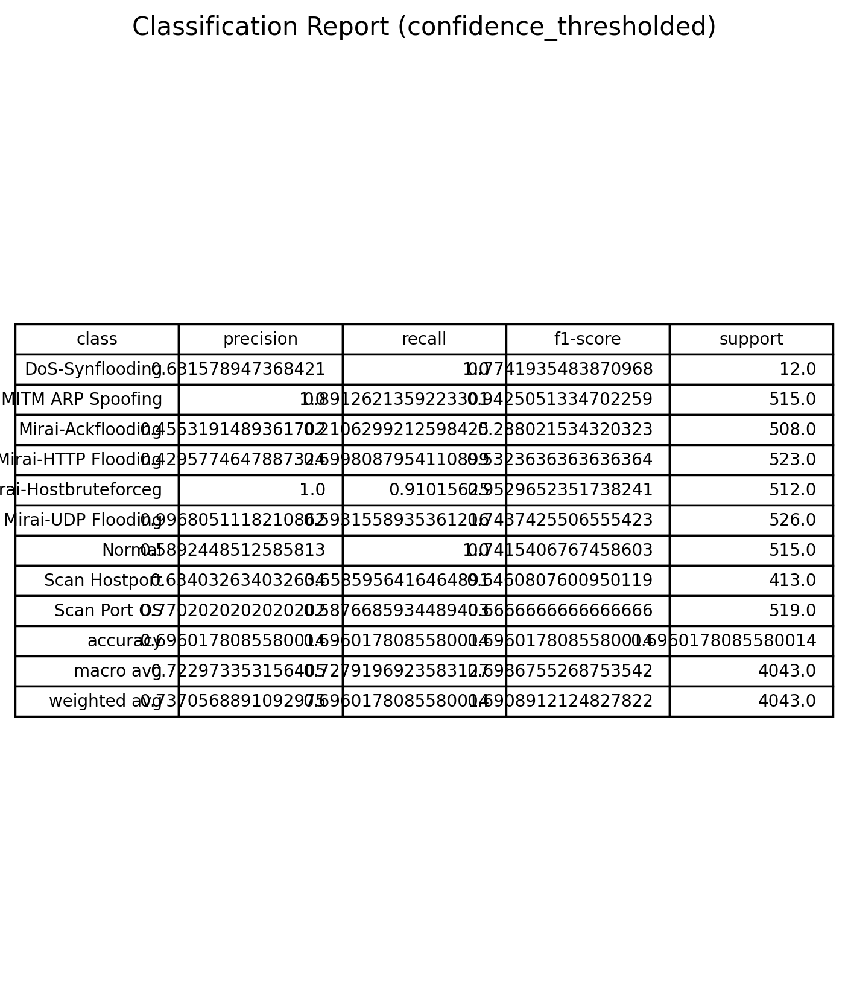

**table_classification_report_raw.png**

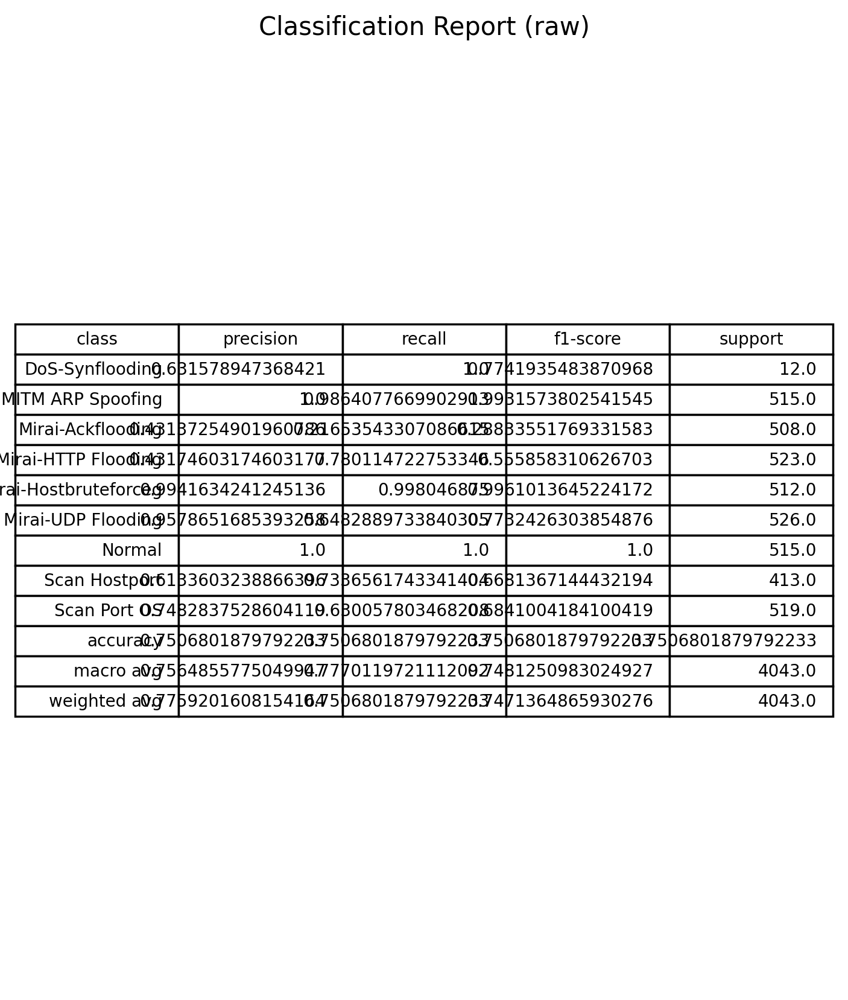

**table_classification_report_stabilized_voteK5.png**

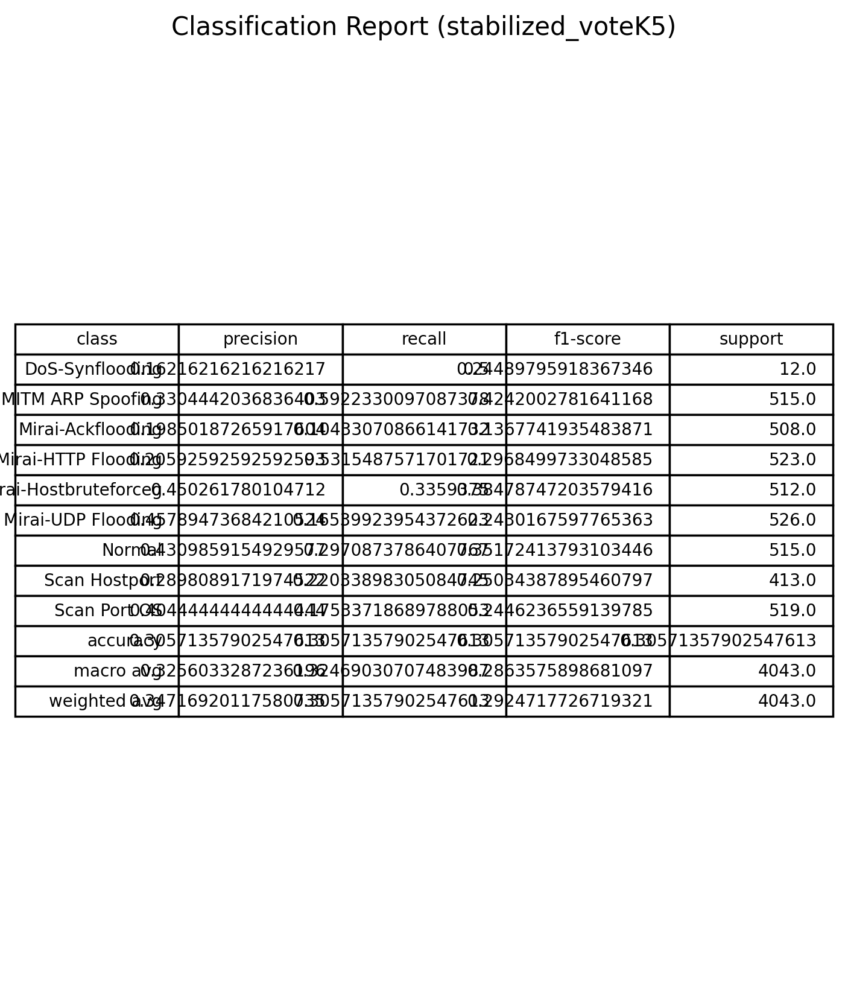

**table_feature_summary_stats.png**

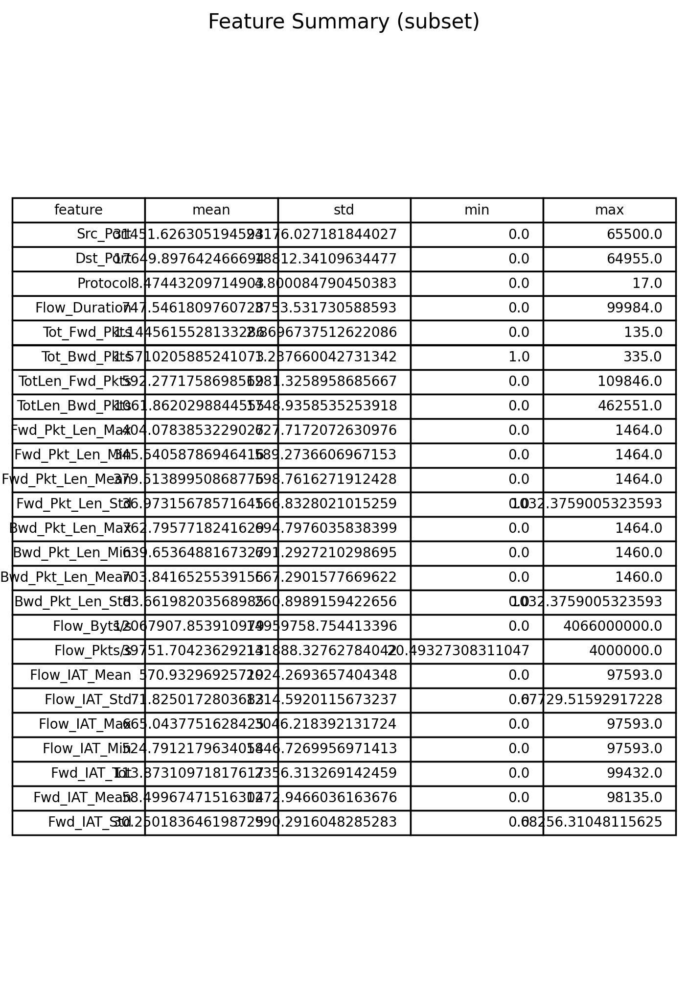

**table_missing_report.png**

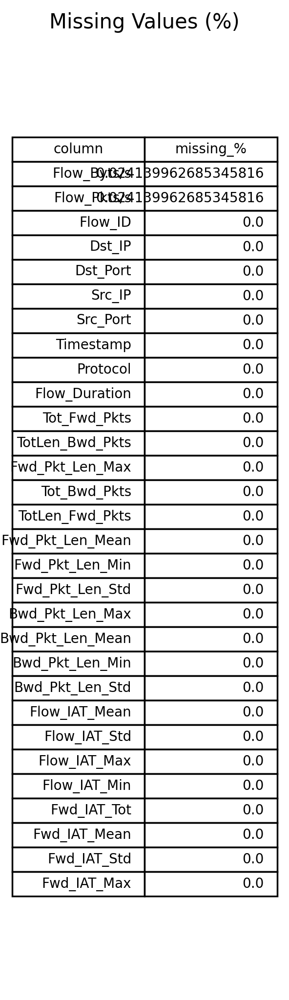

**table_rf_feature_importance_top30.png**

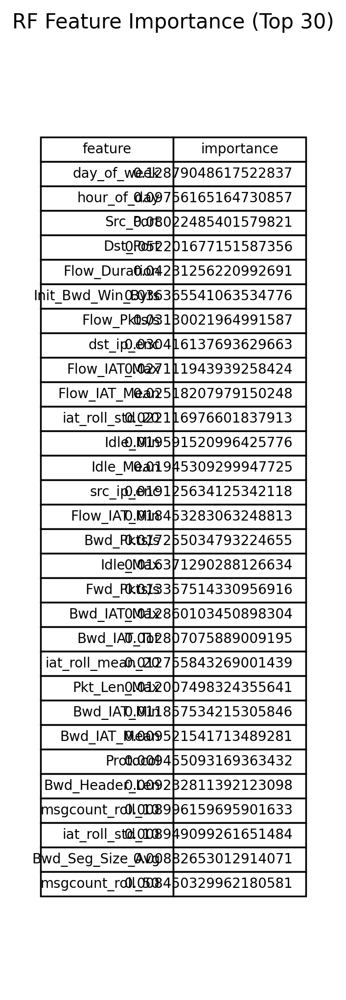

In [ ]:
# ============================================================
# DISPLAY ALL SAVED GRAPHS INLINE (Colab)
# ============================================================

import os, glob
from IPython.display import display, Image, Markdown

img_dir = OUTDIR  # e.g., "/content/iot_tcn_outputs"
pngs = sorted(glob.glob(os.path.join(img_dir, "*.png")))

display(Markdown(f"## ✅ Showing {len(pngs)} graphs from: `{img_dir}`"))

# Show in batches to avoid crashing the notebook UI
BATCH = 20
for i in range(0, len(pngs), BATCH):
    display(Markdown(f"### Graphs {i+1}–{min(i+BATCH, len(pngs))}"))
    for p in pngs[i:i+BATCH]:
        display(Markdown(f"**{os.path.basename(p)}**"))
        display(Image(filename=p))
